<a href="https://colab.research.google.com/github/Jeferson100/Predicao_inflacao_Python/blob/main/Previsao_inflacao.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importacao das bibliotecas

In [ ]:

!pip install pmdarima
##Solucao https://blog.csdn.net/qq_49821869/article/details/128540436
import os
os.kill(os.getpid(),9)


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 25.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 84.1 MB/s eta 0:00:00
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.12.2
    Uninstalling statsmodels-0.12.2:
      Successfully uninstalled statsmodels-0.12.2


In [ ]:
!pip install --upgrade pandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from pmdarima import arima

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import date

In [ ]:
## testes de aderencia e estacionaridades
#https://www.statsmodels.org/dev/examples/notebooks/generated/stationarity_detrending_adf_kpss.html
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss

In [ ]:
%matplotlib inline
sns.set(rc={'figure.figsize':(20,10)})

#Importando dados

In [ ]:
meta_dados = pd.read_csv('/content/metadados.csv',header=0,sep=';')

In [ ]:
meta_dados


,variavel,acronimo,unidade,fonte,codigo
0,Índice Nacional de Preços ao Consumidor Amplo ...,ipca,% a.m.,IBGE,/t/1737/n1/all/v/63/p/all/d/v63%202
1,Taxa de câmbio - Livre - Venda - Média mensal,cambio,R$/US$,BCB,3698
2,"Interesse por ""seguro desemprego"" - Brasil",seguro_desemprego,Índice,Google Trends,seguro desemprego
3,Custo médio m² - Construção Civil - Variação %...,custo_m2,%,IBGE,/t/2296/n1/all/v/1198/p/all/d/v1198%202
4,Taxa de juros pré fixada - Estrutura a termo -...,ltn,% a.a.,IPEADATA,ANBIMA12_TJTLN1212
5,PIB mensal - Valores correntes,pib_mensal,R$ milhões,BCB,4380
6,Índice geral de preços - Mercado (IGP-M) - FGV,igp_m,% a.m.,BCB,189
7,Índice geral de preços - Disponibilidade inter...,igp_di,% a.m.,BCB,190
8,Meios de pagamento - M1 - Média dos dias úteis...,m1,R$ mil,BCB,27788
9,Meios de pagamento amplos - M2 - Saldo em fina...,m2,R$ mil,BCB,27810


In [ ]:
data_inicio = '2002-12-01'

## Importando dados do Banco central

In [ ]:
def consulta_bc(codigo_bcb,inicio):
  url = 'http://api.bcb.gov.br/dados/serie/bcdata.sgs.{}/dados?formato=json'.format(codigo_bcb)
  df = pd.read_json(url)
  df['data'] = pd.to_datetime(df['data'], dayfirst=True)
  df.set_index('data', inplace=True)
  df = df[df.index >= inicio]
  return df

In [ ]:
data_inicio

'2002-12-01'

In [ ]:
##Esse codigo gera um range de datas mensas(MS SIGINIFICA QUE ELE PEGA O PRIMEIRO DIA DO MES) DO INICO DO PERIODO ATE OS DIAS ATUAIS
freq = pd.date_range(start=data_inicio,end=date.today(),freq='MS')

In [ ]:
dados= pd.DataFrame(index=pd.date_range(start=data_inicio,end=date.today(),freq='MS'))
for i,j in zip(meta_dados[meta_dados['fonte'] == 'BCB']['codigo'],meta_dados[meta_dados['fonte'] == 'BCB']['codigo'].index):
  coluna =  meta_dados[meta_dados.index == j]['acronimo']
  dados[list(coluna)] = consulta_bc(i,data_inicio)

In [ ]:
dados['m2'] = dados['m2'].dropna().astype(int)
dados['m3'] = dados['m3'].dropna().astype(int)
dados['m4'] = dados['m4'].dropna().astype(int)

In [ ]:
dados

,cambio,pib_mensal,igp_m,igp_di,m1,m2,m3,m4,estoque_caged,saldo_bc,vendas_auto,divida_liquida_spc
2002-12-01,3.6259,130241.2,3.75,2.70,104796074.0,4.003418e+08,6.911076e+08,8.000359e+08,21587374.0,1711.3,101350.0,59.93
2003-01-01,3.4384,125711.1,2.33,2.17,101244913.0,3.912371e+08,6.960545e+08,8.102725e+08,21622859.0,1059.3,94946.0,59.97
2003-02-01,3.5908,131383.0,2.28,1.59,94540598.0,3.939761e+08,7.067884e+08,8.157451e+08,21706888.0,1022.7,94160.0,60.26
2003-03-01,3.4469,140147.5,1.53,1.66,92128694.0,3.881425e+08,7.107120e+08,8.208595e+08,21728149.0,1437.3,80693.0,58.46
2003-04-01,3.1187,141003.2,0.92,0.41,90394890.0,3.854677e+08,7.128001e+08,8.234891e+08,21882173.0,1616.2,85496.0,54.44
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-01,5.2370,826649.4,-0.95,-1.22,593173638.0,4.851378e+09,9.586358e+09,1.046715e+10,42847208.0,2052.4,143208.0,56.92
2022-10-01,5.2503,836439.7,-0.97,-0.62,588217413.0,4.856013e+09,9.617748e+09,1.052649e+10,43009237.0,2130.6,136997.0,57.01
2022-11-01,5.2747,832859.3,-0.56,-0.18,587629183.0,4.893001e+09,9.592376e+09,1.054685e+10,43144732.0,5140.0,158766.0,57.01
2022-12-01,5.2424,NaN,0.45,0.31,NaN,NaN,NaN,NaN,NaN,NaN,164169.0,NaN


##Importando dados do IpeaData
https://analisemacro.com.br/economia/indicadores/coletando-dados-do-ipeadata-com-python/#:~:text=Por%20fim%2C%20para%20extrair%20os,traz%20a%20data%20no%20%C3%ADndice.


In [ ]:
!pip install ipeadatapy
import ipeadatapy as ip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#Lista das series
#ip.list_series()

In [ ]:
##Pesquisando
#ip.list_series('Caged')

In [ ]:
##Mais informacoes sobre o conjunto de dados
#ip.describe('ANBIMA12_TJTLN1212')

In [ ]:
meta_dados[meta_dados['fonte'] == 'IPEADATA']

,variavel,acronimo,unidade,fonte,codigo
4,Taxa de juros pré fixada - Estrutura a termo -...,ltn,% a.a.,IPEADATA,ANBIMA12_TJTLN1212
15,Imposto sobre a renda (IR) - Total - Receita b...,ir,R$ milhões,IPEADATA,SRF12_IR12
16,Ibovespa - Índice de ações - Fechamento - Anbima,ibovespa,% a.m.,IPEADATA,ANBIMA12_IBVSP12
20,Consumo de energia elétrica - Comercial - Quan...,consumo_energia,GWh,IPEADATA,ELETRO12_CEET12
21,Preço - petróleo bruto - Brent - FOB - Energy ...,brent_fob,US$/barril,IPEADATA,EIA366_PBRENT366


In [ ]:
"""
lista = ['EIA366_PBRENT366','ANBIMA12_TJTLN1212','SRF12_IR12','ANBIMA12_IBVSP12','ELETRO12_CEET12']
for i,j in zip(meta_dados[meta_dados['fonte'] == 'IPEADATA']['codigo'],meta_dados[meta_dados['fonte'] == 'IPEADATA']['codigo'].index):
  if i == 'EIA366_PBRENT366':
    brent_fob	 = ip.timeseries('EIA366_PBRENT366',yearGreaterThan = int(data_inicio[0:4])-1).iloc[:,-1]
    brent_fob = brent_fob.resample('MS').mean()
    brent_fob = brent_fob[brent_fob.index >= data_inicio]
    dados = pd.concat([dados,brent_fob],axis=1)
    dados.rename(columns={'VALUE (US$)':'brent_fob'},inplace=True) 
  else:
    lista= []
    coluna =  meta_dados[meta_dados.index == j]['acronimo']
    ipeadata = ip.timeseries(i,yearGreaterThan = int(data_inicio[0:4])-1).iloc[:,-1]
    ipeadata = ipeadata[ipeadata.index >= data_inicio]
    dados[list(coluna)[0]] = ipeadata
  """

"\nlista = ['EIA366_PBRENT366','ANBIMA12_TJTLN1212','SRF12_IR12','ANBIMA12_IBVSP12','ELETRO12_CEET12']\nfor i,j in zip(meta_dados[meta_dados['fonte'] == 'IPEADATA']['codigo'],meta_dados[meta_dados['fonte'] == 'IPEADATA']['codigo'].index):\n  if i == 'EIA366_PBRENT366':\n    brent_fob\t = ip.timeseries('EIA366_PBRENT366',yearGreaterThan = int(data_inicio[0:4])-1).iloc[:,-1]\n    brent_fob = brent_fob.resample('MS').mean()\n    brent_fob = brent_fob[brent_fob.index >= data_inicio]\n    dados = pd.concat([dados,brent_fob],axis=1)\n    dados.rename(columns={'VALUE (US$)':'brent_fob'},inplace=True) \n  else:\n    lista= []\n    coluna =  meta_dados[meta_dados.index == j]['acronimo']\n    ipeadata = ip.timeseries(i,yearGreaterThan = int(data_inicio[0:4])-1).iloc[:,-1]\n    ipeadata = ipeadata[ipeadata.index >= data_inicio]\n    dados[list(coluna)[0]] = ipeadata\n  "

In [ ]:
##Passei o codigo acima para melhora no SHAT GPD
# Create a list of data sources
"""Observação:

Em vez de usar a zip()função, usei um forloop para percorrer a lista de fontes de dados.
Eu removi a listavariável desnecessária e, em vez disso, usei o tolist()método para converter a codigocoluna em uma lista de fontes de dados.
Para obter a sigla de cada fonte de dados, usei o locmétodo para acessar a linha com o codigovalor correspondente e, em seguida, selecionei a acronimocoluna.
Substituí a list(coluna)[0]variável acronympor para atribuir os dados à coluna correta no dadosDataFrame."""



data_sources = meta_dados[meta_dados['fonte'] == 'IPEADATA']['codigo'].tolist()

# Iterate through data sources
for i in data_sources:
  if i == 'EIA366_PBRENT366':
    brent_fob = ip.timeseries(i, yearGreaterThan=int(data_inicio[0:4])-1).iloc[:,-1]
    brent_fob = brent_fob.resample('MS').mean()
    brent_fob = brent_fob[brent_fob.index >= data_inicio]
    dados = pd.concat([dados, brent_fob], axis=1)
    dados.rename(columns={'VALUE (US$)':'brent_fob'}, inplace=True)
  else:
    acronym = meta_dados.loc[meta_dados['codigo'] == i, 'acronimo'].values[0]
    ipeadata = ip.timeseries(i, yearGreaterThan=int(data_inicio[0:4])-1).iloc[:,-1]
    ipeadata = ipeadata[ipeadata.index >= data_inicio]
    dados[acronym] = ipeadata


In [ ]:
dados.head()

,cambio,pib_mensal,igp_m,igp_di,m1,m2,m3,m4,estoque_caged,saldo_bc,vendas_auto,divida_liquida_spc,ltn,ir,ibovespa,consumo_energia,brent_fob
2002-12-01,3.6259,130241.2,3.75,2.70,104796074.0,400341786.0,691107613.0,800035851.0,21587374.0,1711.3,101350.0,59.93,32.201190,8185.507478,7.232585,24949.0,27.840357
2003-01-01,3.4384,125711.1,2.33,2.17,101244913.0,391237088.0,696054502.0,810272451.0,21622859.0,1059.3,94946.0,59.97,28.119707,8901.340339,-2.902023,25152.0,31.146552
2003-02-01,3.5908,131383.0,2.28,1.59,94540598.0,393976058.0,706788435.0,815745074.0,21706888.0,1022.7,94160.0,60.26,29.684832,7025.996173,-6.041495,24965.0,32.426786
2003-03-01,3.4469,140147.5,1.53,1.66,92128694.0,388142457.0,710712013.0,820859498.0,21728149.0,1437.3,80693.0,58.46,28.138087,6576.185406,9.659533,25281.0,31.240645
2003-04-01,3.1187,141003.2,0.92,0.41,90394890.0,385467653.0,712800120.0,823489095.0,21882173.0,1616.2,85496.0,54.44,25.636490,9123.114412,11.381176,24787.0,25.423333


In [ ]:
dados.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 242 entries, 2002-12-01 to 2023-01-01
Freq: MS
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   cambio              241 non-null    float64
 1   pib_mensal          240 non-null    float64
 2   igp_m               241 non-null    float64
 3   igp_di              241 non-null    float64
 4   m1                  240 non-null    float64
 5   m2                  240 non-null    float64
 6   m3                  240 non-null    float64
 7   m4                  240 non-null    float64
 8   estoque_caged       240 non-null    float64
 9   saldo_bc            240 non-null    float64
 10  vendas_auto         241 non-null    float64
 11  divida_liquida_spc  240 non-null    float64
 12  ltn                 242 non-null    float64
 13  ir                  240 non-null    float64
 14  ibovespa            241 non-null    float64
 15  consumo_energia     240 non-n

##Importando dados de expectativa de inflacao (Focus/BCB)
https://wilsonfreitas.github.io/python-bcb/expectativas.html#bcb.Expectativas

https://analisemacro.com.br/economia/indicadores/como-coletar-dados-do-boletim-focus-com-o-python/

In [ ]:
meta_dados[meta_dados['fonte']=='Focus/BCB']

,variavel,acronimo,unidade,fonte,codigo
22,Expectativas de mercado mensais de inflação - ...,expectativa_ipca,%,Focus/BCB,IPCA


In [ ]:
!pip install python-bcb

from bcb import Expectativas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 KB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.5/71.5 KB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.6/69.6 KB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 KB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.6/80.6 KB 10.7 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.25.1
    Uninstalling requests-2.25.1:
      Successfully uninstalled requests-2.25.1


ExpectativasMercadoTop5Anuais: Expectativas de mercado anuais para os indicadores do Top 5

ExpectativasMercadoInstituicoes: Expectativas de mercado informadas pelas instituições credenciadas

ExpectativaMercadoMensais: Expectativas de Mercado Mensais

ExpectativasMercadoInflacao12Meses: Expectativas de mercado para inflação nos próximos 12 meses

ExpectativasMercadoTop5Mensais: Expectativas de mercado mensais para os indicadores do Top 5

ExpectativasMercadoTrimestrais: Expectativas de Mercado Trimestrais

ExpectativasMercadoAnuais: Expectativas de Mercado Anuais

In [ ]:
"""# End point
em = Expectativas()
ep = em.get_endpoint('ExpectativasMercadoAnuais')

# Dados do IPCA

ipca_expec = (ep.query()
 .filter(ep.Indicador == 'IPCA')
 .filter(ep.Data >= data_inicio)
 .filter(ep.baseCalculo == '0')
 .select(ep.Indicador, ep.Data, ep.Media, ep.Mediana, ep.DataReferencia)
 .collect()
  )
# Formata a coluna de Data para formato datetime

ipca_expec.index = pd.to_datetime(ipca_expec['Data'], format = '%Y-%m-%d')
ipca_expec"""

"# End point\nem = Expectativas()\nep = em.get_endpoint('ExpectativasMercadoAnuais')\n\n# Dados do IPCA\n\nipca_expec = (ep.query()\n .filter(ep.Indicador == 'IPCA')\n .filter(ep.Data >= data_inicio)\n .filter(ep.baseCalculo == '0')\n .select(ep.Indicador, ep.Data, ep.Media, ep.Mediana, ep.DataReferencia)\n .collect()\n  )\n# Formata a coluna de Data para formato datetime\n\nipca_expec.index = pd.to_datetime(ipca_expec['Data'], format = '%Y-%m-%d')\nipca_expec"

In [ ]:
# End point
em = Expectativas()
ep = em.get_endpoint('ExpectativaMercadoMensais')

# Dados do IPCA

ipca_expec = (ep.query()
 .filter(ep.Indicador == 'IPCA')
 .filter(ep.Data >= data_inicio)
 .filter(ep.baseCalculo == 0)
 .select(ep.Indicador, ep.Data, ep.Media, ep.Mediana, ep.DataReferencia,ep.baseCalculo)
 .collect()
  )

In [ ]:
ipca_expec.head()

,Indicador,Data,DataReferencia,Media,Mediana,baseCalculo
0,IPCA,2023-01-13,01/2025,0.4053,0.40,0
1,IPCA,2023-01-13,12/2024,0.4726,0.47,0
2,IPCA,2023-01-13,11/2024,0.3218,0.31,0
3,IPCA,2023-01-13,10/2024,0.3431,0.33,0
4,IPCA,2023-01-13,09/2024,0.2374,0.22,0


In [ ]:
ipca_expec.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87059 entries, 0 to 87058
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Indicador       87059 non-null  object 
 1   Data            87059 non-null  object 
 2   DataReferencia  87059 non-null  object 
 3   Media           87059 non-null  float64
 4   Mediana         87059 non-null  float64
 5   baseCalculo     87059 non-null  int64  
dtypes: float64(2), int64(1), object(3)
memory usage: 4.0+ MB


In [ ]:
"""def Funcao_tratando_dados_focus(ipca_expec:pd.DataFrame):
  Essa funcao faz tratamento nos dados de expectativas de inflacao. Tenta criar colunas com as expectativas de inflacao durante os intervalos de tempo
  #Invertendo as linhas
  ipca_expec = ipca_expec[::-1]
  ipca_expec['Data'] = pd.to_datetime(ipca_expec['Data'], format = '%Y-%m')
  ##Criando a coluna com a diferenca entre data de refencia da previsao e o dia reportado no sistema do bc
  ipca_expec['Horizonte'] = pd.to_datetime(ipca_expec['DataReferencia'])-ipca_expec['Data']
  ##Retirando as datas negativas
  ipca_expec = ipca_expec[ipca_expec['Horizonte'].astype(int) > 0]
  #Criando um grupe by por data e horizonte e obtendo a media
  ## pivotando a o grupo por index data e colunas o horizonte
  ipca_group = ipca_expec.groupby(['Data','Horizonte']).mean().pivot_table(values='Mediana',index='Data',columns='Horizonte')
  ## transformando os dados diarios em mensais
  ipca_group = ipca_group.resample('MS').mean()
  #Quais colunas serao usadas na iteracao
  lis_esq = ['1 days','31 days','61 days','91 days','121 days','151 days','181 days','211 days','241 days','271 days','301 days','331 days',
           '361 days','391 days','421 days','451 days','481 days','511 days','541 days','571 days','601 days','631 days','661 days','691 days']
  lis_dir = ['30 days','60 days','90 days','120 days','150 days','180 days','210 days','240 days','270 days','300 days','330 days','360 days',
           '390 days','420 days','450 days','480 days','510 days','540 days','570 days','600 days','630 days','660 days','690 days','724 days']
  ipca_horizonte = pd.DataFrame(index=ipca_group.index)
  a=0
  #Percore as listas pegando os nomes das colunas
  for k,j in zip(lis_esq,lis_dir):
    lis=[]
    ## Percorre as linhas 
    for i in range(len(ipca_group)): 
      lis.append(ipca_group.iloc[i,(ipca_group.columns >=k) & (ipca_group.columns <= j)].mean())
    a = a +1
    ipca_horizonte[f'hori_{a}_mes'] = lis
  ipca_horizonte.dropna(axis=1,inplace=True)

  return ipca_horizonte"""

"def Funcao_tratando_dados_focus(ipca_expec:pd.DataFrame):\n  Essa funcao faz tratamento nos dados de expectativas de inflacao. Tenta criar colunas com as expectativas de inflacao durante os intervalos de tempo\n  #Invertendo as linhas\n  ipca_expec = ipca_expec[::-1]\n  ipca_expec['Data'] = pd.to_datetime(ipca_expec['Data'], format = '%Y-%m')\n  ##Criando a coluna com a diferenca entre data de refencia da previsao e o dia reportado no sistema do bc\n  ipca_expec['Horizonte'] = pd.to_datetime(ipca_expec['DataReferencia'])-ipca_expec['Data']\n  ##Retirando as datas negativas\n  ipca_expec = ipca_expec[ipca_expec['Horizonte'].astype(int) > 0]\n  #Criando um grupe by por data e horizonte e obtendo a media\n  ## pivotando a o grupo por index data e colunas o horizonte\n  ipca_group = ipca_expec.groupby(['Data','Horizonte']).mean().pivot_table(values='Mediana',index='Data',columns='Horizonte')\n  ## transformando os dados diarios em mensais\n  ipca_group = ipca_group.resample('MS').mean()\n

In [ ]:
import datetime
def funcao_tratando_dados_focus(ipca_expec:pd.DataFrame):
  #Essa funcao faz tratamento nos dados de expectativas de inflacao. Tenta criar colunas com as expectativas de inflacao durante os intervalos de tempo
  #Invertendo as linhas
  dados_ipca = ipca_expec.copy()
  dados_ipca = dados_ipca[::-1]
  #dados_ipca['monthyear'] = pd.to_datetime(dados_ipca['Data']).apply(lambda x: datetime.strftime(x, "%m/%Y"))
  dados_ipca['monthyear'] = pd.to_datetime(dados_ipca['Data']).apply(lambda x: x.strftime("%m/%Y"))
  dados_ipca['Data'] = pd.to_datetime(dados_ipca['Data'], format = '%Y-%m')
  ##Criando a coluna com a diferenca entre data de refencia da previsao e o dia reportado no sistema do bc
  dados_ipca['horizonte'] = (pd.to_datetime(dados_ipca['DataReferencia'])-dados_ipca['Data'])/np.timedelta64(int(30.4375), 'D')
  dados_ipca['horizonte'] = dados_ipca['horizonte'].astype(int)
  ##Retirando as datas negativas
  dados_ipca = dados_ipca.query('horizonte > 0 and horizonte < 13')
  #Criando um grupe by por data e horizonte e obtendo a media
  ## pivotando a o grupo por index data e colunas o horizonte
  dados_ipca = dados_ipca.groupby(['monthyear','horizonte']).mean().pivot_table(values='Mediana',index='monthyear',columns='horizonte')
  ## Convertendo o index em date time
  dados_ipca.index = pd.to_datetime(dados_ipca.index)
  ## ordenando os indices de datas 
  dados_ipca = dados_ipca.sort_index()
  #Renomeando as colunas
  dados_ipca.columns = [f"expectativa_ipca_h_{col}" for col in dados_ipca.columns]

  return dados_ipca

In [ ]:
ipca_horizonte = funcao_tratando_dados_focus(ipca_expec)
ipca_horizonte.head()

<ipython-input-32-f0d731d151ab>:17: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  dados_ipca = dados_ipca.groupby(['monthyear','horizonte']).mean().pivot_table(values='Mediana',index='monthyear',columns='horizonte')


,expectativa_ipca_h_1,expectativa_ipca_h_2,expectativa_ipca_h_3,expectativa_ipca_h_4,expectativa_ipca_h_5,expectativa_ipca_h_6,expectativa_ipca_h_7,expectativa_ipca_h_8,expectativa_ipca_h_9,expectativa_ipca_h_10,expectativa_ipca_h_11,expectativa_ipca_h_12
monthyear,,,,,,,,,,,,
2002-12-01,0.784500,0.700000,0.793500,0.782381,0.884000,1.341905,1.011500,0.712000,0.728095,0.731000,0.746667,0.725714
2003-01-01,0.717273,0.699545,0.732727,0.894286,1.365455,0.945714,0.724091,0.716364,0.758636,0.710909,0.726190,0.587368
2003-02-01,0.677000,0.687500,0.808500,1.455500,0.861000,0.671053,0.687500,0.719474,0.700000,0.700000,0.597895,0.560625
2003-03-01,0.655789,0.781579,1.441579,0.801053,0.625000,0.680000,0.698889,0.666316,0.697222,0.615789,0.528947,0.538000
2003-04-01,0.712632,1.381500,0.850000,0.631579,0.615000,0.661000,0.630000,0.690000,0.626316,0.527619,0.544211,0.507222


In [ ]:
dados = dados.join(ipca_horizonte)
dados.head()

,cambio,pib_mensal,igp_m,igp_di,m1,m2,m3,m4,estoque_caged,saldo_bc,...,expectativa_ipca_h_3,expectativa_ipca_h_4,expectativa_ipca_h_5,expectativa_ipca_h_6,expectativa_ipca_h_7,expectativa_ipca_h_8,expectativa_ipca_h_9,expectativa_ipca_h_10,expectativa_ipca_h_11,expectativa_ipca_h_12
2002-12-01,3.6259,130241.2,3.75,2.70,104796074.0,400341786.0,691107613.0,800035851.0,21587374.0,1711.3,...,0.793500,0.782381,0.884000,1.341905,1.011500,0.712000,0.728095,0.731000,0.746667,0.725714
2003-01-01,3.4384,125711.1,2.33,2.17,101244913.0,391237088.0,696054502.0,810272451.0,21622859.0,1059.3,...,0.732727,0.894286,1.365455,0.945714,0.724091,0.716364,0.758636,0.710909,0.726190,0.587368
2003-02-01,3.5908,131383.0,2.28,1.59,94540598.0,393976058.0,706788435.0,815745074.0,21706888.0,1022.7,...,0.808500,1.455500,0.861000,0.671053,0.687500,0.719474,0.700000,0.700000,0.597895,0.560625
2003-03-01,3.4469,140147.5,1.53,1.66,92128694.0,388142457.0,710712013.0,820859498.0,21728149.0,1437.3,...,1.441579,0.801053,0.625000,0.680000,0.698889,0.666316,0.697222,0.615789,0.528947,0.538000
2003-04-01,3.1187,141003.2,0.92,0.41,90394890.0,385467653.0,712800120.0,823489095.0,21882173.0,1616.2,...,0.850000,0.631579,0.615000,0.661000,0.630000,0.690000,0.626316,0.527619,0.544211,0.507222


##Importando dados do IBGE
https://analisemacro.com.br/tag/dados-do-ibge-no-python/#:~:text=Coletando%20dados%20do%20SIDRA%20com%20o%20Python&text=O%20SIDRA%20(Sistema%20IBGE%20de,e%20dados%20sobre%20indicadores%20importantes.

In [ ]:
meta_dados[meta_dados['fonte'] == 'IBGE']

,variavel,acronimo,unidade,fonte,codigo
0,Índice Nacional de Preços ao Consumidor Amplo ...,ipca,% a.m.,IBGE,/t/1737/n1/all/v/63/p/all/d/v63%202
3,Custo médio m² - Construção Civil - Variação %...,custo_m2,%,IBGE,/t/2296/n1/all/v/1198/p/all/d/v1198%202
12,Produção Industrial de Bens de Consumo - PIM-PF,pim_pf_bens_consumo,% a.m.,IBGE,/t/3651/n1/all/v/4139/p/all/c543/129300/d/v413...
17,Índice de volume de vendas no comércio varejis...,pmc_volume,% a.a.,IBGE,/t/8186/n1/all/v/11709/p/all/c11046/56736/d/v1...


/t/1620/n1/all/v/all/p/all/c11255/90707/d/v583%202

Sendo assim, temos que:

t (table_code) = 1620

n (territorial_level) = 1

n/ (ibge_territorial_code) = all

v (variable) = all

p (period) = all

c/ (categories) = 11255/90707

In [ ]:
!pip install sidrapy
import sidrapy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


###Importando ipca

In [ ]:
# Importa as variações do IPCA
##/t/1737/n1/all/v/63/p/all/d/v63%202
ipca_raw = sidrapy.get_table(table_code = '1737',
                             territorial_level = '1',
                             ibge_territorial_code = 'all',
                             variable = '63',
                             period = 'all')

In [ ]:
ipca = ipca_raw.loc[1:,['V', 'D2C']].rename(columns = {'V': 'value','D2C': 'date'})

In [ ]:
ipca.index= pd.to_datetime(ipca['date'],format='%Y%m')
ipca = ipca[ipca.index>=data_inicio]['value']

In [ ]:
dados['ipca']= ipca

In [ ]:
dados['ipca'] = dados['ipca'].dropna().astype(float)

###Importando Custo médio m² - componente material - 
número-índice (Número-índice [junho 1994 a novembro 2022]	%	IBGE	
/t/2296/n1/all/v/1193/p/all/d/v1193%202

In [ ]:
# Importa as variações do Custo Medio da contrucao Civil
#/t/2296/n1/all/v/1198/p/all/d/v1198%202
const_civil = sidrapy.get_table(table_code = '2296',
                             territorial_level = '1',
                             ibge_territorial_code = 'all',
                             variable = '1193',
                             period = 'all'
                             )

In [ ]:
const_civil.head()

,NC,NN,MC,MN,V,D1C,D1N,D2C,D2N,D3C,D3N
0,Nível Territorial (Código),Nível Territorial,Unidade de Medida (Código),Unidade de Medida,Valor,Brasil (Código),Brasil,Mês (Código),Mês,Variável (Código),Variável
1,1,Brasil,,,...,1,Brasil,198603,março 1986,1193,Custo médio m² - componente material - número-...
2,1,Brasil,,,...,1,Brasil,198604,abril 1986,1193,Custo médio m² - componente material - número-...
3,1,Brasil,,,...,1,Brasil,198605,maio 1986,1193,Custo médio m² - componente material - número-...
4,1,Brasil,,,...,1,Brasil,198606,junho 1986,1193,Custo médio m² - componente material - número-...


In [ ]:
def mudando_escala(data):
  ##Corrigindo valores em escala diferentes
  construcao_civil = []
  for i in data:
    if float(i) > 1000000:
      construcao_civil.append(round(float(i)/1000000,2))
    else:
      construcao_civil.append(i)
  return construcao_civil

In [ ]:
const_civil = const_civil.loc[1:,['V', 'D2C']].rename(columns = {'V': 'value','D2C': 'date'})
const_civil.index= pd.to_datetime(const_civil['date'],format='%Y%m')
const_civil = const_civil[const_civil.index>=data_inicio]['value']
dados['const_civil']= const_civil

In [ ]:
dados['const_civil'] = mudando_escala(dados['const_civil'])

In [ ]:
dados


,cambio,pib_mensal,igp_m,igp_di,m1,m2,m3,m4,estoque_caged,saldo_bc,...,expectativa_ipca_h_5,expectativa_ipca_h_6,expectativa_ipca_h_7,expectativa_ipca_h_8,expectativa_ipca_h_9,expectativa_ipca_h_10,expectativa_ipca_h_11,expectativa_ipca_h_12,ipca,const_civil
2002-12-01,3.6259,130241.2,3.75,2.70,104796074.0,4.003418e+08,6.911076e+08,8.000359e+08,21587374.0,1711.3,...,0.884000,1.341905,1.011500,0.712000,0.728095,0.731000,0.746667,0.725714,2.10,175.94
2003-01-01,3.4384,125711.1,2.33,2.17,101244913.0,3.912371e+08,6.960545e+08,8.102725e+08,21622859.0,1059.3,...,1.365455,0.945714,0.724091,0.716364,0.758636,0.710909,0.726190,0.587368,2.25,181.39
2003-02-01,3.5908,131383.0,2.28,1.59,94540598.0,3.939761e+08,7.067884e+08,8.157451e+08,21706888.0,1022.7,...,0.861000,0.671053,0.687500,0.719474,0.700000,0.700000,0.597895,0.560625,1.57,184.8
2003-03-01,3.4469,140147.5,1.53,1.66,92128694.0,3.881425e+08,7.107120e+08,8.208595e+08,21728149.0,1437.3,...,0.625000,0.680000,0.698889,0.666316,0.697222,0.615789,0.528947,0.538000,1.23,187.16
2003-04-01,3.1187,141003.2,0.92,0.41,90394890.0,3.854677e+08,7.128001e+08,8.234891e+08,21882173.0,1616.2,...,0.615000,0.661000,0.630000,0.690000,0.626316,0.527619,0.544211,0.507222,0.97,189.62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-01,5.2370,826649.4,-0.95,-1.22,593173638.0,4.851378e+09,9.586358e+09,1.046715e+10,42847208.0,2052.4,...,0.475486,0.447976,0.352829,0.321648,0.301905,0.246000,0.312060,0.387052,-0.29,757.53
2022-10-01,5.2503,836439.7,-0.97,-0.62,588217413.0,4.856013e+09,9.617748e+09,1.052649e+10,43009237.0,2130.6,...,0.440000,0.345500,0.315216,0.292750,0.242368,0.293684,0.380250,0.375211,0.59,757.83
2022-11-01,5.2747,832859.3,-0.56,-0.18,587629183.0,4.893001e+09,9.592376e+09,1.054685e+10,43144732.0,5140.0,...,0.348250,0.324668,0.287095,0.241368,0.294000,0.383600,0.362165,0.491225,0.41,757.90
2022-12-01,5.2424,NaN,0.45,0.31,NaN,NaN,NaN,NaN,NaN,NaN,...,0.334855,0.296609,0.244318,0.312143,0.401591,0.365810,0.509023,0.424552,0.62,758.43


In [ ]:
dados['const_civil'] = dados['const_civil'].dropna().astype(float)

###Importacao dados Pesquisa Industrial Mensal - Produção Física

In [ ]:
# Pesquisa Industrial Mensal - Produção Física

##/t/8159/n1/all/v/11599/p/last%201/c544/129314/d/v11599%205
pim_pf = sidrapy.get_table(table_code = '8159',
                             territorial_level = '1',
                             ibge_territorial_code = 'all',
                             variable = '11599',
                             period = 'all')

In [ ]:
pim_pf.head()

,NC,NN,MC,MN,V,D1C,D1N,D2C,D2N,D3C,D3N,D4C,D4N
0,Nível Territorial (Código),Nível Territorial,Unidade de Medida (Código),Unidade de Medida,Valor,Brasil (Código),Brasil,Mês (Código),Mês,Variável (Código),Variável,Seções e atividades industriais (CNAE 2.0) (Có...,Seções e atividades industriais (CNAE 2.0)
1,1,Brasil,30,Número-índice,72.39269,1,Brasil,200201,janeiro 2002,11599,PIMPF - Número-índice (2012=100),129314,1 Indústria geral
2,1,Brasil,30,Número-índice,69.71441,1,Brasil,200202,fevereiro 2002,11599,PIMPF - Número-índice (2012=100),129314,1 Indústria geral
3,1,Brasil,30,Número-índice,77.39979,1,Brasil,200203,março 2002,11599,PIMPF - Número-índice (2012=100),129314,1 Indústria geral
4,1,Brasil,30,Número-índice,79.59671,1,Brasil,200204,abril 2002,11599,PIMPF - Número-índice (2012=100),129314,1 Indústria geral


In [ ]:
pim_pf = pim_pf.loc[1:,['V', 'D2C']].rename(columns = {'V': 'value','D2C': 'date'})
pim_pf.index= pd.to_datetime(pim_pf['date'],format='%Y%m')
pim_pf = pim_pf[pim_pf.index>=data_inicio]['value']
dados['pim_pf']= pim_pf

In [ ]:
dados

,cambio,pib_mensal,igp_m,igp_di,m1,m2,m3,m4,estoque_caged,saldo_bc,...,expectativa_ipca_h_6,expectativa_ipca_h_7,expectativa_ipca_h_8,expectativa_ipca_h_9,expectativa_ipca_h_10,expectativa_ipca_h_11,expectativa_ipca_h_12,ipca,const_civil,pim_pf
2002-12-01,3.6259,130241.2,3.75,2.70,104796074.0,4.003418e+08,6.911076e+08,8.000359e+08,21587374.0,1711.3,...,1.341905,1.011500,0.712000,0.728095,0.731000,0.746667,0.725714,2.10,175.94,74.61271
2003-01-01,3.4384,125711.1,2.33,2.17,101244913.0,3.912371e+08,6.960545e+08,8.102725e+08,21622859.0,1059.3,...,0.945714,0.724091,0.716364,0.758636,0.710909,0.726190,0.587368,2.25,181.39,73.98043
2003-02-01,3.5908,131383.0,2.28,1.59,94540598.0,3.939761e+08,7.067884e+08,8.157451e+08,21706888.0,1022.7,...,0.671053,0.687500,0.719474,0.700000,0.700000,0.597895,0.560625,1.57,184.80,71.78186
2003-03-01,3.4469,140147.5,1.53,1.66,92128694.0,3.881425e+08,7.107120e+08,8.208595e+08,21728149.0,1437.3,...,0.680000,0.698889,0.666316,0.697222,0.615789,0.528947,0.538000,1.23,187.16,77.41394
2003-04-01,3.1187,141003.2,0.92,0.41,90394890.0,3.854677e+08,7.128001e+08,8.234891e+08,21882173.0,1616.2,...,0.661000,0.630000,0.690000,0.626316,0.527619,0.544211,0.507222,0.97,189.62,76.52576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-01,5.2370,826649.4,-0.95,-1.22,593173638.0,4.851378e+09,9.586358e+09,1.046715e+10,42847208.0,2052.4,...,0.447976,0.352829,0.321648,0.301905,0.246000,0.312060,0.387052,-0.29,757.53,91.81049
2022-10-01,5.2503,836439.7,-0.97,-0.62,588217413.0,4.856013e+09,9.617748e+09,1.052649e+10,43009237.0,2130.6,...,0.345500,0.315216,0.292750,0.242368,0.293684,0.380250,0.375211,0.59,757.83,91.26549
2022-11-01,5.2747,832859.3,-0.56,-0.18,587629183.0,4.893001e+09,9.592376e+09,1.054685e+10,43144732.0,5140.0,...,0.324668,0.287095,0.241368,0.294000,0.383600,0.362165,0.491225,0.41,757.90,87.03596
2022-12-01,5.2424,NaN,0.45,0.31,NaN,NaN,NaN,NaN,NaN,NaN,...,0.296609,0.244318,0.312143,0.401591,0.365810,0.509023,0.424552,0.62,758.43,NaN


In [ ]:
dados['pim_pf'] = dados['pim_pf'].dropna().astype(float)

###Importando Índice de volume de vendas no comércio varejista(pmc_volume	% a.a)
Base de dados

https://basedosdados.github.io/mais/access_data_packages/

Tutorial
https://dev.to/basedosdados/base-dos-dados-python-101-44lc

IBGE	
/t/8186/n1/all/v/11709/p/all/c11046/56736/d/v1.

In [ ]:
#  Índice de volume de vendas no comércio varejis(pmc_volume % a.a)

##/t/8186/n1/all/v/11709/p/all/c11046/56736/d/v1.
#t/8185/n1/all/v/11711/p/all/c11046/56734/d/v11711%201
#indice_varejo = sidrapy.get_table(table_code = '8186',
                             #territorial_level = '1',
                             #ibge_territorial_code = 'all',
                             #variable = '11709',
                             #period = 'all',)

In [ ]:
dados

,cambio,pib_mensal,igp_m,igp_di,m1,m2,m3,m4,estoque_caged,saldo_bc,...,expectativa_ipca_h_6,expectativa_ipca_h_7,expectativa_ipca_h_8,expectativa_ipca_h_9,expectativa_ipca_h_10,expectativa_ipca_h_11,expectativa_ipca_h_12,ipca,const_civil,pim_pf
2002-12-01,3.6259,130241.2,3.75,2.70,104796074.0,4.003418e+08,6.911076e+08,8.000359e+08,21587374.0,1711.3,...,1.341905,1.011500,0.712000,0.728095,0.731000,0.746667,0.725714,2.10,175.94,74.61271
2003-01-01,3.4384,125711.1,2.33,2.17,101244913.0,3.912371e+08,6.960545e+08,8.102725e+08,21622859.0,1059.3,...,0.945714,0.724091,0.716364,0.758636,0.710909,0.726190,0.587368,2.25,181.39,73.98043
2003-02-01,3.5908,131383.0,2.28,1.59,94540598.0,3.939761e+08,7.067884e+08,8.157451e+08,21706888.0,1022.7,...,0.671053,0.687500,0.719474,0.700000,0.700000,0.597895,0.560625,1.57,184.80,71.78186
2003-03-01,3.4469,140147.5,1.53,1.66,92128694.0,3.881425e+08,7.107120e+08,8.208595e+08,21728149.0,1437.3,...,0.680000,0.698889,0.666316,0.697222,0.615789,0.528947,0.538000,1.23,187.16,77.41394
2003-04-01,3.1187,141003.2,0.92,0.41,90394890.0,3.854677e+08,7.128001e+08,8.234891e+08,21882173.0,1616.2,...,0.661000,0.630000,0.690000,0.626316,0.527619,0.544211,0.507222,0.97,189.62,76.52576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-01,5.2370,826649.4,-0.95,-1.22,593173638.0,4.851378e+09,9.586358e+09,1.046715e+10,42847208.0,2052.4,...,0.447976,0.352829,0.321648,0.301905,0.246000,0.312060,0.387052,-0.29,757.53,91.81049
2022-10-01,5.2503,836439.7,-0.97,-0.62,588217413.0,4.856013e+09,9.617748e+09,1.052649e+10,43009237.0,2130.6,...,0.345500,0.315216,0.292750,0.242368,0.293684,0.380250,0.375211,0.59,757.83,91.26549
2022-11-01,5.2747,832859.3,-0.56,-0.18,587629183.0,4.893001e+09,9.592376e+09,1.054685e+10,43144732.0,5140.0,...,0.324668,0.287095,0.241368,0.294000,0.383600,0.362165,0.491225,0.41,757.90,87.03596
2022-12-01,5.2424,NaN,0.45,0.31,NaN,NaN,NaN,NaN,NaN,NaN,...,0.296609,0.244318,0.312143,0.401591,0.365810,0.509023,0.424552,0.62,758.43,NaN


##Importar seguro desemprego do google trends
https://morioh.com/p/ba56e539c7c0

In [ ]:
!pip install pytrends 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from pytrends.request import TrendReq
import seaborn
import matplotlib.pyplot as plt

# for styling
seaborn.set_style("darkgrid")

In [ ]:
pt = TrendReq(hl='pt-BR', tz=360)
pt.build_payload(['seguro_desemprego'],geo='BR',timeframe =data_inicio+' '+str(date.today()))
seguro = pt.interest_over_time()
seguro

,seguro_desemprego,isPartial
date,,
2004-01-01,0,False
2004-02-01,100,False
2004-03-01,0,False
2004-04-01,0,False
2004-05-01,0,False
...,...,...
2022-09-01,0,False
2022-10-01,0,False
2022-11-01,0,False


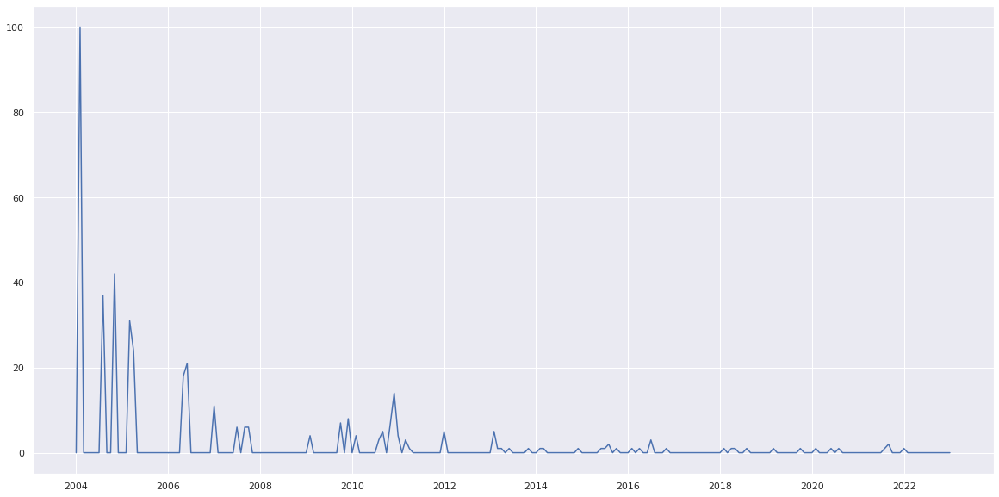

In [ ]:
# plot it
plt.plot(seguro['seguro_desemprego']);


In [ ]:
dados= pd.concat([dados,seguro['seguro_desemprego']],axis=1)

In [ ]:
dados.head()

,cambio,pib_mensal,igp_m,igp_di,m1,m2,m3,m4,estoque_caged,saldo_bc,...,expectativa_ipca_h_7,expectativa_ipca_h_8,expectativa_ipca_h_9,expectativa_ipca_h_10,expectativa_ipca_h_11,expectativa_ipca_h_12,ipca,const_civil,pim_pf,seguro_desemprego
2002-12-01,3.6259,130241.2,3.75,2.70,104796074.0,400341786.0,691107613.0,800035851.0,21587374.0,1711.3,...,1.011500,0.712000,0.728095,0.731000,0.746667,0.725714,2.10,175.94,74.61271,NaN
2003-01-01,3.4384,125711.1,2.33,2.17,101244913.0,391237088.0,696054502.0,810272451.0,21622859.0,1059.3,...,0.724091,0.716364,0.758636,0.710909,0.726190,0.587368,2.25,181.39,73.98043,NaN
2003-02-01,3.5908,131383.0,2.28,1.59,94540598.0,393976058.0,706788435.0,815745074.0,21706888.0,1022.7,...,0.687500,0.719474,0.700000,0.700000,0.597895,0.560625,1.57,184.80,71.78186,NaN
2003-03-01,3.4469,140147.5,1.53,1.66,92128694.0,388142457.0,710712013.0,820859498.0,21728149.0,1437.3,...,0.698889,0.666316,0.697222,0.615789,0.528947,0.538000,1.23,187.16,77.41394,NaN
2003-04-01,3.1187,141003.2,0.92,0.41,90394890.0,385467653.0,712800120.0,823489095.0,21882173.0,1616.2,...,0.630000,0.690000,0.626316,0.527619,0.544211,0.507222,0.97,189.62,76.52576,NaN


##Salvando os dados

In [ ]:
dados.to_csv('dados.csv')

In [ ]:
#dados = pd.read_csv('/content/df_ipca.csv',index_col='date')

In [ ]:
#dados = dados[dados.columns[(dados.columns != 'Unnamed: 0') & (dados.columns != 'custo_m2')]]

In [ ]:
dados.columns

Index(['cambio', 'pib_mensal', 'igp_m', 'igp_di', 'm1', 'm2', 'm3', 'm4',
       'estoque_caged', 'saldo_bc', 'vendas_auto', 'divida_liquida_spc', 'ltn',
       'ir', 'ibovespa', 'consumo_energia', 'brent_fob',
       'expectativa_ipca_h_1', 'expectativa_ipca_h_2', 'expectativa_ipca_h_3',
       'expectativa_ipca_h_4', 'expectativa_ipca_h_5', 'expectativa_ipca_h_6',
       'expectativa_ipca_h_7', 'expectativa_ipca_h_8', 'expectativa_ipca_h_9',
       'expectativa_ipca_h_10', 'expectativa_ipca_h_11',
       'expectativa_ipca_h_12', 'ipca', 'const_civil', 'pim_pf',
       'seguro_desemprego'],
      dtype='object')

In [ ]:
dados.isnull().sum()

cambio                    1
pib_mensal                2
igp_m                     1
igp_di                    1
m1                        2
m2                        2
m3                        2
m4                        2
estoque_caged             2
saldo_bc                  2
vendas_auto               1
divida_liquida_spc        2
ltn                       0
ir                        2
ibovespa                  1
consumo_energia           2
brent_fob                 0
expectativa_ipca_h_1      0
expectativa_ipca_h_2      0
expectativa_ipca_h_3      0
expectativa_ipca_h_4      0
expectativa_ipca_h_5      0
expectativa_ipca_h_6      0
expectativa_ipca_h_7      0
expectativa_ipca_h_8      0
expectativa_ipca_h_9      0
expectativa_ipca_h_10     0
expectativa_ipca_h_11     0
expectativa_ipca_h_12     0
ipca                      1
const_civil               1
pim_pf                    2
seguro_desemprego        13
dtype: int64

#Tratamento dos dados

##Estacionaridade
A TS é dita estacionária se as suas propriedades estatísticas, tais como a média e variância permanecem constantes ao longo do tempo. Mas por que isso é importante? A maioria dos modelos TS trabalha com o pressuposto de que a TS é estacionária. Intuitivamente, podemos entender que se uma TS tem um comportamento particular ao longo de um tempo, há uma probabilidade muito elevada de que seguirá o mesmo comportamento no futuro. Além disso, as teorias relacionadas com séries estacionárias são mais maduras e mais fáceis de implementar, em comparação com séries não-estacionárias.

https://www.vooo.pro/insights/guia-completo-para-criar-time-series-com-codigo-em-python/

In [ ]:
"""x=0
for i in range(len(dados.columns)):
  try:
    fig, ax = plt.subplots(dpi=120)
    ax.plot(dados.iloc[:,i],label=dados.columns[i])
    plt.legend()
    plt.show()
  except:
    try:
      grafico = dados.iloc[:,i].dropna()
      grafico = grafico.astype(int)
      ax.plot(grafico,label=dados.columns[i])
      plt.legend()
      plt.show()
    except:
      grafico = dados.iloc[:,i].dropna()
      grafico = grafico.astype(float)
      ax.plot(grafico,label=dados.columns[i])
      plt.legend()
      plt.show()
  x=x+1
  print(x)"""

'x=0\nfor i in range(len(dados.columns)):\n  try:\n    fig, ax = plt.subplots(dpi=120)\n    ax.plot(dados.iloc[:,i],label=dados.columns[i])\n    plt.legend()\n    plt.show()\n  except:\n    try:\n      grafico = dados.iloc[:,i].dropna()\n      grafico = grafico.astype(int)\n      ax.plot(grafico,label=dados.columns[i])\n      plt.legend()\n      plt.show()\n    except:\n      grafico = dados.iloc[:,i].dropna()\n      grafico = grafico.astype(float)\n      ax.plot(grafico,label=dados.columns[i])\n      plt.legend()\n      plt.show()\n  x=x+1\n  print(x)'

In [ ]:
def plotar(dados):
  for i in range(len(dados.columns)):
    fig, ax = plt.subplots(dpi=120)
    ax.plot(dados.iloc[:,i],label=dados.columns[i])
    plt.legend()
    plt.show()

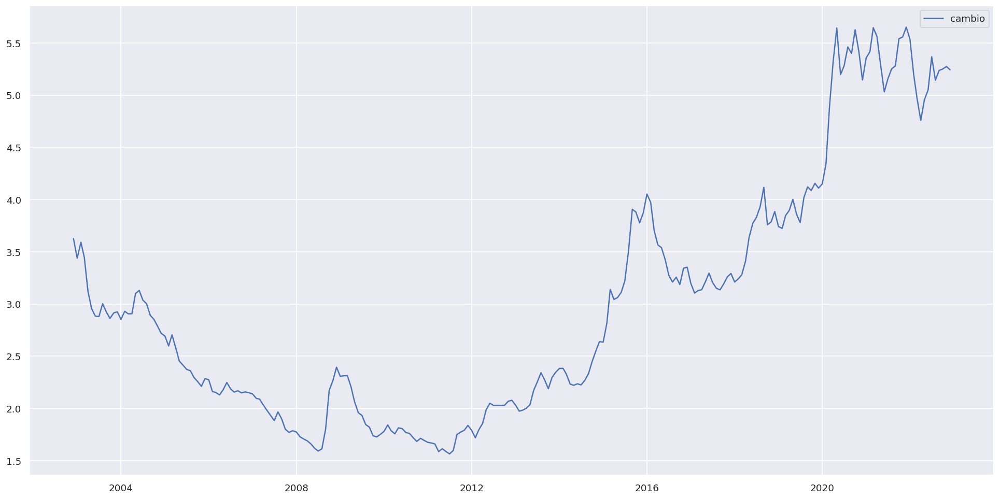

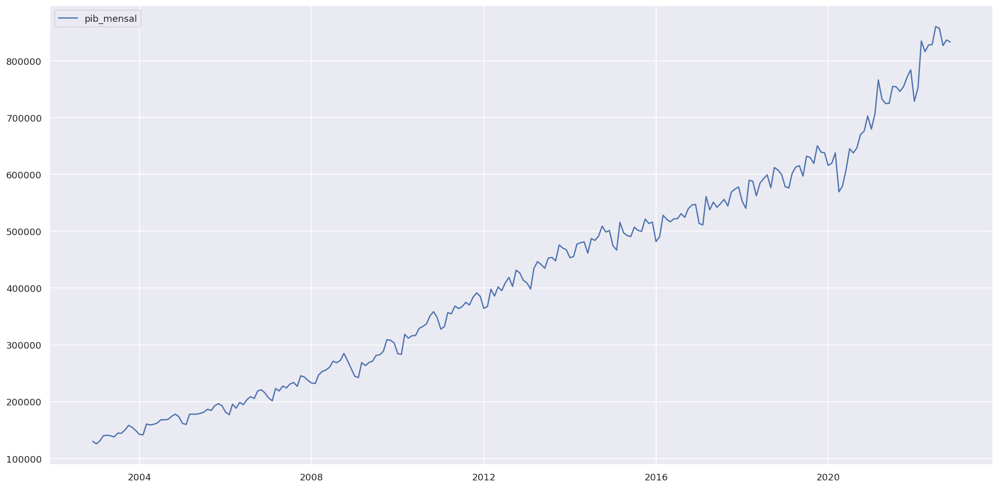

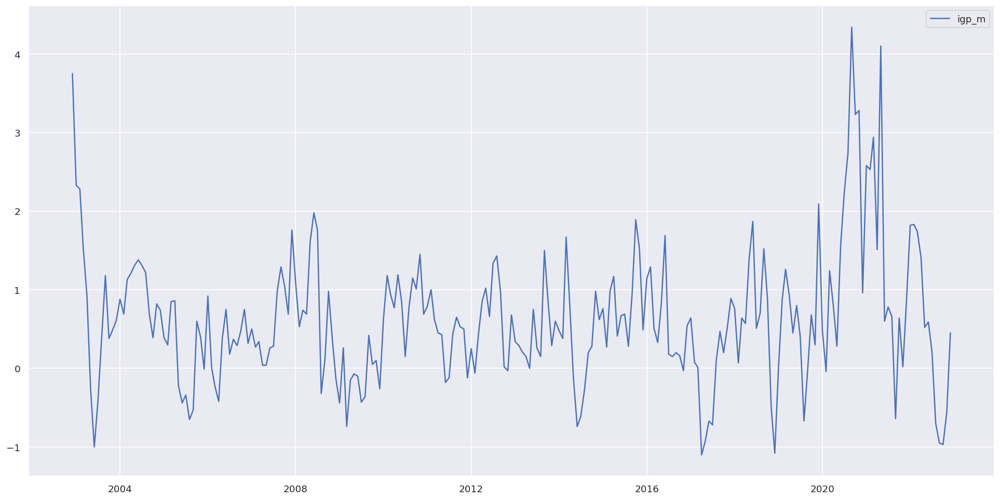

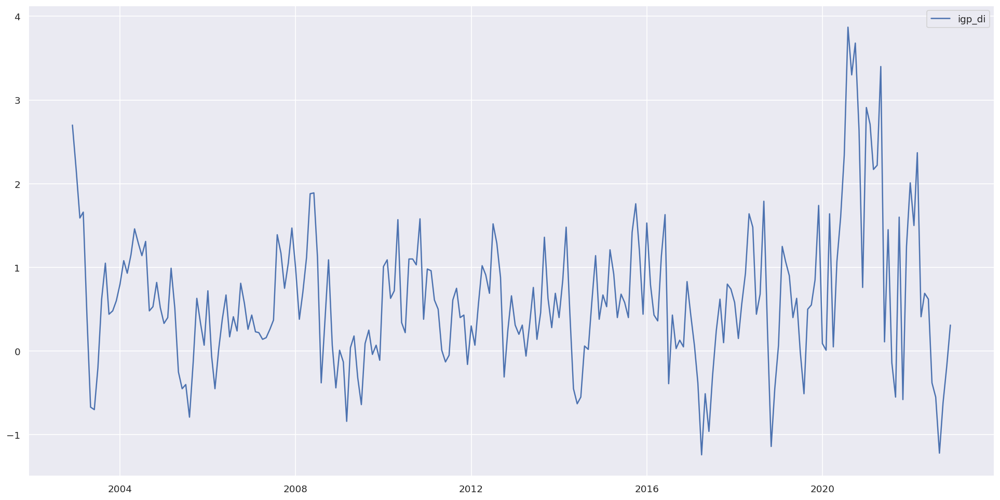

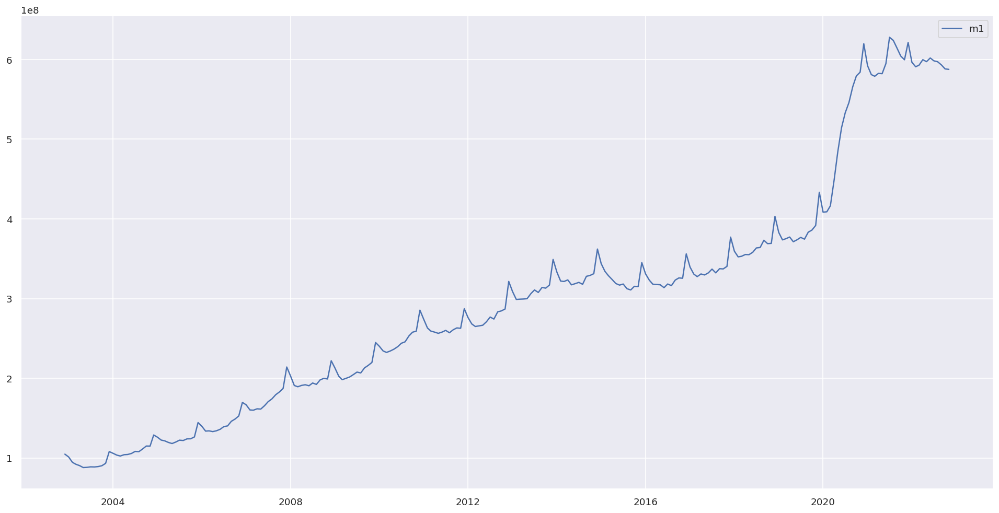

...

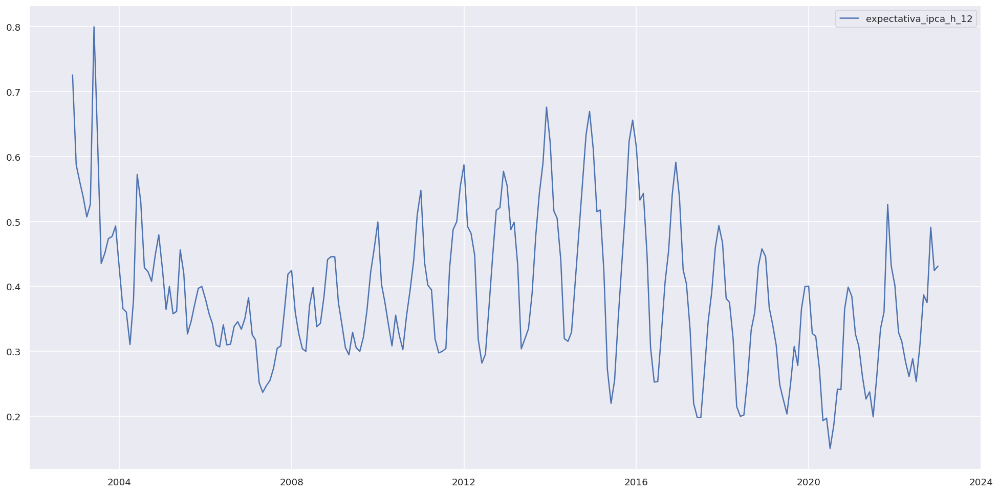

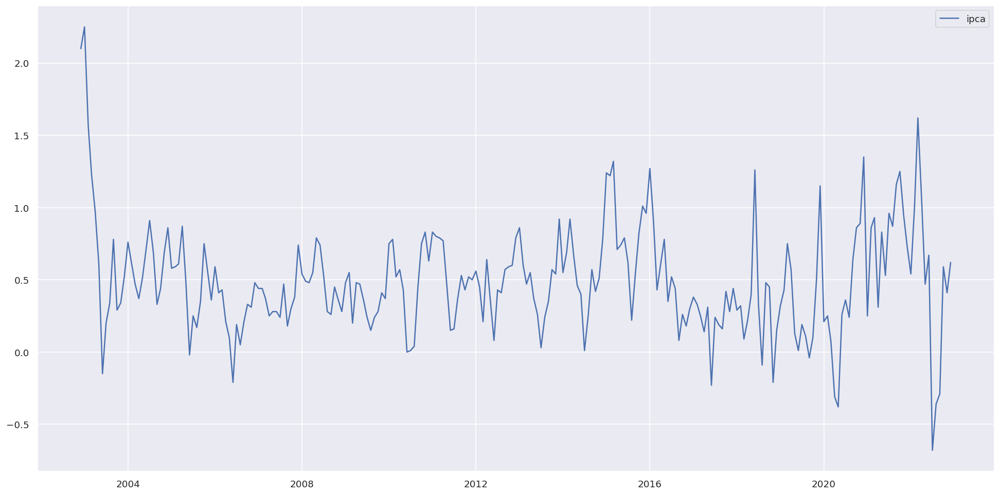

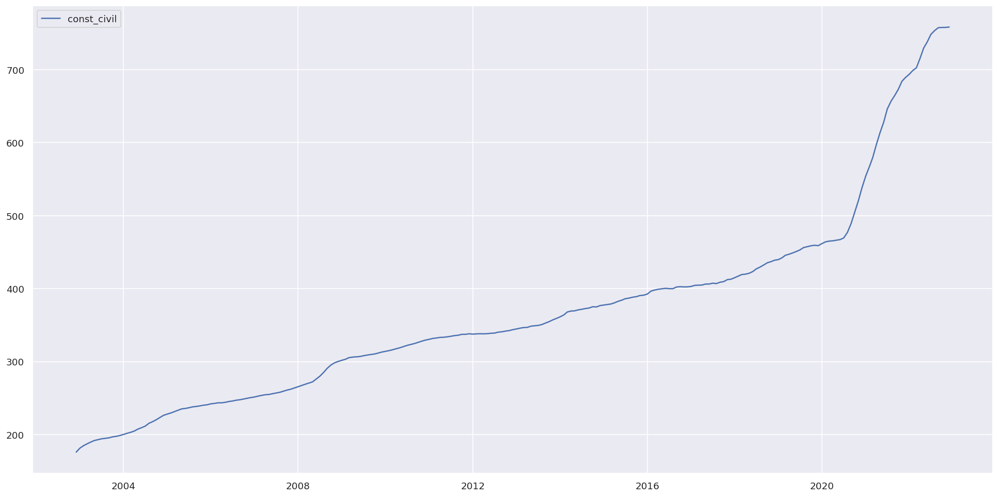

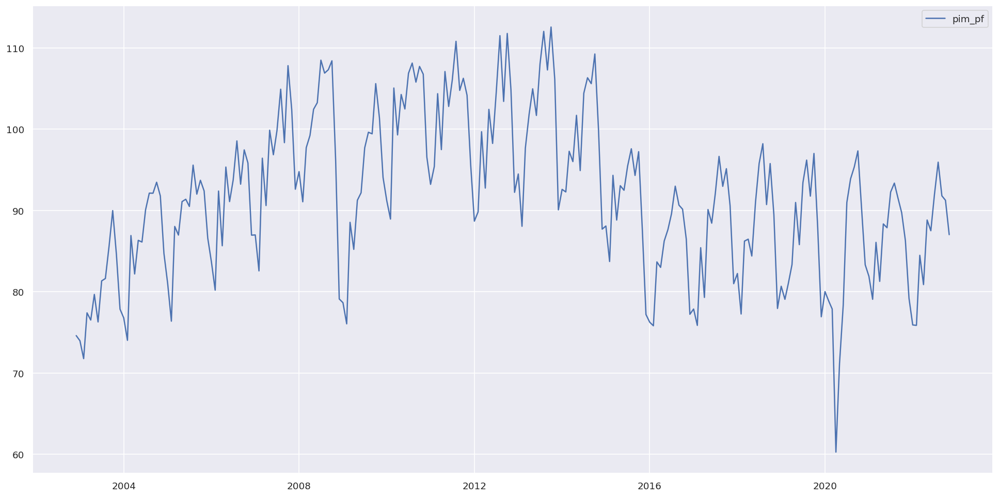

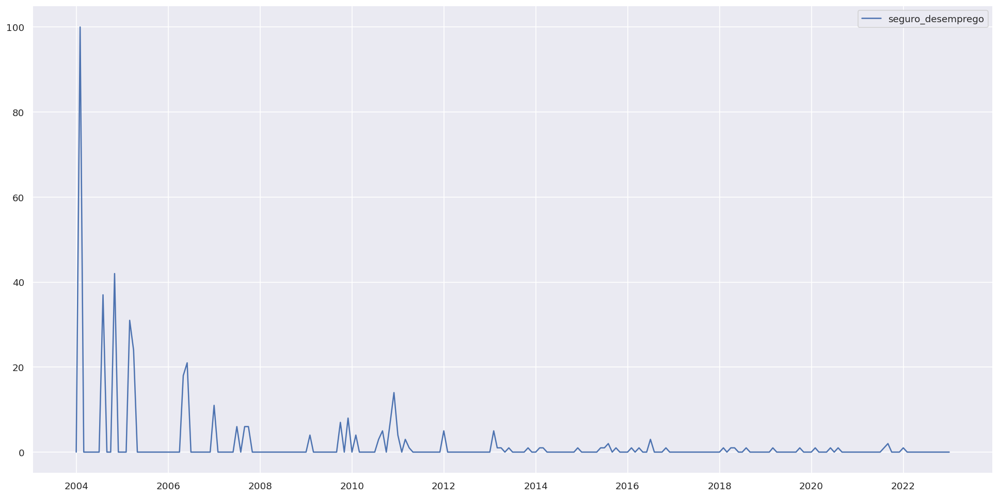

In [ ]:
plotar(dados)

###Teste de estacionaridade Dickey-Fuller
Dickey-Fuller teste: esse é um dos testes estatísticos para verificar Estacionaridade. Aqui, a hipótese nula é que o TS é não-estacionária. Os resultados do teste são compostos por uma estatística de teste e alguns valores críticos para os níveis de confiança da diferença. Se o ‘teste estatístico’ é menor do que o “valor crítico”, podemos rejeitar a hipótese nula e dizer que a série é estacionária. Consulte este artigo para obter detalhes.

In [ ]:
def test_kpss_adf(dados):
  #https://www.statsmodels.org/dev/examples/notebooks/generated/stationarity_detrending_adf_kpss.html
  def kpss_test(timeseries):
    """
    O KPSS é outro teste para verificar a estacionaridade de uma série temporal. As hipóteses nula e alternativa para o teste KPSS são opostas às do teste ADF.

    Hipótese Nula: O processo é estacionário de tendência.

    Hipótese Alternativa: A série tem raiz unitária (a série não é estacionária).

    Uma função é criada para realizar o teste KPSS em uma série temporal.
    """
    #print("Results of KPSS Test:")
    kpsstest = kpss(timeseries, regression="c", nlags="auto")
    kpss_output = pd.Series(
      kpsstest[0:3], index=["Test Statistic", "p-value", "Lags Used"]
    )
    for key, value in kpsstest[3].items():
        kpss_output["Critical Value (%s)" % key] = value
    return kpss_output

  def adf_test(timeseries):

    """
    O teste ADF é usado para determinar a presença de raiz unitária na série e, portanto, ajuda a entender se a série é estacionária ou não. As hipóteses nula e 
    alternativa deste teste são:
    Hipótese Nula: A série tem raiz unitária.
    Hipótese alternativa: A série não tem raiz unitária.
    Se a hipótese nula não for rejeitada, este teste pode fornecer evidências de que a série é não estacionária.
   Uma função é criada para realizar o teste ADF em uma série temporal.
    """
    #print("Results of Dickey-Fuller Test:")
    dftest = adfuller(timeseries, autolag="AIC")
    dfoutput = pd.Series(
      dftest[0:4],
      index=[
            "Test Statistic",
            "p-value",
            "#Lags Used",
            "Number of Observations Used",
        ],
    )
    for key, value in dftest[4].items():
      dfoutput["Critical Value (%s)" % key] = value
    return dfoutput


  test_est = pd.DataFrame(index=dados.columns,columns = ['Teste_kpss', 'Estacionaria_ou_nâo_kpss','Teste_adf','Estacionaria_ou_nâo_adf'])
  for k in dados.columns:
    tes_kpss = kpss_test(dados[k].dropna())
    test_est.loc[k,test_est.columns[0]] = tes_kpss[1]
    tes_adf = adf_test(dados[k].dropna())
    test_est.loc[k,test_est.columns[2]] = tes_adf[1]
  test_est['Estacionaria_ou_nâo_kpss']=np.where(test_est['Teste_kpss'] >= 0.05,'Estacionaria','Nâo estacionaria')
  test_est['Estacionaria_ou_nâo_adf']=np.where(test_est['Teste_adf'] <= 0.05,'Estacionaria','Nâo estacionaria')
  return test_est
  

In [ ]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    from statsmodels.tsa.stattools import adfuller
    import pandas as pd
    import matplotlib.pylab as plt
    import seaborn as sns
    import numpy as np
    for i in range(len(timeseries.columns)):
     #Determing rolling statistics
      rolmean = pd.Series(timeseries.iloc[:,i]).rolling(window=12).mean().dropna()
      rolstd = pd.Series(timeseries.iloc[:,i]).rolling(window=12).std().dropna()

      #Plot rolling statistics:
      if type(timeseries[dados.columns[i]][0]) != str:
        orig = plt.plot(timeseries.iloc[:,i], color='blue',label='Original')
        mean = plt.plot(rolmean, color='red', label='Rolling Mean')
        std = plt.plot(rolstd, color='black', label = 'Rolling Std')
        plt.legend(loc='best')
        plt.title(f'Rolling Mean & Standard Deviation na variavel {dados.columns[i]}')
        plt.show(block=False)
    
        #Perform Dickey-Fuller test:
        print (f'Results of Dickey-Fuller Test:Coluna {dados.columns[i]}')
        dftest = adfuller(timeseries.iloc[:,i].dropna(), autolag='AIC')
        dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
        for key,value in dftest[4].items():
          dfoutput['Critical Value (%s)'%key] = value
        print(dfoutput)
      else:
        try:
          timeseries.iloc[:,i] = timeseries.iloc[:,i].astype(int)
          orig = plt.plot(timeseries.iloc[:,i], color='blue',label='Original')
          mean = plt.plot(rolmean, color='red', label='Rolling Mean')
          std = plt.plot(rolstd, color='black', label = 'Rolling Std')
          plt.legend(loc='best')
          plt.title(f'Rolling Mean & Standard Deviation na variavel {dados.columns[i]}')
          plt.show(block=False)
    
          #Perform Dickey-Fuller test:
          print (f'Results of Dickey-Fuller Test:Coluna {dados.columns[i]}')
          dftest = adfuller(timeseries.iloc[:,i].dropna(), autolag='AIC')
          dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
          for key,value in dftest[4].items():
           dfoutput['Critical Value (%s)'%key] = value
          print(dfoutput)
        except:
          timeseries.iloc[:,i] = timeseries.iloc[:,i].astype(float)
          orig = plt.plot(timeseries.iloc[:,i], color='blue',label='Original')
          mean = plt.plot(rolmean, color='red', label='Rolling Mean')
          std = plt.plot(rolstd, color='black', label = 'Rolling Std')
          plt.legend(loc='best')
          plt.title(f'Rolling Mean & Standard Deviation na variavel {dados.columns[i]}')
          plt.show(block=False)
    
          #Perform Dickey-Fuller test:
          print (f'Results of Dickey-Fuller Test:Coluna {dados.columns[i]}')
          dftest = adfuller(timeseries.iloc[:,i].dropna(), autolag='AIC')
          dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
          for key,value in dftest[4].items():
           dfoutput['Critical Value (%s)'%key] = value
          print(dfoutput)
        
    return test_kpss_adf(timeseries)
          

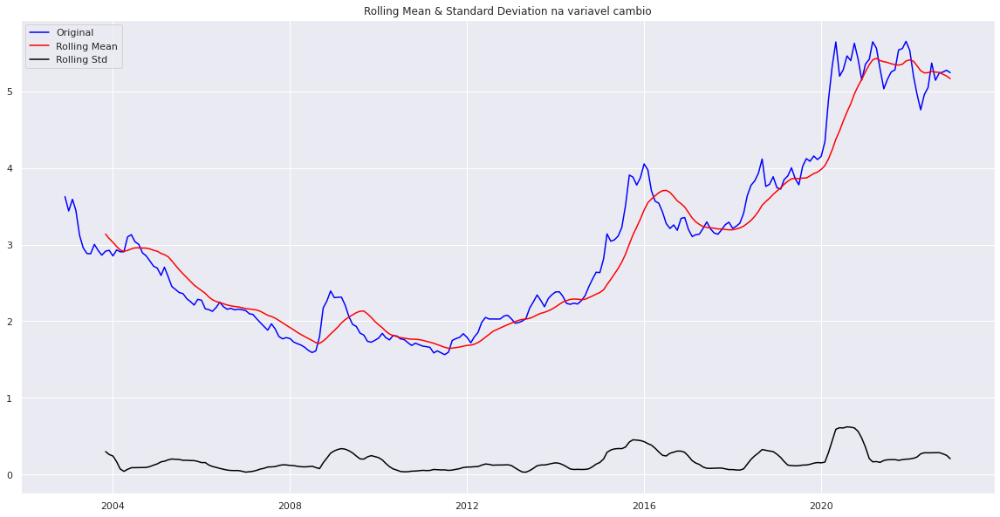

Results of Dickey-Fuller Test:Coluna cambio
Test Statistic                  -0.003845
p-value                          0.958213
#Lags Used                      14.000000
Number of Observations Used    226.000000
Critical Value (1%)             -3.459620
Critical Value (5%)             -2.874415
Critical Value (10%)            -2.573632
dtype: float64


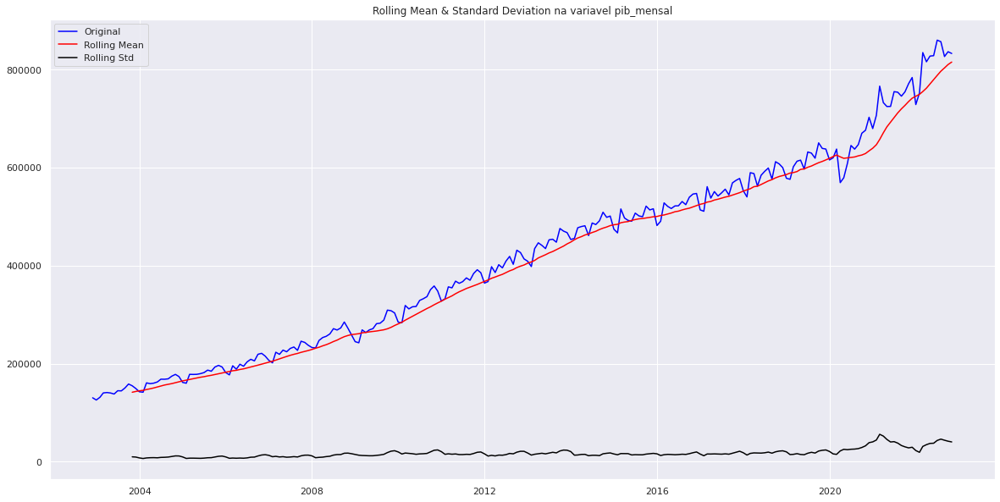

Results of Dickey-Fuller Test:Coluna pib_mensal
Test Statistic                   2.090407
p-value                          0.998780
#Lags Used                      12.000000
Number of Observations Used    227.000000
Critical Value (1%)             -3.459490
Critical Value (5%)             -2.874358
Critical Value (10%)            -2.573602
dtype: float64


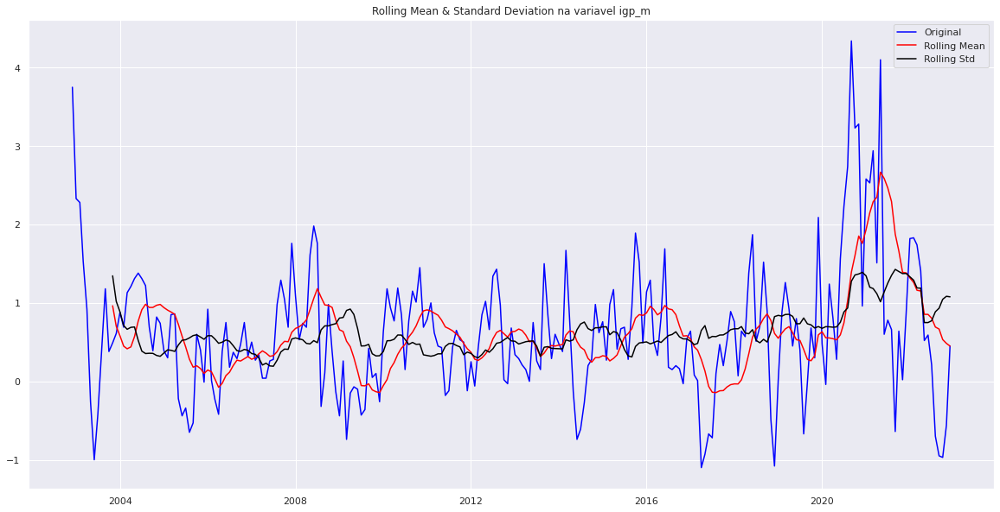

Results of Dickey-Fuller Test:Coluna igp_m
Test Statistic                -6.321638e+00
p-value                        3.055949e-08
#Lags Used                     1.000000e+00
Number of Observations Used    2.390000e+02
Critical Value (1%)           -3.458011e+00
Critical Value (5%)           -2.873710e+00
Critical Value (10%)          -2.573256e+00
dtype: float64


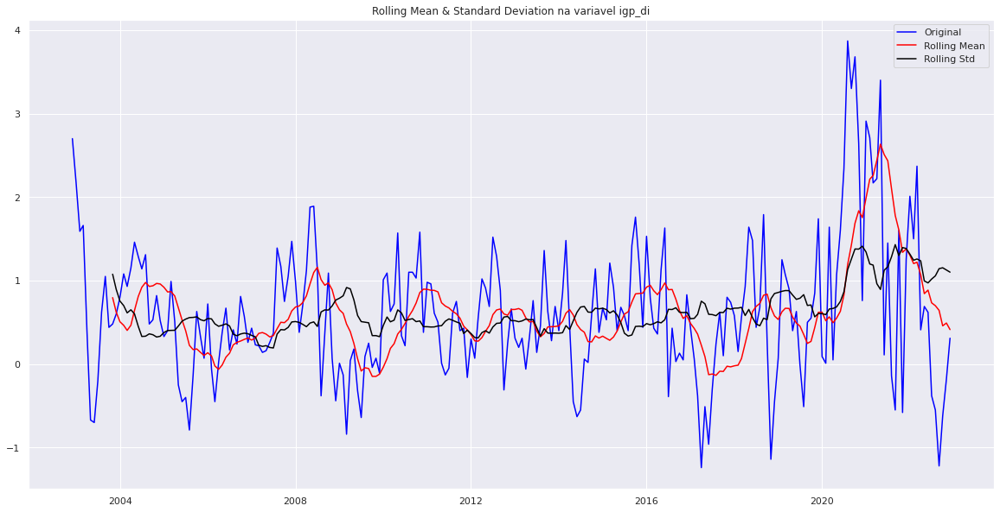

Results of Dickey-Fuller Test:Coluna igp_di
Test Statistic                  -4.713632
p-value                          0.000079
#Lags Used                       4.000000
Number of Observations Used    236.000000
Critical Value (1%)             -3.458366
Critical Value (5%)             -2.873866
Critical Value (10%)            -2.573339
dtype: float64


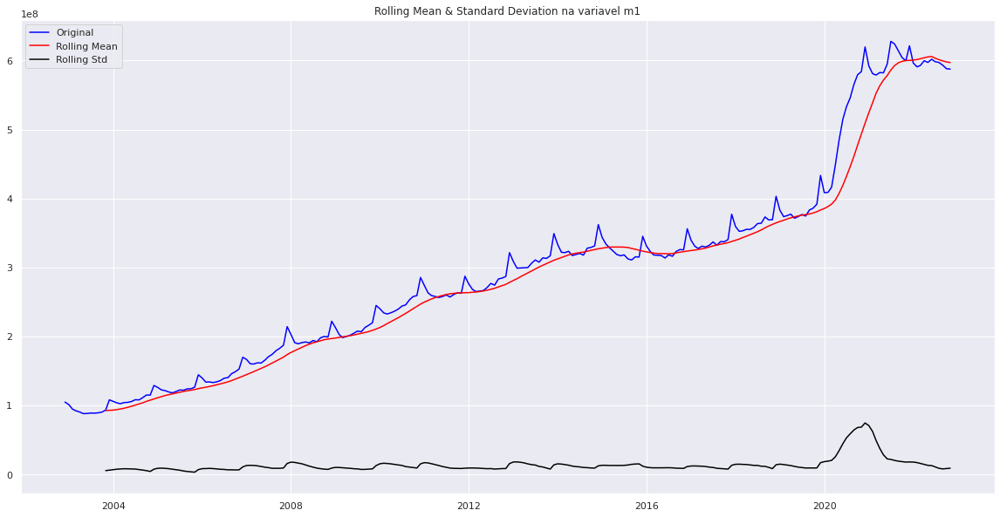

Results of Dickey-Fuller Test:Coluna m1
Test Statistic                  -0.080626
p-value                          0.951334
#Lags Used                      13.000000
Number of Observations Used    226.000000
Critical Value (1%)             -3.459620
Critical Value (5%)             -2.874415
Critical Value (10%)            -2.573632
dtype: float64


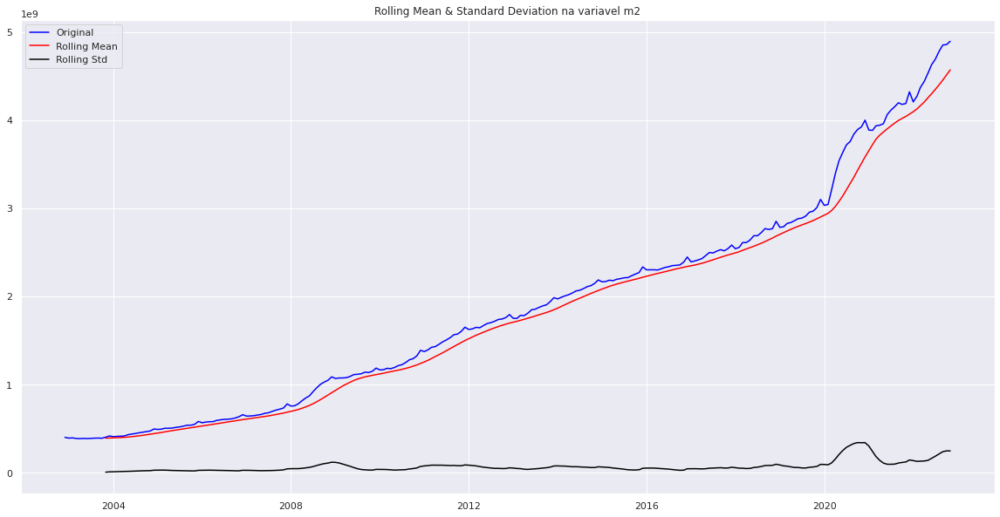

Results of Dickey-Fuller Test:Coluna m2
Test Statistic                   3.011097
p-value                          1.000000
#Lags Used                      13.000000
Number of Observations Used    226.000000
Critical Value (1%)             -3.459620
Critical Value (5%)             -2.874415
Critical Value (10%)            -2.573632
dtype: float64


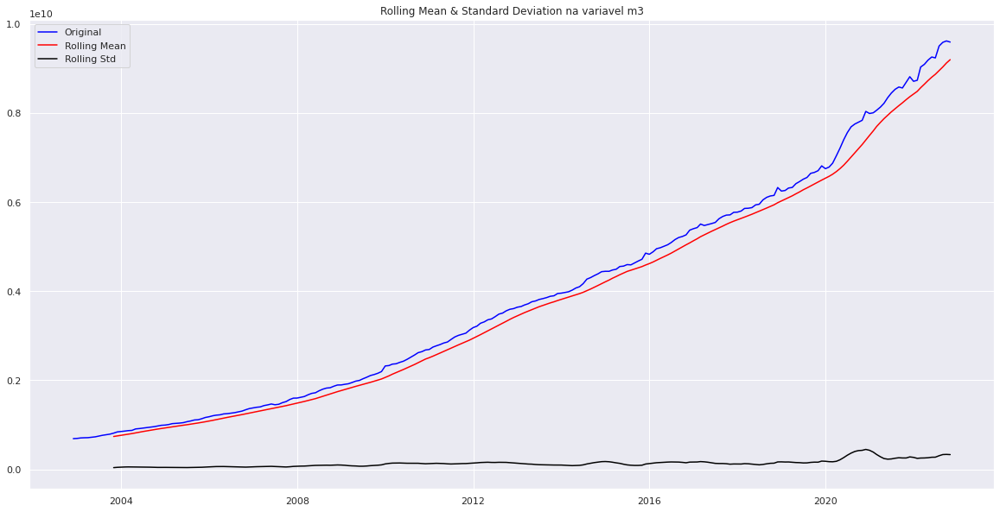

Results of Dickey-Fuller Test:Coluna m3
Test Statistic                   2.532519
p-value                          0.999060
#Lags Used                      15.000000
Number of Observations Used    224.000000
Critical Value (1%)             -3.459885
Critical Value (5%)             -2.874531
Critical Value (10%)            -2.573694
dtype: float64


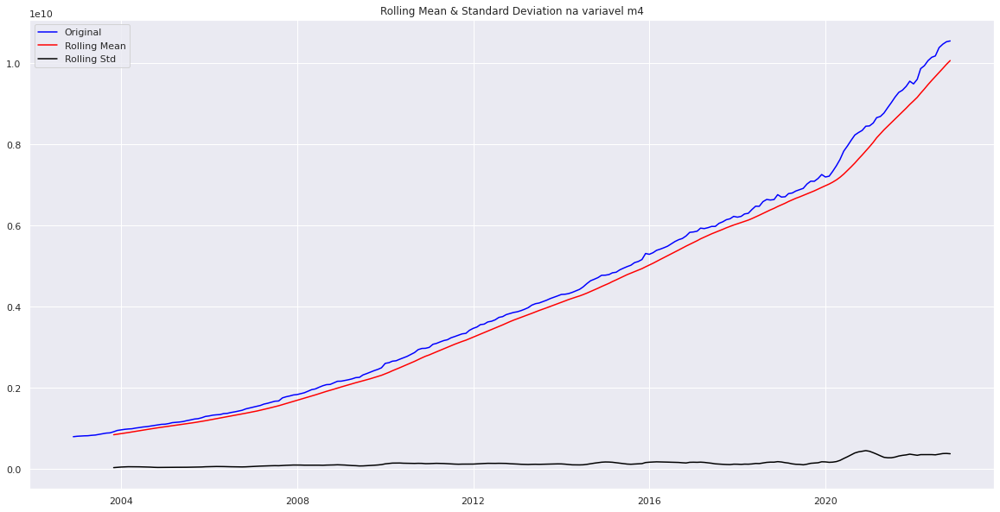

Results of Dickey-Fuller Test:Coluna m4
Test Statistic                   2.399401
p-value                          0.999010
#Lags Used                      13.000000
Number of Observations Used    226.000000
Critical Value (1%)             -3.459620
Critical Value (5%)             -2.874415
Critical Value (10%)            -2.573632
dtype: float64


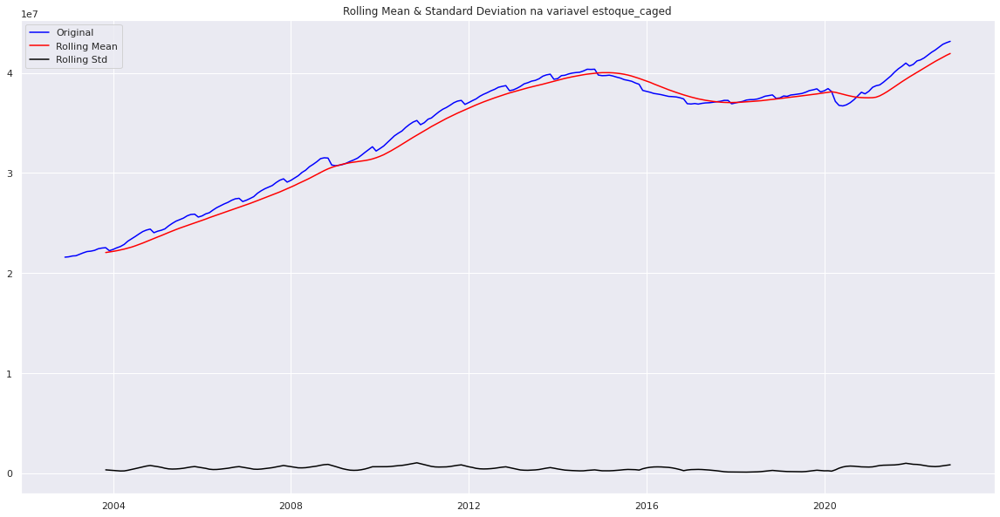

Results of Dickey-Fuller Test:Coluna estoque_caged
Test Statistic                  -1.690303
p-value                          0.436115
#Lags Used                      13.000000
Number of Observations Used    226.000000
Critical Value (1%)             -3.459620
Critical Value (5%)             -2.874415
Critical Value (10%)            -2.573632
dtype: float64


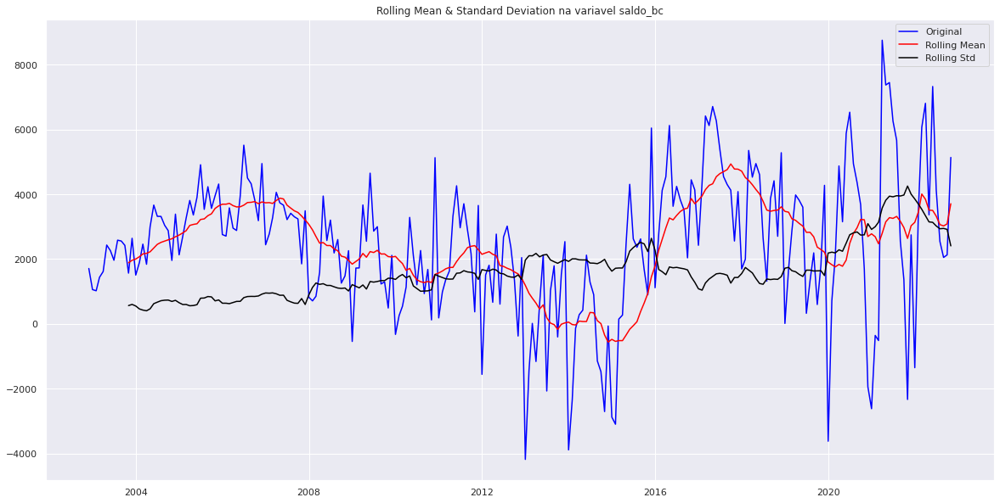

Results of Dickey-Fuller Test:Coluna saldo_bc
Test Statistic                  -1.766818
p-value                          0.397055
#Lags Used                      15.000000
Number of Observations Used    224.000000
Critical Value (1%)             -3.459885
Critical Value (5%)             -2.874531
Critical Value (10%)            -2.573694
dtype: float64


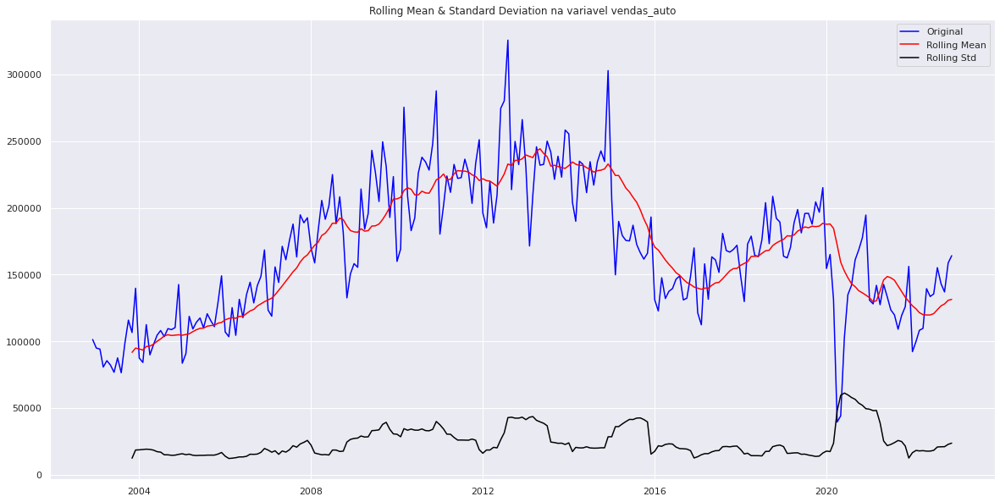

Results of Dickey-Fuller Test:Coluna vendas_auto
Test Statistic                  -1.611445
p-value                          0.477217
#Lags Used                      12.000000
Number of Observations Used    228.000000
Critical Value (1%)             -3.459361
Critical Value (5%)             -2.874302
Critical Value (10%)            -2.573571
dtype: float64


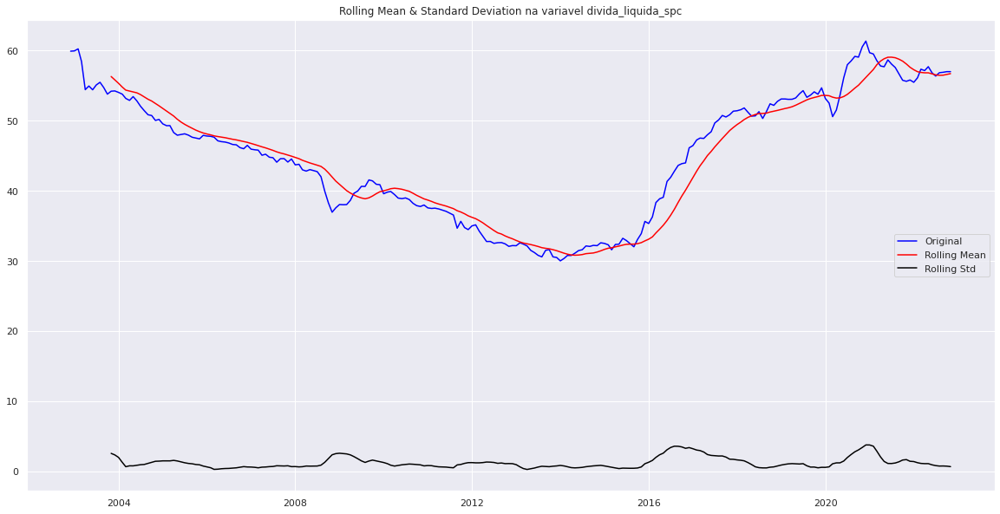

Results of Dickey-Fuller Test:Coluna divida_liquida_spc
Test Statistic                  -0.979987
p-value                          0.760494
#Lags Used                       6.000000
Number of Observations Used    233.000000
Critical Value (1%)             -3.458731
Critical Value (5%)             -2.874026
Critical Value (10%)            -2.573424
dtype: float64


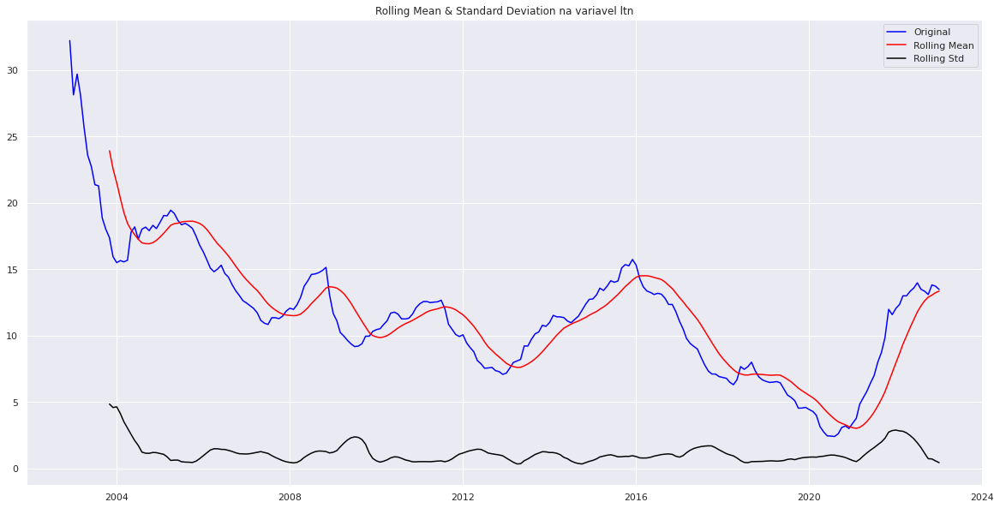

Results of Dickey-Fuller Test:Coluna ltn
Test Statistic                  -3.308957
p-value                          0.014483
#Lags Used                       3.000000
Number of Observations Used    238.000000
Critical Value (1%)             -3.458128
Critical Value (5%)             -2.873762
Critical Value (10%)            -2.573283
dtype: float64


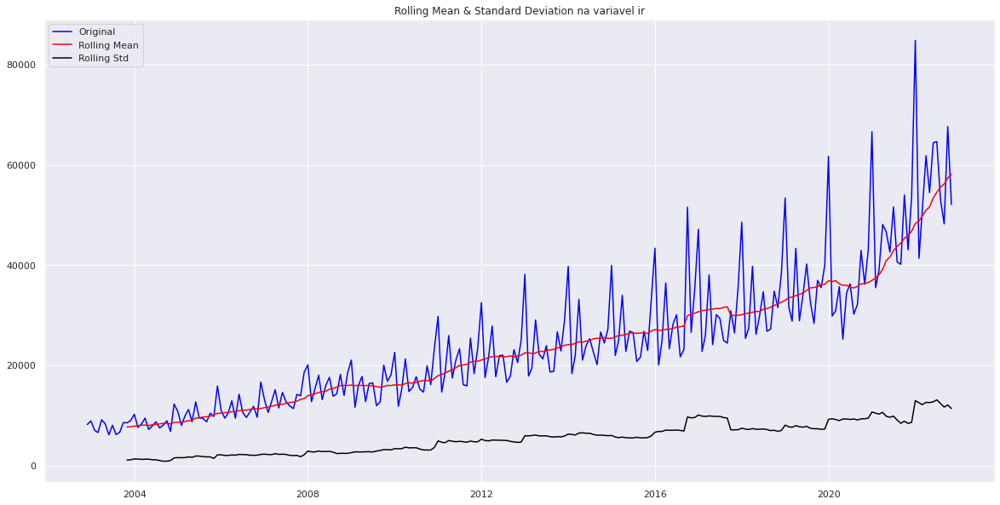

Results of Dickey-Fuller Test:Coluna ir
Test Statistic                   2.401109
p-value                          0.999011
#Lags Used                      14.000000
Number of Observations Used    225.000000
Critical Value (1%)             -3.459752
Critical Value (5%)             -2.874473
Critical Value (10%)            -2.573663
dtype: float64


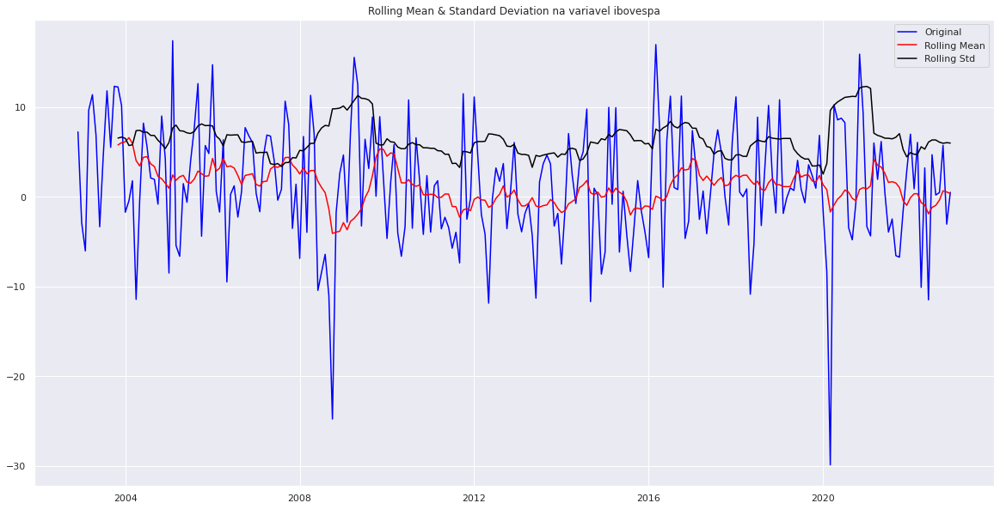

Results of Dickey-Fuller Test:Coluna ibovespa
Test Statistic                -1.346350e+01
p-value                        3.492628e-25
#Lags Used                     0.000000e+00
Number of Observations Used    2.400000e+02
Critical Value (1%)           -3.457894e+00
Critical Value (5%)           -2.873659e+00
Critical Value (10%)          -2.573229e+00
dtype: float64


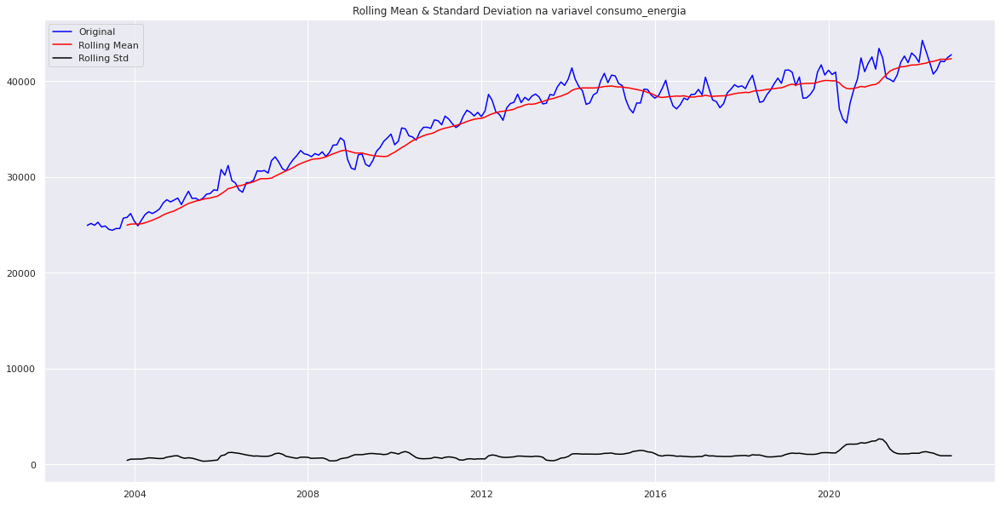

Results of Dickey-Fuller Test:Coluna consumo_energia
Test Statistic                  -2.195191
p-value                          0.207996
#Lags Used                      12.000000
Number of Observations Used    227.000000
Critical Value (1%)             -3.459490
Critical Value (5%)             -2.874358
Critical Value (10%)            -2.573602
dtype: float64


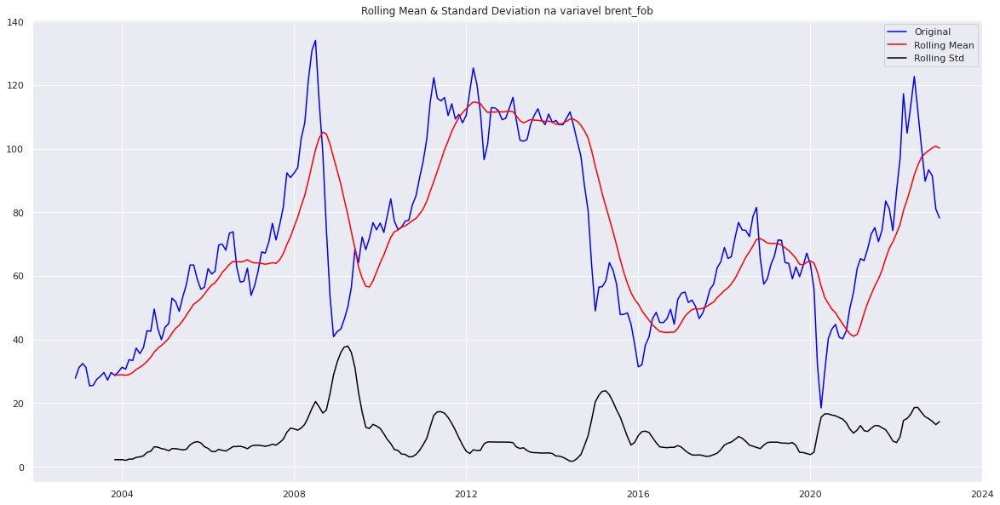

Results of Dickey-Fuller Test:Coluna brent_fob
Test Statistic                  -2.905311
p-value                          0.044734
#Lags Used                       1.000000
Number of Observations Used    240.000000
Critical Value (1%)             -3.457894
Critical Value (5%)             -2.873659
Critical Value (10%)            -2.573229
dtype: float64


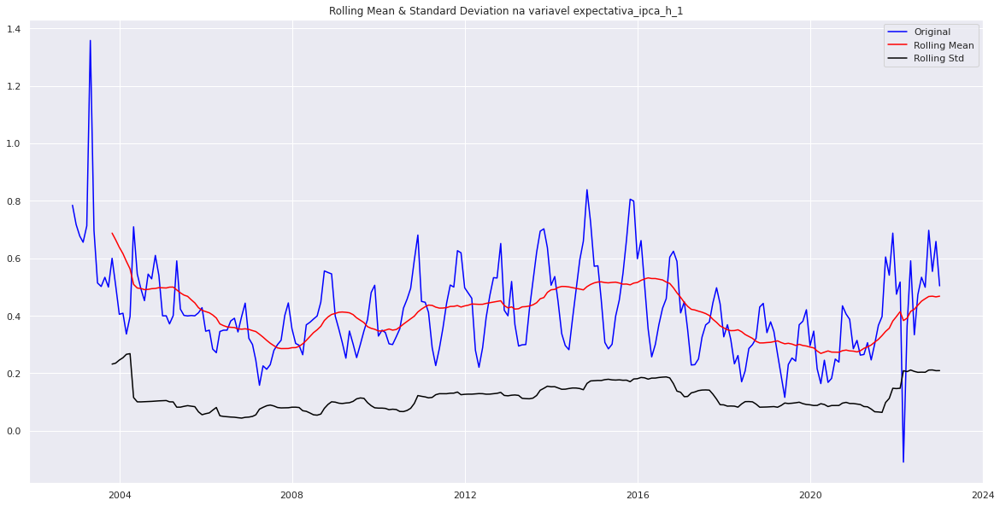

Results of Dickey-Fuller Test:Coluna expectativa_ipca_h_1
Test Statistic                  -2.305368
p-value                          0.170243
#Lags Used                      14.000000
Number of Observations Used    227.000000
Critical Value (1%)             -3.459490
Critical Value (5%)             -2.874358
Critical Value (10%)            -2.573602
dtype: float64


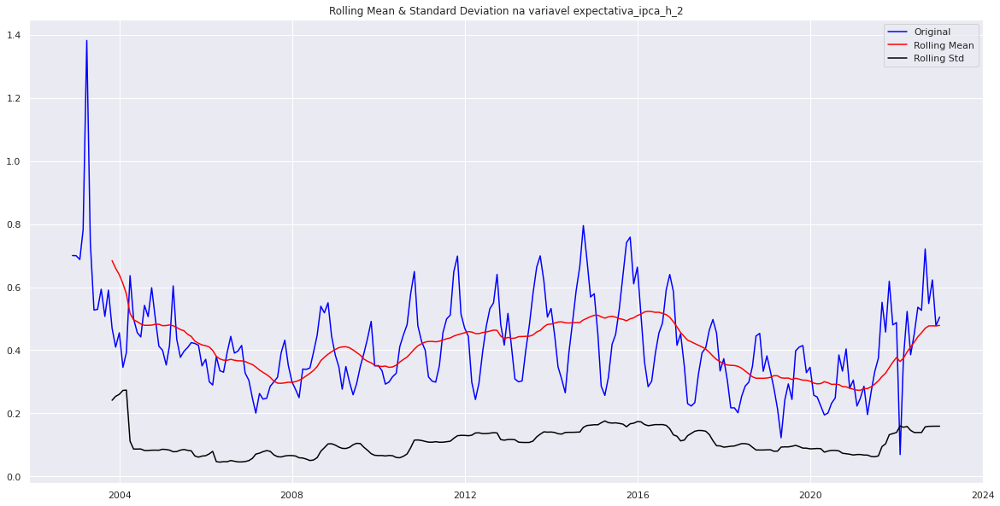

Results of Dickey-Fuller Test:Coluna expectativa_ipca_h_2
Test Statistic                  -2.073992
p-value                          0.255100
#Lags Used                      14.000000
Number of Observations Used    227.000000
Critical Value (1%)             -3.459490
Critical Value (5%)             -2.874358
Critical Value (10%)            -2.573602
dtype: float64


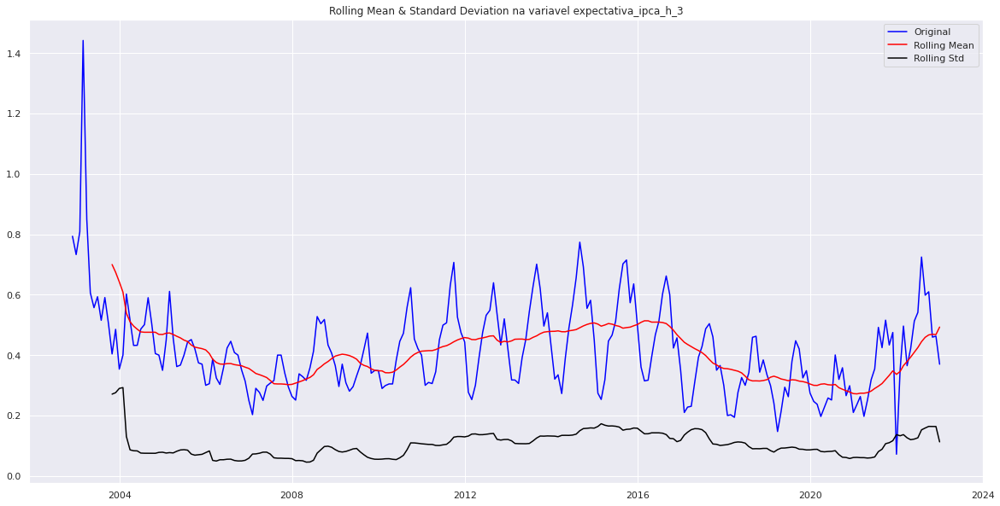

Results of Dickey-Fuller Test:Coluna expectativa_ipca_h_3
Test Statistic                  -1.744607
p-value                          0.408289
#Lags Used                      14.000000
Number of Observations Used    227.000000
Critical Value (1%)             -3.459490
Critical Value (5%)             -2.874358
Critical Value (10%)            -2.573602
dtype: float64


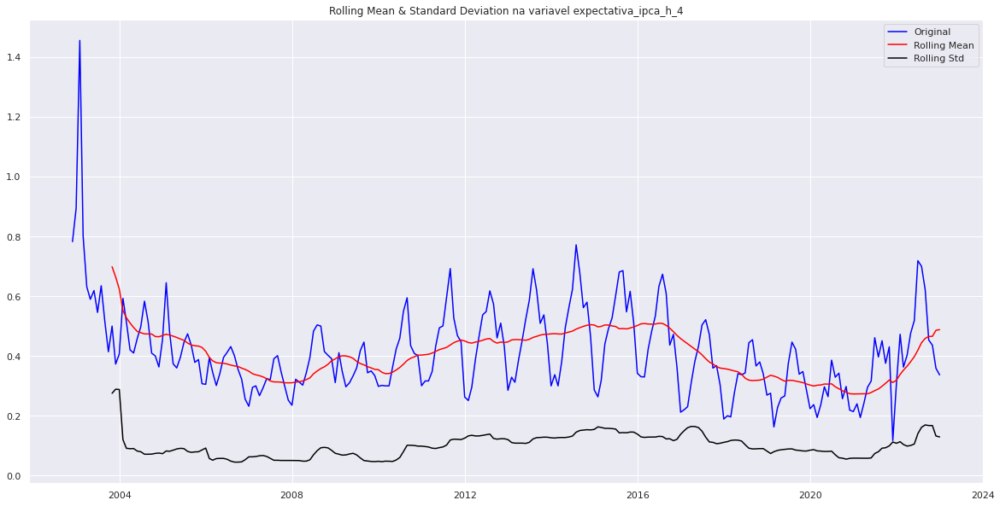

Results of Dickey-Fuller Test:Coluna expectativa_ipca_h_4
Test Statistic                  -2.159081
p-value                          0.221430
#Lags Used                      12.000000
Number of Observations Used    229.000000
Critical Value (1%)             -3.459233
Critical Value (5%)             -2.874245
Critical Value (10%)            -2.573541
dtype: float64


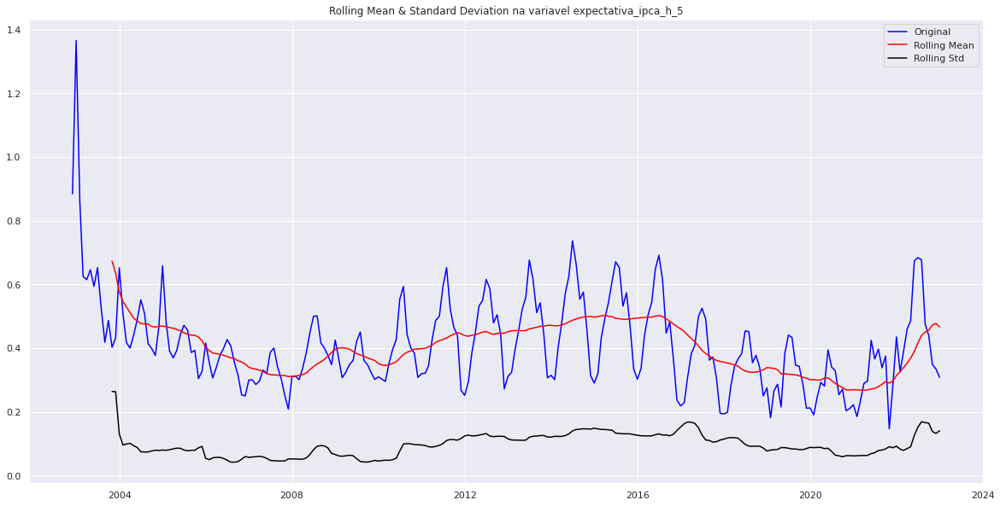

Results of Dickey-Fuller Test:Coluna expectativa_ipca_h_5
Test Statistic                  -2.107451
p-value                          0.241529
#Lags Used                      14.000000
Number of Observations Used    227.000000
Critical Value (1%)             -3.459490
Critical Value (5%)             -2.874358
Critical Value (10%)            -2.573602
dtype: float64


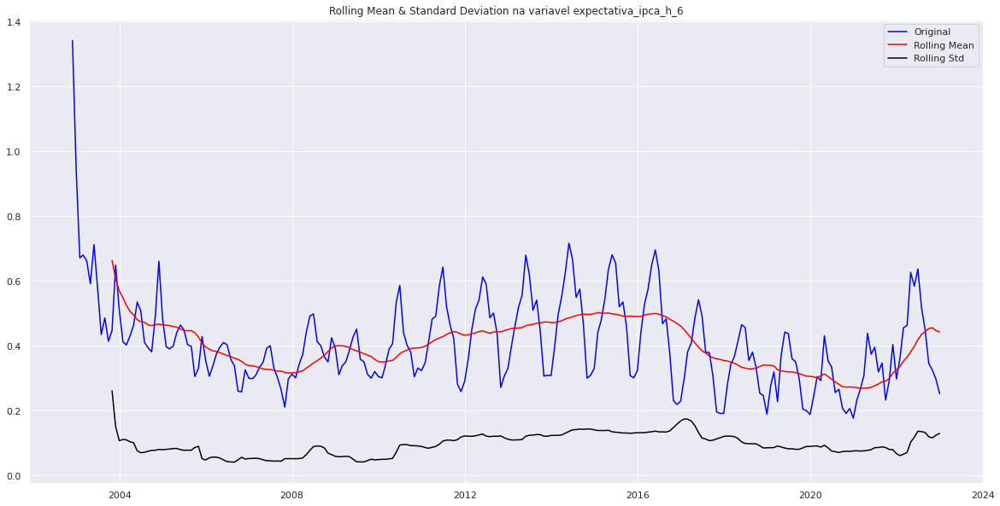

Results of Dickey-Fuller Test:Coluna expectativa_ipca_h_6
Test Statistic                  -1.961925
p-value                          0.303513
#Lags Used                      15.000000
Number of Observations Used    226.000000
Critical Value (1%)             -3.459620
Critical Value (5%)             -2.874415
Critical Value (10%)            -2.573632
dtype: float64


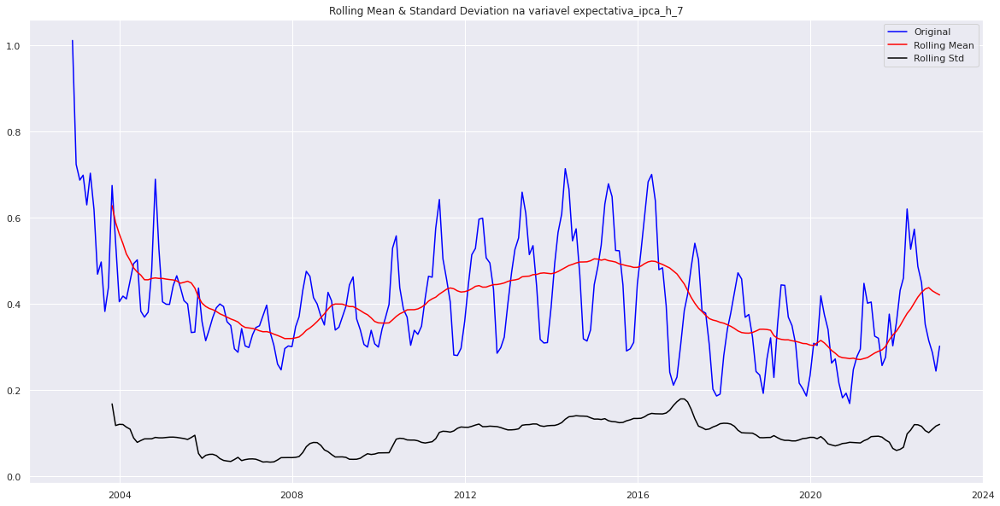

Results of Dickey-Fuller Test:Coluna expectativa_ipca_h_7
Test Statistic                  -2.010504
p-value                          0.281986
#Lags Used                      13.000000
Number of Observations Used    228.000000
Critical Value (1%)             -3.459361
Critical Value (5%)             -2.874302
Critical Value (10%)            -2.573571
dtype: float64


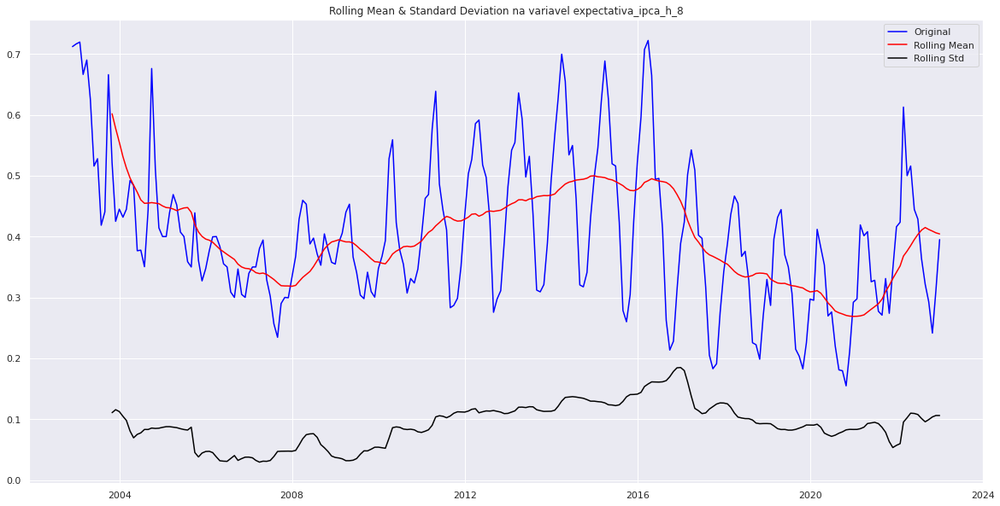

Results of Dickey-Fuller Test:Coluna expectativa_ipca_h_8
Test Statistic                  -1.859786
p-value                          0.351209
#Lags Used                      14.000000
Number of Observations Used    227.000000
Critical Value (1%)             -3.459490
Critical Value (5%)             -2.874358
Critical Value (10%)            -2.573602
dtype: float64


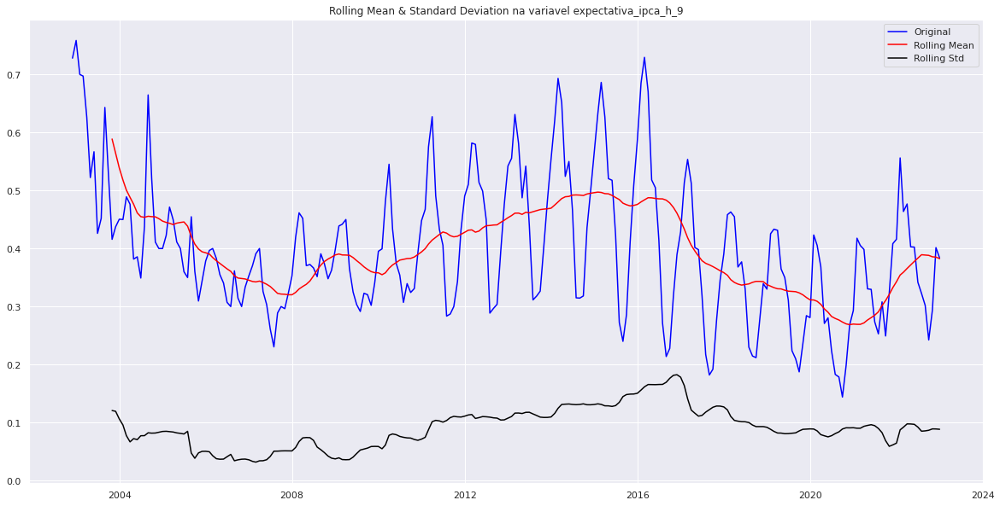

Results of Dickey-Fuller Test:Coluna expectativa_ipca_h_9
Test Statistic                  -1.734153
p-value                          0.413607
#Lags Used                      13.000000
Number of Observations Used    228.000000
Critical Value (1%)             -3.459361
Critical Value (5%)             -2.874302
Critical Value (10%)            -2.573571
dtype: float64


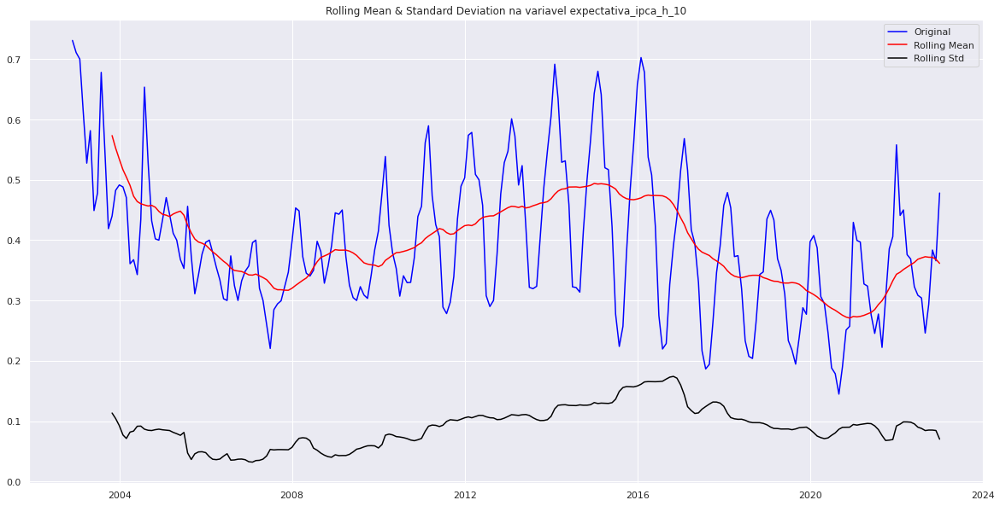

Results of Dickey-Fuller Test:Coluna expectativa_ipca_h_10
Test Statistic                  -1.850059
p-value                          0.355907
#Lags Used                      15.000000
Number of Observations Used    226.000000
Critical Value (1%)             -3.459620
Critical Value (5%)             -2.874415
Critical Value (10%)            -2.573632
dtype: float64


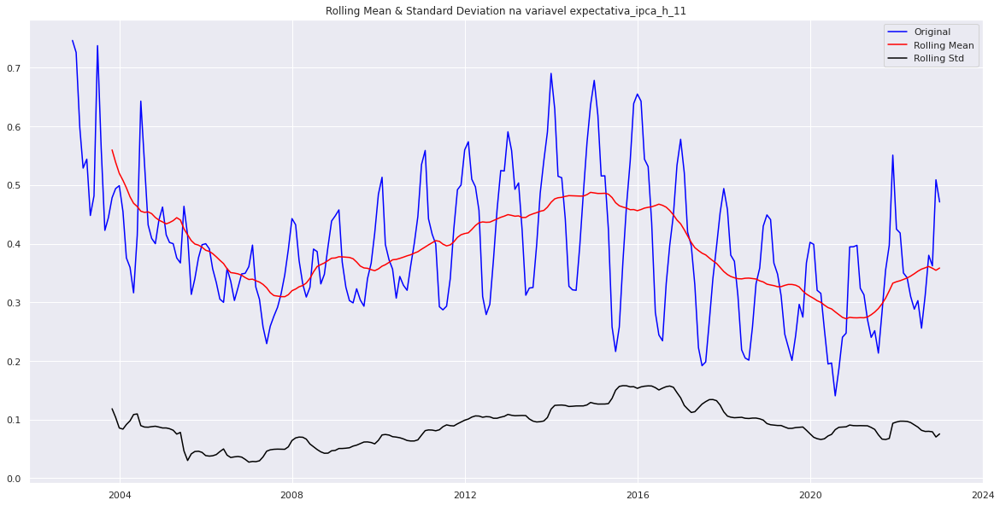

Results of Dickey-Fuller Test:Coluna expectativa_ipca_h_11
Test Statistic                  -1.903360
p-value                          0.330482
#Lags Used                      14.000000
Number of Observations Used    227.000000
Critical Value (1%)             -3.459490
Critical Value (5%)             -2.874358
Critical Value (10%)            -2.573602
dtype: float64


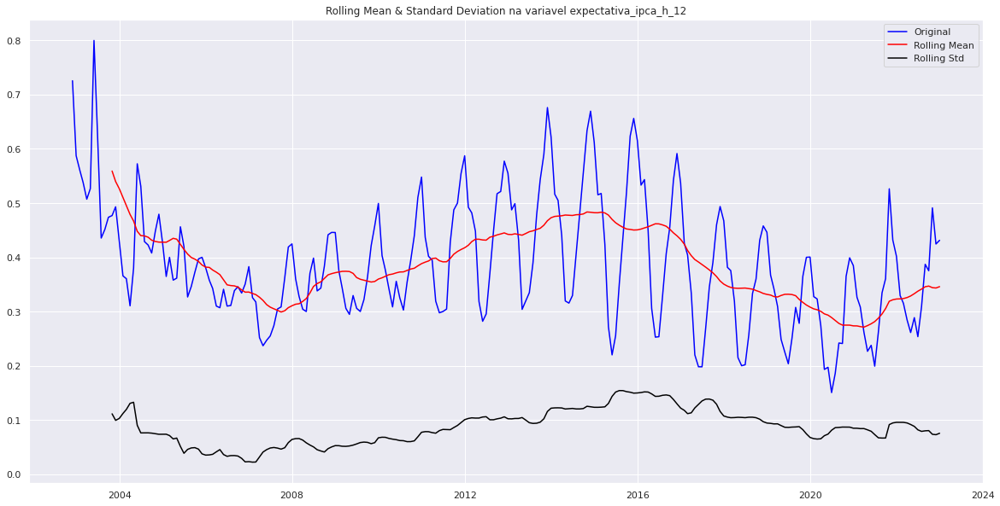

Results of Dickey-Fuller Test:Coluna expectativa_ipca_h_12
Test Statistic                  -1.753429
p-value                          0.403816
#Lags Used                      14.000000
Number of Observations Used    227.000000
Critical Value (1%)             -3.459490
Critical Value (5%)             -2.874358
Critical Value (10%)            -2.573602
dtype: float64


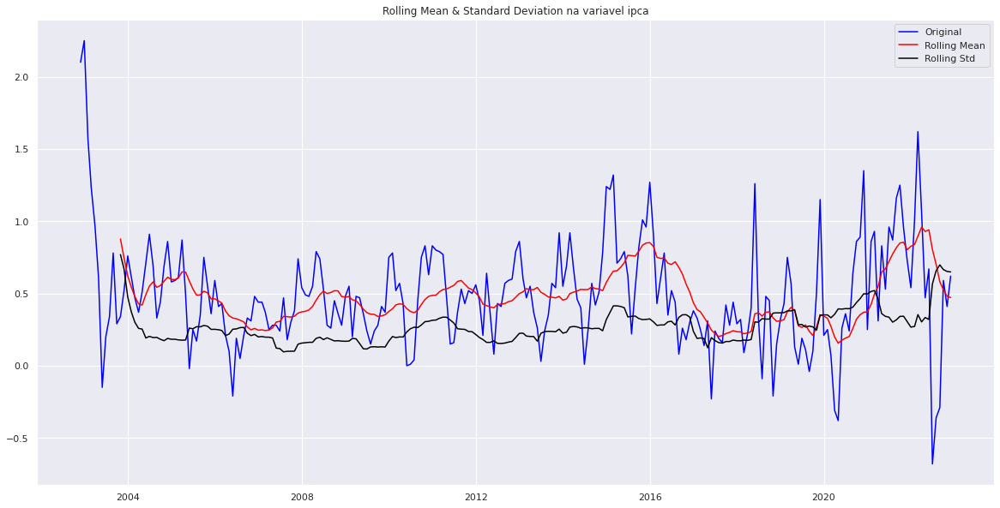

Results of Dickey-Fuller Test:Coluna ipca
Test Statistic                -7.971344e+00
p-value                        2.775933e-12
#Lags Used                     0.000000e+00
Number of Observations Used    2.400000e+02
Critical Value (1%)           -3.457894e+00
Critical Value (5%)           -2.873659e+00
Critical Value (10%)          -2.573229e+00
dtype: float64


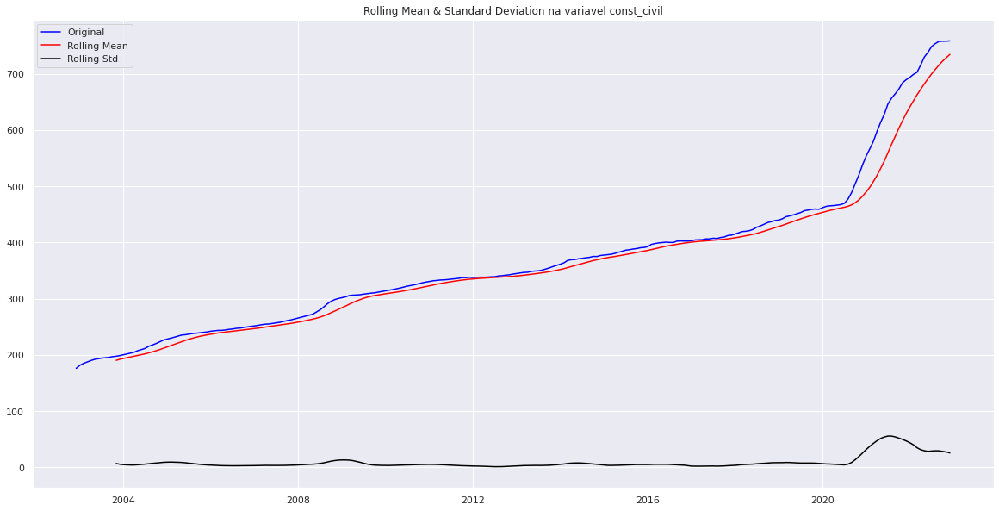

Results of Dickey-Fuller Test:Coluna const_civil
Test Statistic                   0.757961
p-value                          0.990926
#Lags Used                       8.000000
Number of Observations Used    232.000000
Critical Value (1%)             -3.458855
Critical Value (5%)             -2.874080
Critical Value (10%)            -2.573453
dtype: float64


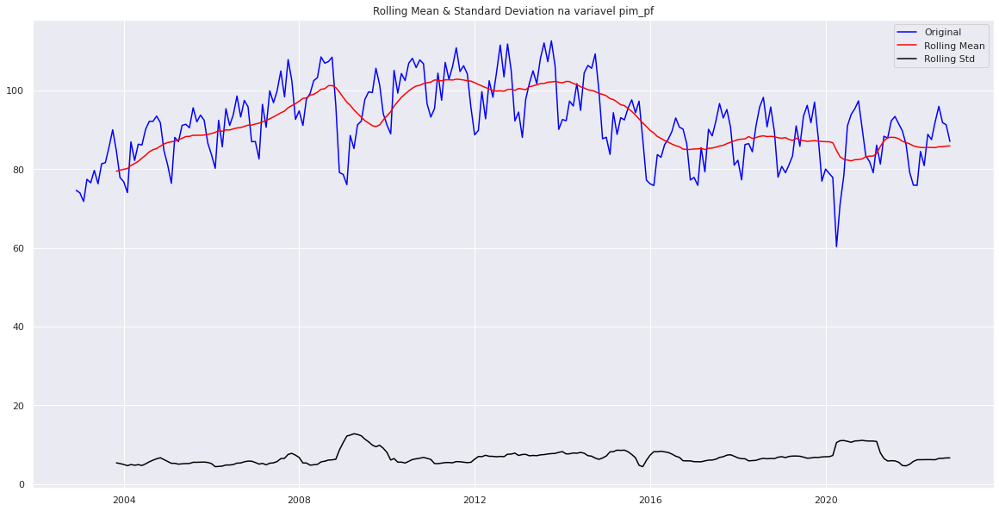

Results of Dickey-Fuller Test:Coluna pim_pf
Test Statistic                  -1.895475
p-value                          0.334193
#Lags Used                      15.000000
Number of Observations Used    224.000000
Critical Value (1%)             -3.459885
Critical Value (5%)             -2.874531
Critical Value (10%)            -2.573694
dtype: float64


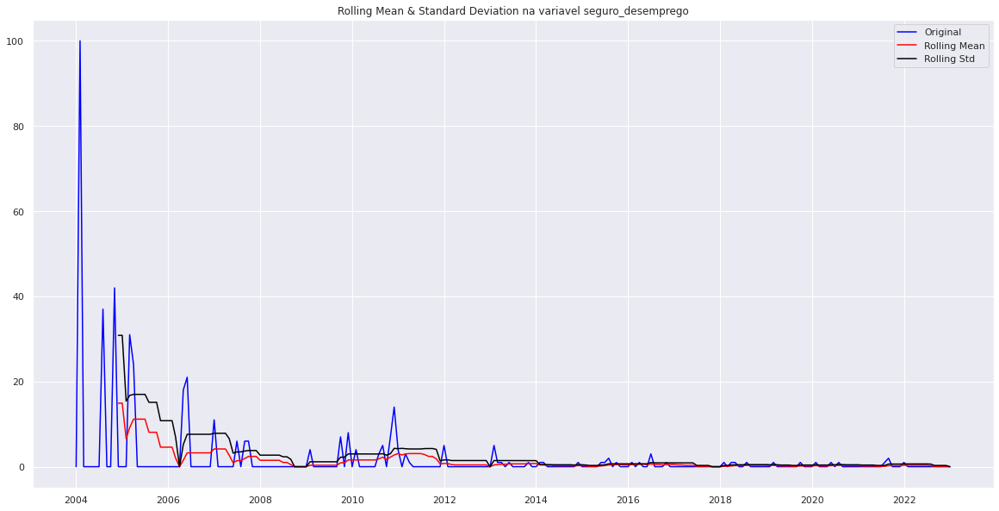

Results of Dickey-Fuller Test:Coluna seguro_desemprego
Test Statistic                -6.894301e+00
p-value                        1.331014e-09
#Lags Used                     1.300000e+01
Number of Observations Used    2.150000e+02
Critical Value (1%)           -3.461136e+00
Critical Value (5%)           -2.875079e+00
Critical Value (10%)          -2.573986e+00
dtype: float64


/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-va

In [ ]:
test = test_stationarity(dados)

In [ ]:
test

,Teste_kpss,Estacionaria_ou_nâo_kpss,Teste_adf,Estacionaria_ou_nâo_adf
cambio,0.01,Nâo estacionaria,0.958213,Nâo estacionaria
pib_mensal,0.01,Nâo estacionaria,0.99878,Nâo estacionaria
igp_m,0.1,Estacionaria,0.0,Estacionaria
igp_di,0.1,Estacionaria,0.000079,Estacionaria
m1,0.01,Nâo estacionaria,0.951334,Nâo estacionaria
m2,0.01,Nâo estacionaria,1.0,Nâo estacionaria
m3,0.01,Nâo estacionaria,0.99906,Nâo estacionaria
m4,0.01,Nâo estacionaria,0.99901,Nâo estacionaria
estoque_caged,0.01,Nâo estacionaria,0.436115,Nâo estacionaria
saldo_bc,0.1,Estacionaria,0.397055,Nâo estacionaria


###Verificando a diferenca de estacionaridade
#http://alkaline-ml.com/pmdarima/1.5.1/modules/generated/pmdarima.arima.ndiffs.html

In [ ]:
from pmdarima import arima

In [ ]:
def report_ndiffs (dados,test=['kpss', 'adf', 'pp'],alpha=0.05):
  dat_ndifis = pd.DataFrame(index=dados.columns)
  for i in test:
    dat_n = []
    for j in dados.columns:
      dat_n.append(arima.ndiffs(dados[j].dropna(),alpha,test=i))
    dat_ndifis[i] = dat_n
  result = []
  for k in range(len(dat_ndifis)):
    result.append(np.where(dat_ndifis.iloc[k,0]==dat_ndifis.iloc[k,1],dat_ndifis.iloc[k,0],
         np.where(dat_ndifis.iloc[k,1]==dat_ndifis.iloc[k,2],dat_ndifis.iloc[k,1],
                  np.where(dat_ndifis.iloc[k,0]==dat_ndifis.iloc[k,2],dat_ndifis.iloc[k,2],''))))
  dat_ndifis['Ndifis'] = result
  dat_ndifis.sort_values(by='Ndifis',ascending=False,inplace=True)
  dat_ndifis['Ndifis'] = dat_ndifis['Ndifis'].astype(int)
  return dat_ndifis

In [ ]:
n_difis = report_ndiffs(dados)
n_difis

,kpss,adf,pp,Ndifis
const_civil,2,2,1,2
cambio,2,1,1,1
vendas_auto,1,1,0,1
pib_mensal,1,1,0,1
consumo_energia,1,1,0,1
ir,1,1,0,1
ltn,2,1,1,1
divida_liquida_spc,2,1,1,1
brent_fob,1,1,1,1
m4,2,1,1,1


###Ajustando dados nao estacionarios metodo de diferenciacao

https://www.youtube.com/watch?v=JuG8hwVK5uQ

Modelagem de séries temporais frequentemente exige a aplicação de transformações nas variáveis, tal como a bem conhecida primeira diferença. Formalmente, podemos descrever essa transformação como:


Ou seja, dado uma série temporal regularmente espaçada, subtraímos do valor em t o valor anterior (t-1), obtendo a série dita "na primeira diferença" ou "nas diferenças".

A mudança de nível da série geralmente contorna diversas características "não desejadas" pelo analista como tendência, sazonalidade, etc., mas dificulta a interpretação dos valores - especialmente quando pretende-se comunicá-los para públicos não técnicos. Para este objetivo é de grande utilidade saber como diferenciar uma série temporal e, sobretudo, também como reverter a transformação.

In [ ]:
def corrigindo_nao_estacionaridade(base,n_difis):
  dados_est = base.copy()
  for i in n_difis[n_difis['Ndifis'] >= 1].index:
    if i == 'ipca':
      dados_est[i] = dados_est[i]
    else:
      dados_est[i] = dados_est[i].diff(periods=n_difis[n_difis.index.isin([i])]['Ndifis'])
  return dados_est

In [ ]:
dados_est = corrigindo_nao_estacionaridade(dados,n_difis)
dados_est

,cambio,pib_mensal,igp_m,igp_di,m1,m2,m3,m4,estoque_caged,saldo_bc,...,expectativa_ipca_h_7,expectativa_ipca_h_8,expectativa_ipca_h_9,expectativa_ipca_h_10,expectativa_ipca_h_11,expectativa_ipca_h_12,ipca,const_civil,pim_pf,seguro_desemprego
2002-12-01,NaN,NaN,3.75,2.70,NaN,NaN,NaN,NaN,NaN,1711.3,...,1.011500,0.712000,0.728095,0.731000,0.746667,0.725714,2.10,NaN,74.61271,NaN
2003-01-01,-0.1875,-4530.1,2.33,2.17,-3551161.0,-9104698.0,4946889.0,10236600.0,35485.0,1059.3,...,0.724091,0.716364,0.758636,0.710909,0.726190,0.587368,2.25,NaN,73.98043,NaN
2003-02-01,0.1524,5671.9,2.28,1.59,-6704315.0,2738970.0,10733933.0,5472623.0,84029.0,1022.7,...,0.687500,0.719474,0.700000,0.700000,0.597895,0.560625,1.57,8.86,71.78186,NaN
2003-03-01,-0.1439,8764.5,1.53,1.66,-2411904.0,-5833601.0,3923578.0,5114424.0,21261.0,1437.3,...,0.698889,0.666316,0.697222,0.615789,0.528947,0.538000,1.23,5.77,77.41394,NaN
2003-04-01,-0.3282,855.7,0.92,0.41,-1733804.0,-2674804.0,2088107.0,2629597.0,154024.0,1616.2,...,0.630000,0.690000,0.626316,0.527619,0.544211,0.507222,0.97,4.82,76.52576,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-01,0.0937,-30269.9,-0.95,-1.22,-4000957.0,72436436.0,83363757.0,85345796.0,278489.0,2052.4,...,0.352829,0.321648,0.301905,0.246000,0.312060,0.387052,-0.29,9.16,91.81049,0.0
2022-10-01,0.0133,9790.3,-0.97,-0.62,-4956225.0,4635491.0,31389526.0,59333893.0,162029.0,2130.6,...,0.315216,0.292750,0.242368,0.293684,0.380250,0.375211,0.59,4.30,91.26549,0.0
2022-11-01,0.0244,-3580.4,-0.56,-0.18,-588230.0,36988235.0,-25371483.0,20367004.0,135495.0,5140.0,...,0.287095,0.241368,0.294000,0.383600,0.362165,0.491225,0.41,0.37,87.03596,0.0
2022-12-01,-0.0323,NaN,0.45,0.31,NaN,NaN,NaN,NaN,NaN,NaN,...,0.244318,0.312143,0.401591,0.365810,0.509023,0.424552,0.62,0.60,NaN,0.0


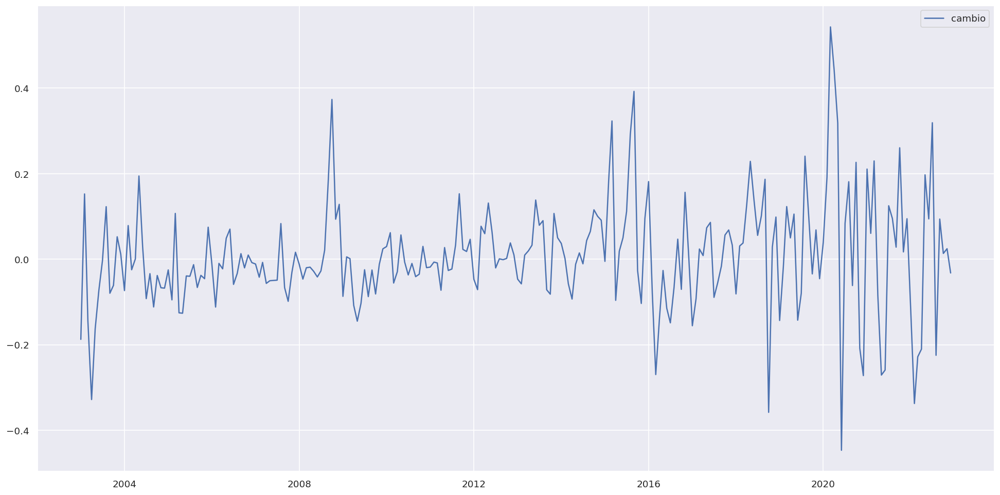

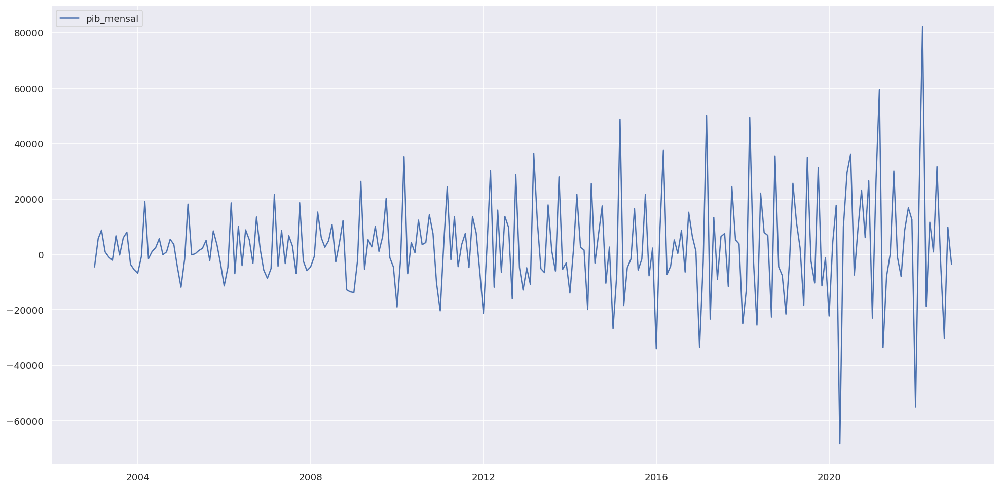

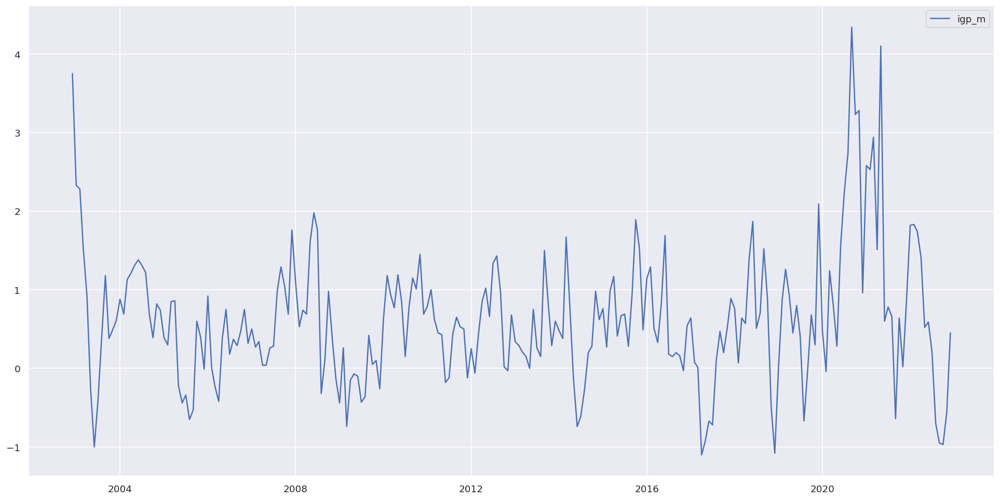

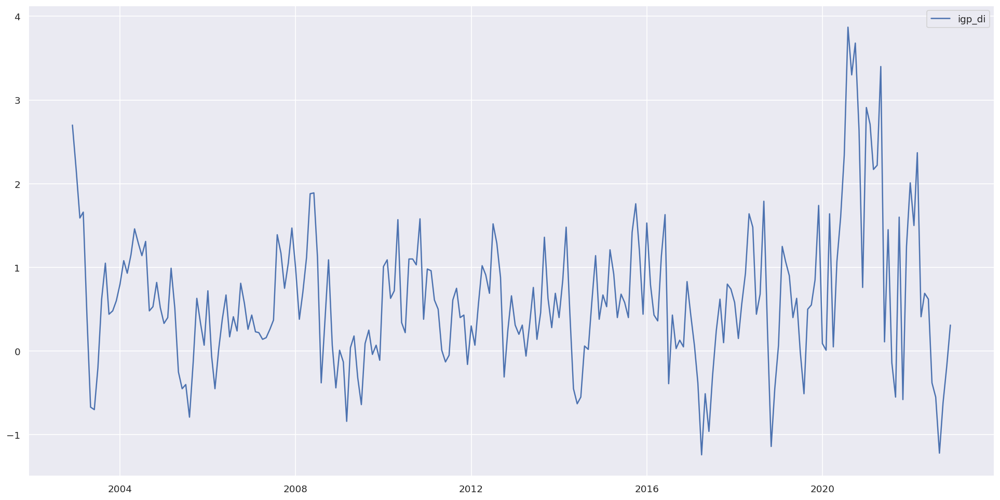

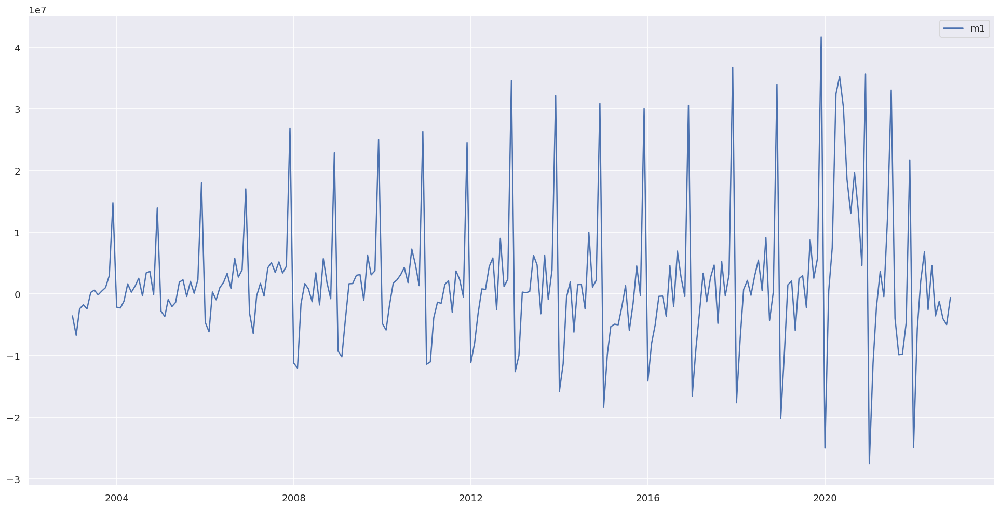

...

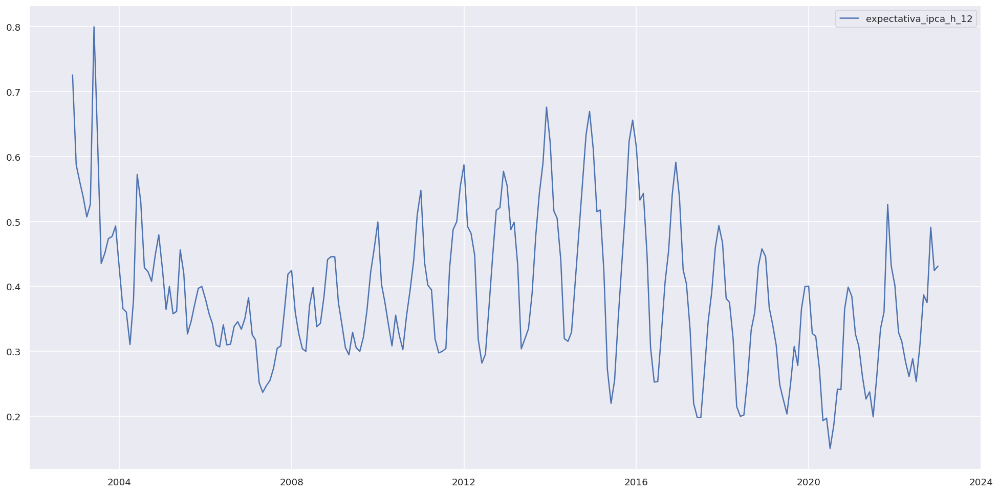

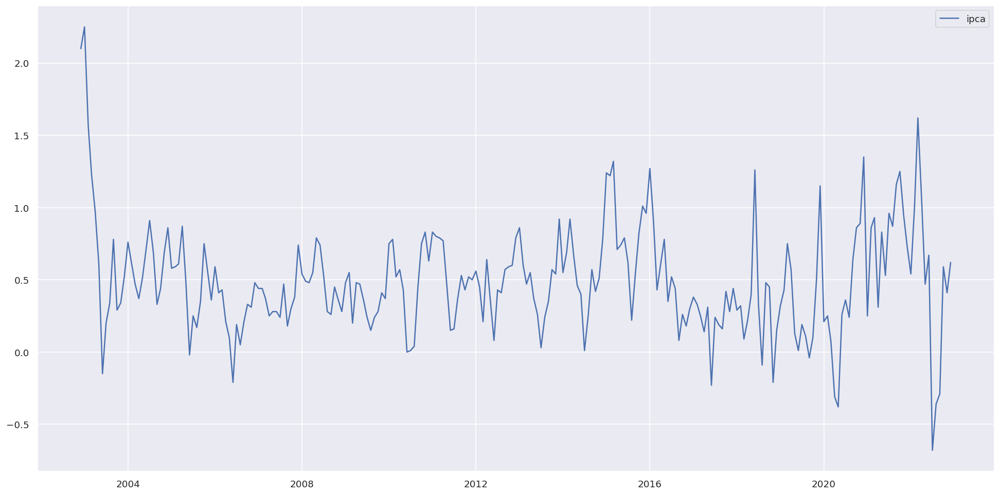

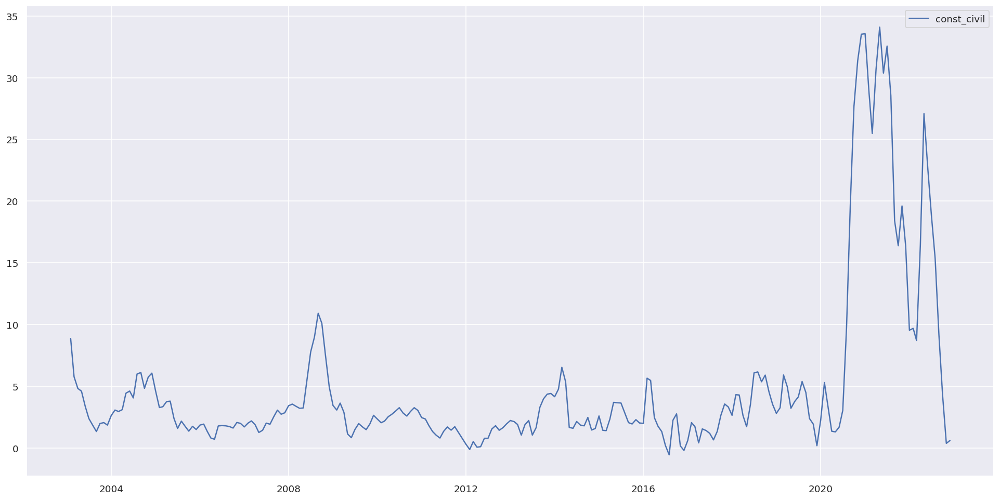

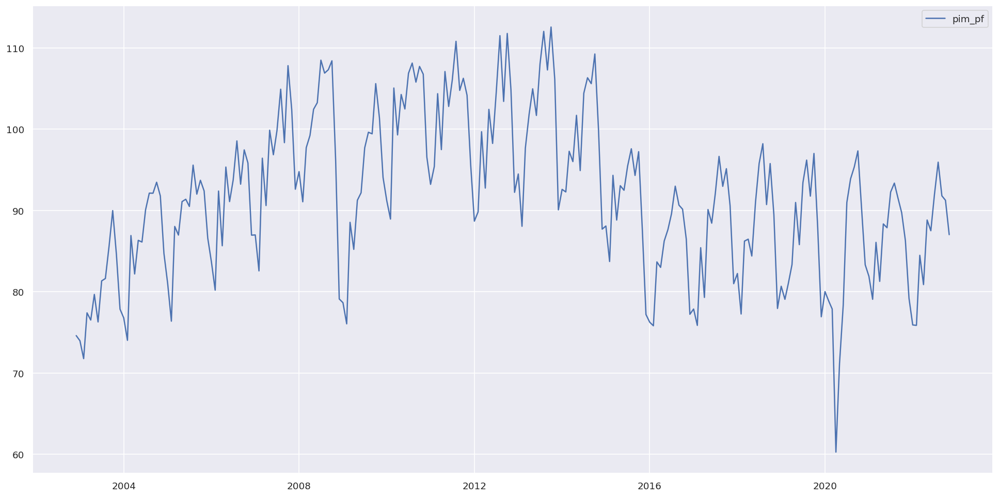

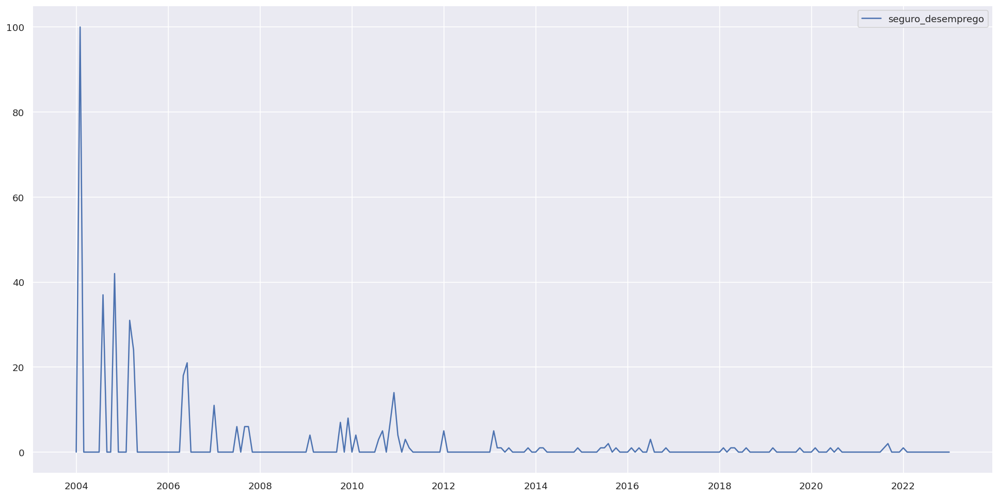

In [ ]:
plotar(dados_est)

##Epandir base criando defasagens

In [ ]:
def criando_defasagens(base,numero_defasagens=4):
  base_def = base.copy()
  for j in range(numero_defasagens):
    for i in base.columns:
      base_def[i+str('_lags_')+str(j+1)] = base_def[i].shift(j+1)
  return base_def

In [ ]:
dados_defasados = criando_defasagens(dados_est,4)
dados_defasados.head()

<ipython-input-81-3726a801c273>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  base_def[i+str('_lags_')+str(j+1)] = base_def[i].shift(j+1)
<ipython-input-81-3726a801c273>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  base_def[i+str('_lags_')+str(j+1)] = base_def[i].shift(j+1)
<ipython-input-81-3726a801c273>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. 

,cambio,pib_mensal,igp_m,igp_di,m1,m2,m3,m4,estoque_caged,saldo_bc,...,expectativa_ipca_h_7_lags_4,expectativa_ipca_h_8_lags_4,expectativa_ipca_h_9_lags_4,expectativa_ipca_h_10_lags_4,expectativa_ipca_h_11_lags_4,expectativa_ipca_h_12_lags_4,ipca_lags_4,const_civil_lags_4,pim_pf_lags_4,seguro_desemprego_lags_4
2002-12-01,NaN,NaN,3.75,2.70,NaN,NaN,NaN,NaN,NaN,1711.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003-01-01,-0.1875,-4530.1,2.33,2.17,-3551161.0,-9104698.0,4946889.0,10236600.0,35485.0,1059.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003-02-01,0.1524,5671.9,2.28,1.59,-6704315.0,2738970.0,10733933.0,5472623.0,84029.0,1022.7,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003-03-01,-0.1439,8764.5,1.53,1.66,-2411904.0,-5833601.0,3923578.0,5114424.0,21261.0,1437.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003-04-01,-0.3282,855.7,0.92,0.41,-1733804.0,-2674804.0,2088107.0,2629597.0,154024.0,1616.2,...,1.0115,0.712,0.728095,0.731,0.746667,0.725714,2.1,NaN,74.61271,NaN


##Corrigindo valores nulos

In [ ]:
##Substituindo os ultimos valores pelos anterires
dados_defasados.fillna(method='ffill',inplace=True)

In [ ]:
##Apagando todas os valores nulos faltantes
dados_defasados.dropna(inplace=True)

In [ ]:
dados_defasados.head()

,cambio,pib_mensal,igp_m,igp_di,m1,m2,m3,m4,estoque_caged,saldo_bc,...,expectativa_ipca_h_7_lags_4,expectativa_ipca_h_8_lags_4,expectativa_ipca_h_9_lags_4,expectativa_ipca_h_10_lags_4,expectativa_ipca_h_11_lags_4,expectativa_ipca_h_12_lags_4,ipca_lags_4,const_civil_lags_4,pim_pf_lags_4,seguro_desemprego_lags_4
2004-05-01,0.1944,1002.5,1.31,1.46,289897.0,14617813.0,32475875.0,16865290.0,321597.0,2995.7,...,0.405263,0.445000,0.450526,0.491500,0.498947,0.428824,0.76,2.62,76.79072,0.0
2004-06-01,0.0287,2456.1,1.38,1.29,1278880.0,8155656.0,8087054.0,12074269.0,235952.0,3668.0,...,0.418333,0.431765,0.450000,0.488235,0.455000,0.365714,0.61,3.07,74.03381,100.0
2004-07-01,-0.0923,5645.2,1.31,1.14,2552083.0,5455222.0,10511183.0,14409820.0,233254.0,3321.6,...,0.411739,0.444783,0.489130,0.470455,0.375833,0.360500,0.47,2.95,86.92685,0.0
2004-08-01,-0.0339,-145.8,1.22,1.31,-304284.0,8474845.0,12500293.0,8220228.0,255023.0,3317.9,...,0.453000,0.492105,0.476316,0.360909,0.359474,0.310500,0.37,3.10,82.19893,0.0
2004-09-01,-0.1118,898.7,0.69,0.48,3431389.0,6877943.0,9448588.0,13984910.0,236936.0,3044.2,...,0.493500,0.484000,0.381739,0.367500,0.316190,0.380000,0.51,4.43,86.33377,0.0


##Apagando variaveis no tempo t menos ipca e expectativas

In [ ]:
dados.columns

Index(['cambio', 'pib_mensal', 'igp_m', 'igp_di', 'm1', 'm2', 'm3', 'm4',
       'estoque_caged', 'saldo_bc', 'vendas_auto', 'divida_liquida_spc', 'ltn',
       'ir', 'ibovespa', 'consumo_energia', 'brent_fob',
       'expectativa_ipca_h_1', 'expectativa_ipca_h_2', 'expectativa_ipca_h_3',
       'expectativa_ipca_h_4', 'expectativa_ipca_h_5', 'expectativa_ipca_h_6',
       'expectativa_ipca_h_7', 'expectativa_ipca_h_8', 'expectativa_ipca_h_9',
       'expectativa_ipca_h_10', 'expectativa_ipca_h_11',
       'expectativa_ipca_h_12', 'ipca', 'const_civil', 'pim_pf',
       'seguro_desemprego'],
      dtype='object')

In [ ]:
lis = ['cambio', 'pib_mensal', 'igp_m', 'igp_di', 'm1', 'm2', 'm3', 'm4',
       'estoque_caged', 'saldo_bc', 'vendas_auto', 'divida_liquida_spc', 'ltn',
       'ir', 'ibovespa', 'consumo_energia', 'brent_fob','const_civil', 'pim_pf',
       'seguro_desemprego']

In [ ]:
lis = ['pim_pf_bens_consumo', 'pmc_volume', 'cambio', 'pib_mensal',
       'igp_m', 'igp_di', 'm1', 'm2', 'm3', 'm4', 'estoque_caged', 'saldo_bc',
       'vendas_auto', 'divida_liquida_spc', 'ltn', 'ir', 'ibovespa',
       'consumo_energia', 'brent_fob', 'seguro_desemprego']
      

In [ ]:
#dados_defasados.columns[1:24]

Index(['pib_mensal', 'igp_m', 'igp_di', 'm1', 'm2', 'm3', 'm4',
       'estoque_caged', 'saldo_bc', 'vendas_auto', 'divida_liquida_spc', 'ltn',
       'ir', 'ibovespa', 'consumo_energia', 'brent_fob',
       'expectativa_ipca_h_1', 'expectativa_ipca_h_2', 'expectativa_ipca_h_3',
       'expectativa_ipca_h_4', 'expectativa_ipca_h_5', 'expectativa_ipca_h_6',
       'expectativa_ipca_h_7'],
      dtype='object')

In [ ]:
dados_defasados

,cambio,pib_mensal,igp_m,igp_di,m1,m2,m3,m4,estoque_caged,saldo_bc,...,expectativa_ipca_h_7_lags_4,expectativa_ipca_h_8_lags_4,expectativa_ipca_h_9_lags_4,expectativa_ipca_h_10_lags_4,expectativa_ipca_h_11_lags_4,expectativa_ipca_h_12_lags_4,ipca_lags_4,const_civil_lags_4,pim_pf_lags_4,seguro_desemprego_lags_4
2004-05-01,0.1944,1002.5,1.31,1.46,289897.0,14617813.0,32475875.0,16865290.0,321597.0,2995.7,...,0.405263,0.445000,0.450526,0.491500,0.498947,0.428824,0.76,2.62,76.79072,0.0
2004-06-01,0.0287,2456.1,1.38,1.29,1278880.0,8155656.0,8087054.0,12074269.0,235952.0,3668.0,...,0.418333,0.431765,0.450000,0.488235,0.455000,0.365714,0.61,3.07,74.03381,100.0
2004-07-01,-0.0923,5645.2,1.31,1.14,2552083.0,5455222.0,10511183.0,14409820.0,233254.0,3321.6,...,0.411739,0.444783,0.489130,0.470455,0.375833,0.360500,0.47,2.95,86.92685,0.0
2004-08-01,-0.0339,-145.8,1.22,1.31,-304284.0,8474845.0,12500293.0,8220228.0,255023.0,3317.9,...,0.453000,0.492105,0.476316,0.360909,0.359474,0.310500,0.37,3.10,82.19893,0.0
2004-09-01,-0.1118,898.7,0.69,0.48,3431389.0,6877943.0,9448588.0,13984910.0,236936.0,3044.2,...,0.493500,0.484000,0.381739,0.367500,0.316190,0.380000,0.51,4.43,86.33377,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-01,0.0937,-30269.9,-0.95,-1.22,-4000957.0,72436436.0,83363757.0,85345796.0,278489.0,2052.4,...,0.526967,0.515827,0.402913,0.368762,0.310000,0.261268,0.47,27.09,88.83537,0.0
2022-10-01,0.0133,9790.3,-0.97,-0.62,-4956225.0,4635491.0,31389526.0,59333893.0,162029.0,2130.6,...,0.573620,0.444477,0.402452,0.322867,0.288350,0.288705,0.67,22.70,87.51774,0.0
2022-11-01,0.0244,-3580.4,-0.56,-0.18,-588230.0,36988235.0,-25371483.0,20367004.0,135495.0,5140.0,...,0.487004,0.428625,0.341871,0.308615,0.302905,0.253600,-0.68,18.87,91.95659,0.0
2022-12-01,-0.0323,-3580.4,0.45,0.31,-588230.0,36988235.0,-25371483.0,20367004.0,135495.0,5140.0,...,0.449682,0.363583,0.322577,0.304130,0.255870,0.308700,-0.36,15.35,95.95352,0.0


In [ ]:
dados_defasados.drop(lis, axis=1,inplace=True)

In [ ]:
dados_defasados

,expectativa_ipca_h_1,expectativa_ipca_h_2,expectativa_ipca_h_3,expectativa_ipca_h_4,expectativa_ipca_h_5,expectativa_ipca_h_6,expectativa_ipca_h_7,expectativa_ipca_h_8,expectativa_ipca_h_9,expectativa_ipca_h_10,...,expectativa_ipca_h_7_lags_4,expectativa_ipca_h_8_lags_4,expectativa_ipca_h_9_lags_4,expectativa_ipca_h_10_lags_4,expectativa_ipca_h_11_lags_4,expectativa_ipca_h_12_lags_4,ipca_lags_4,const_civil_lags_4,pim_pf_lags_4,seguro_desemprego_lags_4
2004-05-01,0.709524,0.500000,0.432000,0.410000,0.440000,0.463810,0.493500,0.484000,0.381739,0.367500,...,0.405263,0.445000,0.450526,0.491500,0.498947,0.428824,0.76,2.62,76.79072,0.0
2004-06-01,0.545500,0.456000,0.432381,0.458500,0.490476,0.534762,0.502381,0.376667,0.385714,0.342857,...,0.418333,0.431765,0.450000,0.488235,0.455000,0.365714,0.61,3.07,74.03381,100.0
2004-07-01,0.495000,0.442273,0.486364,0.498182,0.551429,0.507143,0.383333,0.377619,0.349091,0.434286,...,0.411739,0.444783,0.489130,0.470455,0.375833,0.360500,0.47,2.95,86.92685,0.0
2004-08-01,0.452727,0.542381,0.500909,0.583333,0.510000,0.410417,0.369524,0.350455,0.438095,0.653636,...,0.453000,0.492105,0.476316,0.360909,0.359474,0.310500,0.37,3.10,82.19893,0.0
2004-09-01,0.545000,0.506667,0.590000,0.514286,0.413636,0.393500,0.380952,0.444286,0.664762,0.528095,...,0.493500,0.484000,0.381739,0.367500,0.316190,0.380000,0.51,4.43,86.33377,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-01,0.499270,0.720714,0.598429,0.621662,0.475486,0.447976,0.352829,0.321648,0.301905,0.246000,...,0.526967,0.515827,0.402913,0.368762,0.310000,0.261268,0.47,27.09,88.83537,0.0
2022-10-01,0.697265,0.548158,0.609584,0.453409,0.440000,0.345500,0.315216,0.292750,0.242368,0.293684,...,0.573620,0.444477,0.402452,0.322867,0.288350,0.288705,0.67,22.70,87.51774,0.0
2022-11-01,0.554250,0.622895,0.459476,0.436150,0.348250,0.324668,0.287095,0.241368,0.294000,0.383600,...,0.487004,0.428625,0.341871,0.308615,0.302905,0.253600,-0.68,18.87,91.95659,0.0
2022-12-01,0.658595,0.477609,0.462714,0.358877,0.334855,0.296609,0.244318,0.312143,0.401591,0.365810,...,0.449682,0.363583,0.322577,0.304130,0.255870,0.308700,-0.36,15.35,95.95352,0.0


##Criando dummies do ipca por mes

In [ ]:
pd.to_datetime(dados_defasados.index).month

Int64Index([ 5,  6,  7,  8,  9, 10, 11, 12,  1,  2,
            ...
             4,  5,  6,  7,  8,  9, 10, 11, 12,  1],
           dtype='int64', length=225)

In [ ]:
dumm_mes = pd.get_dummies(pd.to_datetime(dados_defasados.index).month)
##Apagando a ultima coluna que todas os numeros zeros irao responder pr ela
dumm_mes.drop(12,axis=1,inplace=True)

In [ ]:
dumm_mes.columns = ['jan','fev','mar','abr','mai','jun','jul','ago','set','out','nov']
dumm_mes.index = dados_defasados.index

In [ ]:
dados_fin = dados_defasados.join(dumm_mes)
dados_fin.head()

,expectativa_ipca_h_1,expectativa_ipca_h_2,expectativa_ipca_h_3,expectativa_ipca_h_4,expectativa_ipca_h_5,expectativa_ipca_h_6,expectativa_ipca_h_7,expectativa_ipca_h_8,expectativa_ipca_h_9,expectativa_ipca_h_10,...,fev,mar,abr,mai,jun,jul,ago,set,out,nov
2004-05-01,0.709524,0.500000,0.432000,0.410000,0.440000,0.463810,0.493500,0.484000,0.381739,0.367500,...,0,0,0,1,0,0,0,0,0,0
2004-06-01,0.545500,0.456000,0.432381,0.458500,0.490476,0.534762,0.502381,0.376667,0.385714,0.342857,...,0,0,0,0,1,0,0,0,0,0
2004-07-01,0.495000,0.442273,0.486364,0.498182,0.551429,0.507143,0.383333,0.377619,0.349091,0.434286,...,0,0,0,0,0,1,0,0,0,0
2004-08-01,0.452727,0.542381,0.500909,0.583333,0.510000,0.410417,0.369524,0.350455,0.438095,0.653636,...,0,0,0,0,0,0,1,0,0,0
2004-09-01,0.545000,0.506667,0.590000,0.514286,0.413636,0.393500,0.380952,0.444286,0.664762,0.528095,...,0,0,0,0,0,0,0,1,0,0


In [ ]:
dados_fin.tail()

,expectativa_ipca_h_1,expectativa_ipca_h_2,expectativa_ipca_h_3,expectativa_ipca_h_4,expectativa_ipca_h_5,expectativa_ipca_h_6,expectativa_ipca_h_7,expectativa_ipca_h_8,expectativa_ipca_h_9,expectativa_ipca_h_10,...,fev,mar,abr,mai,jun,jul,ago,set,out,nov
2022-09-01,0.499270,0.720714,0.598429,0.621662,0.475486,0.447976,0.352829,0.321648,0.301905,0.246000,...,0,0,0,0,0,0,0,1,0,0
2022-10-01,0.697265,0.548158,0.609584,0.453409,0.440000,0.345500,0.315216,0.292750,0.242368,0.293684,...,0,0,0,0,0,0,0,0,1,0
2022-11-01,0.554250,0.622895,0.459476,0.436150,0.348250,0.324668,0.287095,0.241368,0.294000,0.383600,...,0,0,0,0,0,0,0,0,0,1
2022-12-01,0.658595,0.477609,0.462714,0.358877,0.334855,0.296609,0.244318,0.312143,0.401591,0.365810,...,0,0,0,0,0,0,0,0,0,0
2023-01-01,0.504100,0.505000,0.369780,0.336667,0.308330,0.252067,0.302222,0.395000,0.383600,0.478160,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#dados_fin.to_csv('dados_fin')

In [ ]:
dados_fin_val = dados_fin.iloc[-12:,]

In [ ]:
dados_fin = dados_fin.iloc[:dados_fin.shape[0]-12,]

#Treinando os modelos
https://goldinlocks.github.io/Time-Series-Cross-Validation/

In [ ]:
from pmdarima.model_selection import train_test_split

In [ ]:
from sklearn.model_selection import KFold, ShuffleSplit, StratifiedKFold, StratifiedShuffleSplit, TimeSeriesSplit

In [ ]:
from sklearn.model_selection import TimeSeriesSplit

In [ ]:
y= dados_fin['ipca'].values
X=dados_fin.loc[:,dados_fin.columns != 'ipca'].values

In [ ]:
def plot_cv_indices(cv, X, y, group, ax, n_splits, lw=10,lim=100):
    """Create a sample plot for indices of a cross-validation object."""
    cmap_data = plt.cm.Paired
    cmap_cv = plt.cm.coolwarm

    # Generate the training/testing visualizations for each CV split
    for ii, (tr, tt) in enumerate(cv.split(X=X, y=y, groups=group)):
        # Fill in indices with the training/test groups
        indices = np.array([np.nan] * len(X))
        indices[tt] = 1
        indices[tr] = 0

        # Visualize the results
        ax.scatter(
            range(len(indices)),
            [ii + 0.5] * len(indices),
            c=indices,
            marker="_",
            lw=lw,
            cmap=cmap_cv,
            vmin=-0.2,
            vmax=1.2,
        )

    # Plot the data classes and groups at the end
    ax.scatter(
        range(len(X)), [ii + 1.5] * len(X), c=y, marker="_", lw=lw, cmap=cmap_data
    )

    ax.scatter(
        range(len(X)), [ii + 2.5] * len(X), c=group, marker="_", lw=lw, cmap=cmap_data
    )

    # Formatting
    yticklabels = list(range(n_splits)) + ["class", "group"]
    ax.set(
        yticks=np.arange(n_splits + 2) + 0.5,
        yticklabels=yticklabels,
        xlabel="Sample index",
        ylabel="CV iteration",
        ylim=[n_splits + 2.2, -0.2],
        xlim=[0, lim],
    )
    ax.set_title("{}".format(type(cv).__name__), fontsize=15)
    return ax

In [ ]:
rng = np.random.RandomState(0)

In [ ]:
dados_defasados.shape

(222, 145)

In [ ]:
n_splits = 10
test_size = 7
tscv= TimeSeriesSplit(max_train_size=223,n_splits= 10,test_size=12)
for fold, (train_index, test_index) in enumerate(tscv.split(X)):
    print("Fold: {}".format(fold))
    print("TRAIN indices:", train_index, "\n", "TEST indices:", test_index)
    print("\n")
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]


ng = np.random.RandomState(1338)
#cv, X, y, groups, ax, n_splits
#fig, ax = plt.subplots()
#plot_cv_indices(tscv, X,  y, groups,ax, n_splits,lw=10,lim=len(X))


Fold: 0
TRAIN indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92] 
 TEST indices: [ 93  94  95  96  97  98  99 100 101 102 103 104]


Fold: 1
TRAIN indices: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104] 
 TEST indices: [105 106 107 108 109 110 111 112 113 114 115 116]


Fold: 2
TRAIN indices: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  2

In [ ]:
y= dados_fin['ipca'].values
X=dados_fin.loc[:,dados_fin.columns != 'ipca'].values

##Treinando o RandomForestRegressor

In [ ]:
def frame(consjunto_de_dados,nome):
  a = pd.DataFrame(consjunto_de_dados).mean()
  b = pd.DataFrame(a)
  b.columns = [nome]
  return b 

In [ ]:
X.shape

(213, 155)

In [ ]:
#https://medium.com/keita-starts-data-science/time-series-split-with-scikit-learn-74f5be38489e
"""Este código executa uma divisão de série temporal usando a função TimeSeriesSplit do módulo model_selection do scikit-learn e aplica um Random Forest Regressor do módulo ensemble do scikit-learn a um conjunto de dados. 
O código também usa a função mean_squared_error do módulo de métricas do scikit-learn para avaliar o desempenho do modelo e os módulos matemático e aleatório.
O código começa inicializando listas vazias para armazenar resultados e criando uma instância da classe TimeSeriesSplit, com max_train_size = 213, n_splits = 10 e test_size = 12.
O código então entra em um loop while, que será executado até 1000 vezes, tentando diferentes combinações de parâmetros para o Random Forest Regressor. Dentro do loop while, o código usa random.choices para selecionar aleatoriamente uma das 
três funções de critério ('squared_error', 'absolute_error', 'friedman_mse') e random.sample para selecionar aleatoriamente um valor max_features, n_estimators, max_depth e min_samples_leaf a partir de uma gama de valores possíveis.
Para cada combinação dos parâmetros, o código executa uma divisão de série temporal usando o objeto TimeSeriesSplit e ajusta o Random Forest Regressor aos dados de treinamento. O código então usa o regressor para prever os dados de validação e 
calcula a raiz do erro quadrático médio (RMSE) entre os dados de validação previstos e reais. O RMSE é anexado a uma lista mean_erro.
Após a divisão da série temporal, o código anexa a combinação de parâmetros usados ​​e a média da lista mean_erro à lista de pontuação.
Por fim, o código cria um dataframe a partir da lista de pontuação, nomeia as colunas do dataframe e classifica o dataframe por mean_square_error em ordem crescente.
"""
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import math
import random
tscv = TimeSeriesSplit(max_train_size=223,n_splits= 10,test_size=12)
i = 1
score = []
maxima_cara = X.shape[1]
##X_tr, X_val = X_train[tr_index], X_train[val_index]
#y_tr, y_val = y_train[tr_index], y_train[val_index]
parada = 0
pred_peri_random = []
while parada < 1000:
  for cr in random.choices(['squared_error','absolute_error','friedman_mse']):
    for mf in random.sample(list(range(1, maxima_cara)),1):
      for ne in random.sample(list(range(5, 100)),1):
        for md in random.sample(list(range(1, 40)),1):
          for msl in random.sample(list(range(1, 100)),1):
            mean_erro = []
            valores_reais = []
            for train_index, test_index in tscv.split(X):
              X_tr, X_val = X[train_index], X[test_index]
              y_tr, y_val = y[train_index], y[test_index]
              rfr = RandomForestRegressor(random_state=0,
              criterion = cr,
              max_features=int(mf),
              n_estimators=int(ne),
              max_depth=int(md),
              min_samples_leaf=int(msl))
              rfr.fit(X_tr, y_tr)
              mean_erro.append(np.sqrt(mean_squared_error(y_val, rfr.predict(X_val))))
              pred_peri_random.append(rfr.predict(X_val))
              valores_reais.append(y_val)
            score.append([cr,mf, ne, md, msl,np.mean(mean_erro)])
            print(score[-1])
            print(parada)
            parada = parada + 1
result_random = pd.DataFrame.from_dict(score)
result_random.columns = ['criterion','max_features', 'n_estimators','max_depth','min_samples_leaf','mean_square_error']
result_random.sort_values(by='mean_square_error',inplace=True)
predicao_por_periodo = frame(pred_peri_random,'random')
predicao_por_periodo['ipca'] = frame(valores_reais,'ipca')

['absolute_error', 118, 35, 15, 41, 0.32927318877067946]
0
['absolute_error', 87, 29, 32, 48, 0.3335500532341874]
1
['absolute_error', 56, 84, 29, 42, 0.3315591278246757]
2
['squared_error', 9, 33, 32, 56, 0.34617264778899093]
3
['absolute_error', 16, 52, 33, 38, 0.3317285711509189]
4
['friedman_mse', 64, 68, 35, 28, 0.30030959524658807]
5
['friedman_mse', 33, 34, 10, 17, 0.30404634122678875]
6
['squared_error', 2, 55, 1, 90, 0.34864881376675927]
7
['squared_error', 48, 85, 3, 93, 0.34895435823400234]
8
['squared_error', 106, 42, 4, 80, 0.34874250710831733]
9
['absolute_error', 16, 60, 35, 83, 0.3463324759675124]
10
['friedman_mse', 90, 10, 36, 44, 0.31742312917461074]
11
['friedman_mse', 62, 18, 10, 5, 0.2863819300222363]
12
['squared_error', 58, 27, 35, 6, 0.2907072232651015]
13
['friedman_mse', 83, 66, 23, 72, 0.3488011220070224]
14
['squared_error', 105, 79, 29, 38, 0.3090550387952532]
15
['absolute_error', 79, 96, 1, 65, 0.3473390395372231]
16
['friedman_mse', 74, 29, 33, 62, 0.34

In [ ]:
result_random

,criterion,max_features,n_estimators,max_depth,min_samples_leaf,mean_square_error
838,friedman_mse,74,32,30,4,0.280695
989,friedman_mse,116,56,25,8,0.280708
576,friedman_mse,102,32,12,4,0.281511
429,squared_error,134,16,6,16,0.281555
321,squared_error,96,32,35,7,0.281588
...,...,...,...,...,...,...
884,friedman_mse,66,92,8,64,0.350390
569,squared_error,37,96,5,62,0.350433
803,friedman_mse,37,76,35,61,0.350663
181,friedman_mse,23,96,16,60,0.351243


In [ ]:
predicao_por_periodo

,random,ipca
0,0.480608,0.605
1,0.473634,0.544
2,0.470735,0.411
3,0.431963,0.400
4,0.412807,0.371
5,0.412836,0.369
6,0.420575,0.288
7,0.431618,0.451
8,0.462719,0.574
9,0.475237,0.526


In [ ]:
result_random.to_csv('result_random.csv')

##Treinando o Reggressao lasso

In [ ]:
#https://medium.com/keita-starts-data-science/time-series-split-with-scikit-learn-74f5be38489e
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import math
from sklearn import linear_model
tscv = TimeSeriesSplit(max_train_size=213,n_splits= 10,test_size=12)
i = 1
score = []
pred_peri_lasso = []
valores_re = []
for alpha in np.linspace(0.01, 2, 1000):
  for fit_inter in random.choices(['False', 'True']):
    mean_erro = []
    for train_index, test_index in tscv.split(X):
      X_tr, X_val = X[train_index], X[test_index]
      y_tr, y_val = y[train_index], y[test_index]
      lasso = linear_model.Lasso(random_state=0,alpha=alpha,fit_intercept=fit_inter)
      lasso.fit(X_tr, y_tr)
      mean_erro.append(np.sqrt(mean_squared_error(y_val, lasso.predict(X_val))))
      pred_peri_lasso.append(lasso.predict(X_val))   
    score.append([alpha, 
                  fit_inter,
                  np.mean(mean_erro)])
    print(score[-1])
result_lasso = pd.DataFrame.from_dict(score)
result_lasso.columns = ['alpha', 'fit_inter','mean_square_error']
result_lasso.sort_values(by='mean_square_error',inplace=True)
predicao_por_periodo['lasso'] = frame(pred_peri_lasso,'lasso')

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.646e-01, tolerance: 4.925e-04
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.353e-04, tolerance: 5.516e-04
  model = cd_fast.enet_coordinate_descent(


[0.01, 'False', 0.4017785950732902]


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.215e-01, tolerance: 4.925e-04
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.640e-04, tolerance: 5.516e-04
  model = cd_fast.enet_coordinate_descent(


[0.011991991991991992, 'True', 0.40960357061068936]


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.453e-02, tolerance: 4.925e-04
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.887e-04, tolerance: 5.516e-04
  model = cd_fast.enet_coordinate_descent(


[0.013983983983983983, 'False', 0.41379931391245234]
[0.015975975975975977, 'True', 0.41633318754585413]
[0.017967967967967968, 'True', 0.41829733758702475]
[0.019959959959959958, 'False', 0.4200092572475575]
[0.021951951951951952, 'True', 0.4210345873481137]
[0.023943943943943943, 'True', 0.4218392493967148]
[0.025935935935935933, 'True', 0.4228244563474621]
[0.027927927927927927, 'False', 0.423988378614036]
[0.02991991991991992, 'True', 0.4252726018592938]
[0.03191191191191191, 'True', 0.426527860919809]
[0.0339039039039039, 'False', 0.42762715278406765]
[0.035895895895895896, 'True', 0.4290638867634892]
[0.03788788788788788, 'False', 0.4301161706996425]
[0.03987987987987988, 'False', 0.4311487017960446]
[0.04187187187187187, 'False', 0.43158484061983254]
[0.043863863863863865, 'False', 0.43202844906925986]
[0.04585585585585585, 'False', 0.43244565928694517]
[0.047847847847847846, 'False', 0.4328836755135884]
[0.04983983983983984, 'True', 0.4333383980291529]
[0.05183183183183183, 'Tr

In [ ]:
result_lasso

,alpha,fit_inter,mean_square_error
0,0.010000,False,0.401779
1,0.011992,True,0.409604
2,0.013984,False,0.413799
3,0.015976,True,0.416333
4,0.017968,True,0.418297
...,...,...,...
173,0.354615,False,0.436180
172,0.352623,True,0.436184
169,0.346647,False,0.436186
171,0.350631,False,0.436188


In [ ]:
predicao_por_periodo

,random,ipca,lasso
0,0.480608,0.605,0.687591
1,0.473634,0.544,0.560653
2,0.470735,0.411,0.667577
3,0.431963,0.400,0.659262
4,0.412807,0.371,0.263563
5,0.412836,0.369,0.131977
6,0.420575,0.288,0.021727
7,0.431618,0.451,0.250389
8,0.462719,0.574,0.455741
9,0.475237,0.526,0.624834


In [ ]:
result_lasso.to_csv('result_lasso.csv')

## Treinando gradiente Bosting 

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
import math
import random
tscv = TimeSeriesSplit(max_train_size=213,n_splits= 10,test_size=12)
i = 1
score = []
pred_peri_gd = []
maxima_cara = X.shape[1]
parada = 0
while parada < 1000:
  for los in random.choices(['squared_error', 'absolute_error', 'huber', 'quantile']):
    for rate in np.random.uniform(0.01,2,1):
      for ne in random.sample(list(range(10, 500)),1):
        for md in random.sample(list(range(1, 40)),1):
          for msl in random.sample(list(range(1, 100)),1):
            for crit in random.choices(['friedman_mse', 'squared_error']):
              mean_erro = []
              for train_index, test_index in tscv.split(X):
                X_tr, X_val = X[train_index], X[test_index]
                y_tr, y_val = y[train_index], y[test_index]
                grad_bost = GradientBoostingRegressor(random_state=0,
                loss = los,
                learning_rate = rate,
                criterion=crit,
                max_features=int(mf),
                n_estimators=int(ne),
                max_depth=int(md),
                min_samples_leaf=int(msl))
                grad_bost.fit(X_tr, y_tr)
                mean_erro.append(np.sqrt(mean_squared_error(y_val, grad_bost.predict(X_val))))
                pred_peri_gd.append(grad_bost.predict(X_val))
              score.append([los,rate,mf, ne, md, msl,crit,np.mean(mean_erro)])
              print(score[-1])
              print(parada)
              parada = parada + 1
result_gradi_bostin = pd.DataFrame.from_dict(score)
result_gradi_bostin.columns = ['loss','learning_rate','max_features', 'n_estimators','max_depth','min_samples_leaf','criterio','mean_square_error']
result_gradi_bostin.sort_values(by='mean_square_error',inplace=True)
predicao_por_periodo['gradiente_bosting'] = frame(pred_peri_gd,'gradiente_bosting')

['huber', 0.9293593332935766, 33, 331, 35, 82, 'squared_error', 0.3527911861657757]
0
['huber', 1.6485631460998185, 33, 21, 18, 99, 'squared_error', 0.3451169382066901]
1
['squared_error', 0.7426397010712741, 33, 404, 1, 3, 'friedman_mse', 0.33403897850632125]
2
['quantile', 0.2887332672393576, 33, 216, 27, 5, 'friedman_mse', 0.3400701206321937]
3
['huber', 1.0616589224503667, 33, 234, 7, 80, 'friedman_mse', 0.35752278217919264]
4
['absolute_error', 1.1034540941110726, 33, 264, 37, 98, 'squared_error', 0.3491044541065283]
5
['absolute_error', 0.3718303801608012, 33, 238, 14, 32, 'friedman_mse', 0.3031607884490139]
6
['quantile', 1.3547131998631599, 33, 66, 1, 81, 'squared_error', 0.41572658242354715]
7
['absolute_error', 1.1091094543607674, 33, 253, 30, 70, 'squared_error', 0.3393114963638159]
8
['squared_error', 0.7706165637137113, 33, 151, 37, 53, 'squared_error', 0.34285690069481217]
9
['absolute_error', 0.1005395229495642, 33, 345, 39, 68, 'squared_error', 0.32850261166489686]
10
[

In [ ]:
result_gradi_bostin

,loss,learning_rate,max_features,n_estimators,max_depth,min_samples_leaf,criterio,mean_square_error
651,squared_error,0.386973,33,323,18,24,friedman_mse,0.290179
415,squared_error,0.143379,33,296,19,17,friedman_mse,0.291416
482,squared_error,0.211897,33,34,27,44,squared_error,0.292341
617,squared_error,0.055210,33,463,23,15,squared_error,0.292342
936,absolute_error,0.498297,33,435,33,43,friedman_mse,0.292559
...,...,...,...,...,...,...,...,...
58,absolute_error,1.970806,33,212,20,12,friedman_mse,1.160333
330,huber,1.994789,33,383,16,49,friedman_mse,1.177450
597,huber,1.950014,33,448,28,6,squared_error,1.196763
790,quantile,1.706117,33,446,21,1,friedman_mse,1.225442


In [ ]:
result_gradi_bostin.to_csv('result_gradi_bostin.csv')

#Comparando os modelos

In [ ]:
y_val= dados_fin_val['ipca'].values
X_val=dados_fin_val.loc[:,dados_fin.columns != 'ipca'].values
dados_fin_val.index

DatetimeIndex(['2022-02-01', '2022-03-01', '2022-04-01', '2022-05-01',
               '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01',
               '2022-10-01', '2022-11-01', '2022-12-01', '2023-01-01'],
              dtype='datetime64[ns]', freq='MS')

##Comaprando as predicoes por periodos

In [ ]:
ipca_horizonte.mean()

expectativa_ipca_h_1     0.418607
expectativa_ipca_h_2     0.418422
expectativa_ipca_h_3     0.416287
expectativa_ipca_h_4     0.414544
expectativa_ipca_h_5     0.411285
expectativa_ipca_h_6     0.409957
expectativa_ipca_h_7     0.406922
expectativa_ipca_h_8     0.403184
expectativa_ipca_h_9     0.400810
expectativa_ipca_h_10    0.397575
expectativa_ipca_h_11    0.393023
expectativa_ipca_h_12    0.388947
dtype: float64

In [ ]:
predicao_por_periodo['focus']= frame(ipca_horizonte,'focus').values

In [ ]:
predicao_por_periodo.index = ['1_periodo','2_periodo','3_periodo','4_periodo','5_periodo',
                                '6_periodo','7_periodo','8_periodo','9_periodo','10_periodo','11_periodo','12_periodo']

In [ ]:
predicao_por_periodo

,random,ipca,lasso,gradiente_bosting,focus
1_periodo,0.480608,0.605,0.687591,0.567100,0.418607
2_periodo,0.473634,0.544,0.560653,0.566967,0.418422
3_periodo,0.470735,0.411,0.667577,0.554721,0.416287
4_periodo,0.431963,0.400,0.659262,0.478908,0.414544
5_periodo,0.412807,0.371,0.263563,0.424915,0.411285
6_periodo,0.412836,0.369,0.131977,0.427423,0.409957
7_periodo,0.420575,0.288,0.021727,0.438454,0.406922
8_periodo,0.431618,0.451,0.250389,0.456901,0.403184
9_periodo,0.462719,0.574,0.455741,0.548184,0.400810
10_periodo,0.475237,0.526,0.624834,0.557020,0.397575


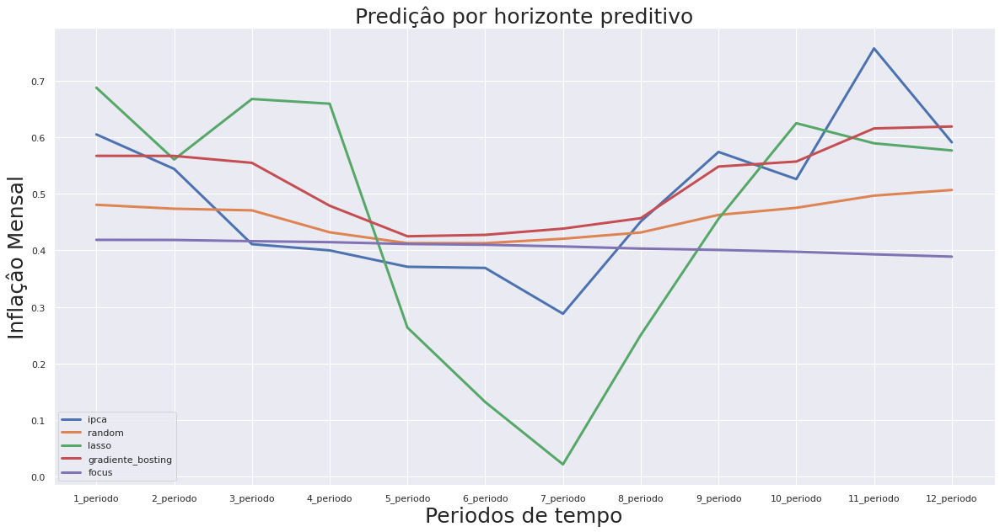

In [ ]:
plt.plot(predicao_por_periodo.index,predicao_por_periodo.ipca,label='ipca',linewidth=3)
plt.plot(predicao_por_periodo.index,predicao_por_periodo.random,label='random',linewidth=3)
plt.plot(predicao_por_periodo.index,predicao_por_periodo.lasso,label='lasso',linewidth=3)
plt.plot(predicao_por_periodo.index,predicao_por_periodo.gradiente_bosting,label='gradiente_bosting',linewidth=3)
plt.plot(predicao_por_periodo.index,predicao_por_periodo.focus,label='focus',linewidth=3)
plt.title('Prediçâo por horizonte preditivo', fontdict={'size': 25})
plt.xlabel('Periodos de tempo',fontdict={'size': 25})
plt.ylabel('Inflaçâo Mensal',fontdict={'size': 25})
plt.legend();

In [ ]:
rmse_periodos = pd.DataFrame()
for i in predicao_por_periodo.columns:
  if i == 'ipca':
    None
  else:
    rmse_periodos[i] = np.sqrt((predicao_por_periodo['ipca'] - predicao_por_periodo[i])**2)

In [ ]:
rmse_periodos

,random,lasso,gradiente_bosting,focus
1_periodo,0.124392,0.082591,0.037900,0.186393
2_periodo,0.070366,0.016653,0.022967,0.125578
3_periodo,0.059735,0.256577,0.143721,0.005287
4_periodo,0.031963,0.259262,0.078908,0.014544
5_periodo,0.041807,0.107437,0.053915,0.040285
6_periodo,0.043836,0.237023,0.058423,0.040957
7_periodo,0.132575,0.266273,0.150454,0.118922
8_periodo,0.019382,0.200611,0.005901,0.047816
9_periodo,0.111281,0.118259,0.025816,0.173190
10_periodo,0.050763,0.098834,0.031020,0.128425


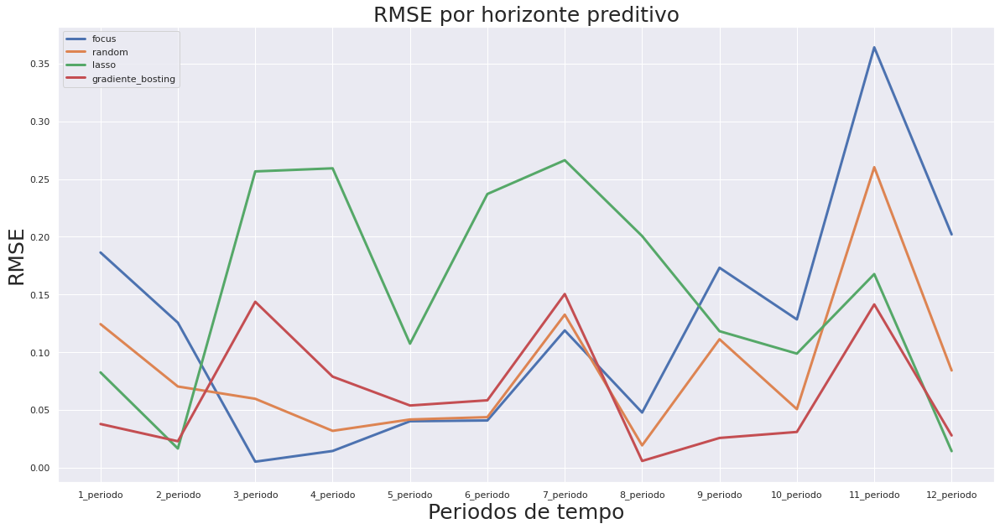

In [ ]:
plt.plot(rmse_periodos.index,rmse_periodos.focus,label='focus',linewidth=3)
plt.plot(rmse_periodos.index,rmse_periodos.random,label='random',linewidth=3)
plt.plot(rmse_periodos.index,rmse_periodos.lasso,label='lasso',linewidth=3)
plt.plot(rmse_periodos.index,rmse_periodos.gradiente_bosting,label='gradiente_bosting',linewidth=3)
plt.title('RMSE por horizonte preditivo', fontdict={'size': 25})
plt.xlabel('Periodos de tempo',fontdict={'size': 25})
plt.ylabel('RMSE',fontdict={'size': 25})
plt.legend();

##Avaliando os residuos dos medelos

https://medium.com/@krzysztofdrelczuk/acf-autocorrelation-function-simple-explanation-with-python-example-492484c32711

In [ ]:
y_val= dados_fin_val['ipca'].values
X_val=dados_fin_val.loc[:,dados_fin.columns != 'ipca'].values
dados_fin_val.index

DatetimeIndex(['2022-02-01', '2022-03-01', '2022-04-01', '2022-05-01',
               '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01',
               '2022-10-01', '2022-11-01', '2022-12-01', '2023-01-01'],
              dtype='datetime64[ns]', freq='MS')

###Regressao lasso

In [ ]:
##Pegando os melhores paramentros
for j in result_lasso.columns:
  if j == 'alpha':
    alpha = result_lasso.loc[result_lasso.index[0],j]
  if j == 'fit_inter':
    fit_inter = result_lasso.loc[result_lasso.index[0],j]
  else:
    None
print(f'Alpha:{alpha}')
print(f'fit_inter:{fit_inter}')

Alpha:0.01
fit_inter:False


In [ ]:
lasso = linear_model.Lasso(random_state=0,alpha=alpha,fit_intercept=fit_inter)
lasso.fit(X_tr, y_tr)

Lasso(alpha=0.01, fit_intercept='False', random_state=0)

In [ ]:
predic_treino = lasso.predict(X_tr)

In [ ]:
residuo_lasso = y_tr - predic_treino

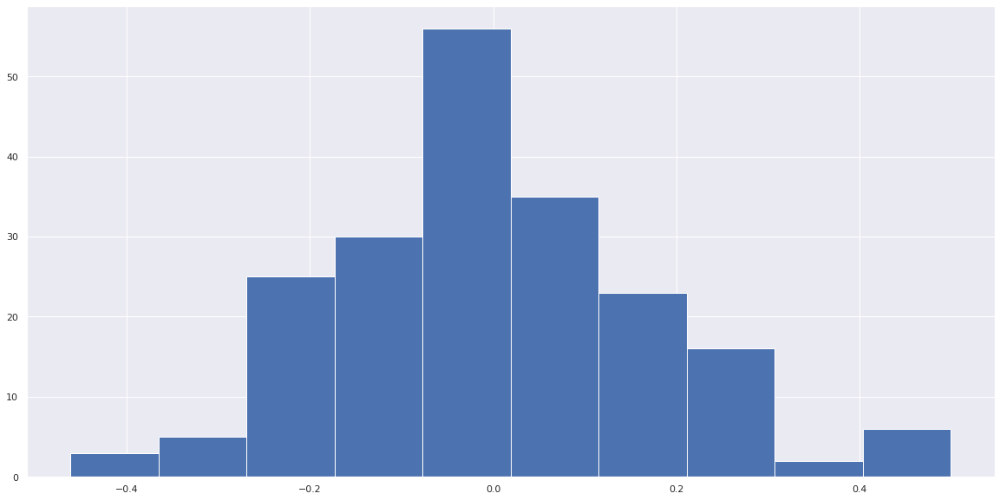

In [ ]:
plt.hist(residuo_lasso);

In [ ]:
import statsmodels.api as sm

Gráfico ACF de resíduos
Com dados de séries temporais, é altamente provável que o valor de uma variável observada no período de tempo atual seja semelhante ao seu valor no período anterior, ou mesmo no período anterior a esse, e assim por diante. Portanto, ao ajustar um modelo de regressão a dados de séries temporais, é comum encontrar autocorrelação nos resíduos. Nesse caso, o modelo estimado viola a suposição de não haver autocorrelação nos erros, e nossas previsões podem ser ineficientes — sobra alguma informação que deve ser contabilizada no modelo para obter melhores previsões. As previsões de um modelo com erros autocorrelacionados ainda não são viesadas e, portanto, não estão “erradas”, mas geralmente terão intervalos de previsão maiores do que o necessário. Portanto, devemos sempre olhar para um gráfico ACF dos resíduos.

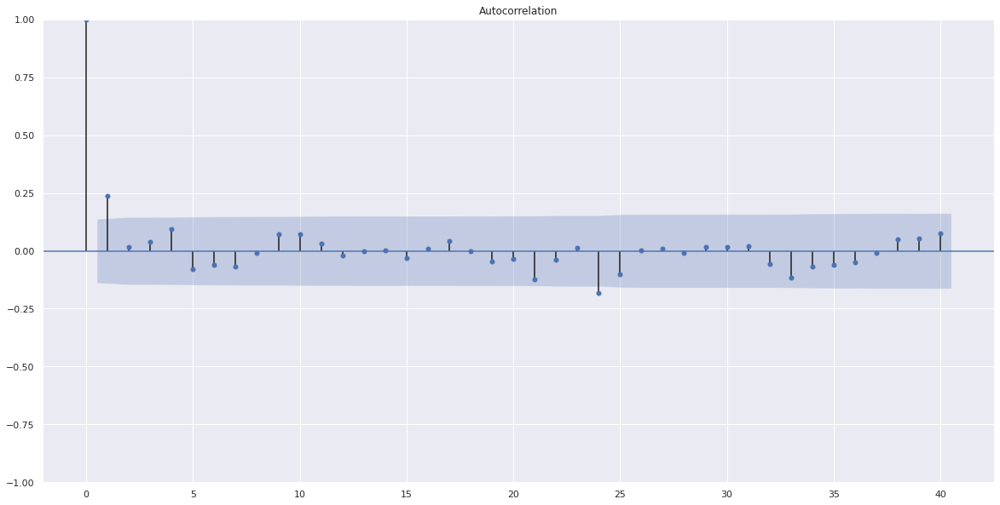

In [ ]:
sm.graphics.tsa.plot_acf(residuo_lasso,lags=40)
plt.show()

###Random forest

In [ ]:
##Pegando os melhores paramentros
for j in result_random.columns:
  if j == 'criterion':
    criterion = result_random.loc[result_random.index[0],j]
  if j == 'max_features':
    max_features = result_random.loc[result_random.index[0],j]
  if j == 'n_estimators':
    n_estimators	 = result_random.loc[result_random.index[0],j]
  if j == 'max_depth':
    max_depth = result_random.loc[result_random.index[0],j]
  if j == 'min_samples_leaf':
    min_samples_leaf = result_random.loc[result_random.index[0],j]
  else:
    None
print(f'criterion:{criterion}')
print(f'max_features:{max_features}')
print(f'n_estimators:{n_estimators}')
print(f'max_depth:{max_depth}')
print(f'min_samples_leaf:{min_samples_leaf}')

criterion:friedman_mse
max_features:74
n_estimators:32
max_depth:30
min_samples_leaf:4


In [ ]:
result_random.head()

,criterion,max_features,n_estimators,max_depth,min_samples_leaf,mean_square_error
838,friedman_mse,74,32,30,4,0.280695
989,friedman_mse,116,56,25,8,0.280708
576,friedman_mse,102,32,12,4,0.281511
429,squared_error,134,16,6,16,0.281555
321,squared_error,96,32,35,7,0.281588


In [ ]:
rfr = RandomForestRegressor(random_state=0,
              criterion = criterion,
              max_features=max_features,
              n_estimators=n_estimators,
              max_depth=max_depth,
              min_samples_leaf=min_samples_leaf)

In [ ]:
rfr.fit(X_tr, y_tr)

RandomForestRegressor(criterion='friedman_mse', max_depth=30, max_features=74,
                      min_samples_leaf=4, n_estimators=32, random_state=0)

In [ ]:
predic_rando_treino = rfr.predict(X_tr)

In [ ]:
residuo_random = y_tr-predic_rando_treino

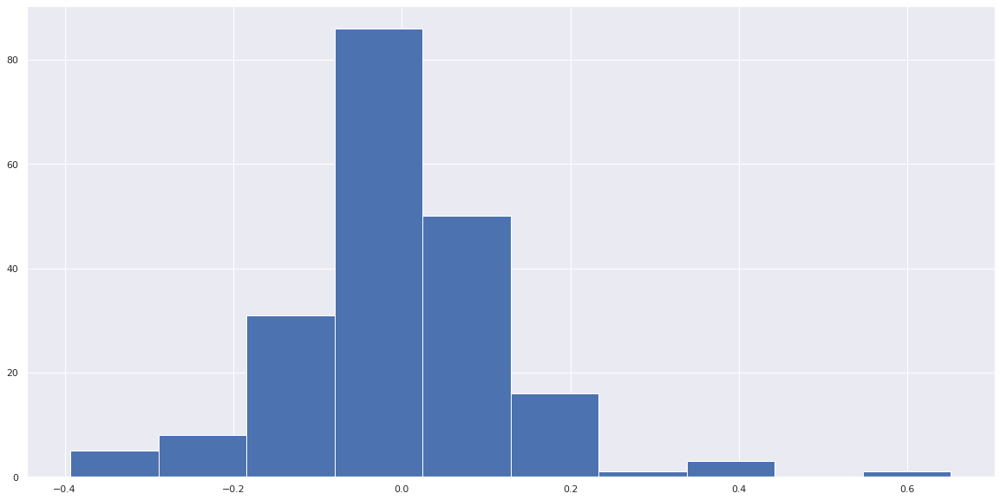

In [ ]:
plt.hist(residuo_random);

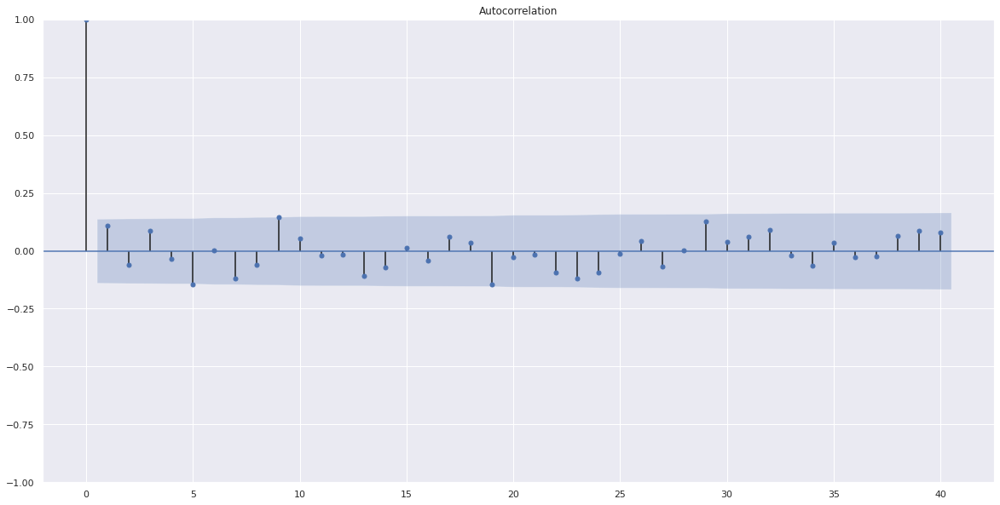

In [ ]:
sm.graphics.tsa.plot_acf(residuo_random,lags=40)
plt.show()

###Gradiente Boosting

In [ ]:
result_gradi_bostin.head()

,loss,learning_rate,max_features,n_estimators,max_depth,min_samples_leaf,criterio,mean_square_error
651,squared_error,0.386973,33,323,18,24,friedman_mse,0.290179
415,squared_error,0.143379,33,296,19,17,friedman_mse,0.291416
482,squared_error,0.211897,33,34,27,44,squared_error,0.292341
617,squared_error,0.055210,33,463,23,15,squared_error,0.292342
936,absolute_error,0.498297,33,435,33,43,friedman_mse,0.292559


In [ ]:
##Pegando os melhores paramentros
for j in result_gradi_bostin.columns:
  if j == 'loss':
    loss = result_gradi_bostin.loc[result_gradi_bostin.index[0],j]
  if j == 'max_features':
    max_features = result_gradi_bostin.loc[result_gradi_bostin.index[0],j]
  if j == 'n_estimators':
    n_estimators	 = result_gradi_bostin.loc[result_gradi_bostin.index[0],j]
  if j == 'max_depth':
    max_depth = result_gradi_bostin.loc[result_gradi_bostin.index[0],j]
  if j == 'min_samples_leaf':
    min_samples_leaf = result_gradi_bostin.loc[result_gradi_bostin.index[0],j]
  if j == 'learning_rate':
    learning_rate = result_gradi_bostin.loc[result_gradi_bostin.index[0],j]
  if j == 'criterio':
    criterio = result_gradi_bostin.loc[result_gradi_bostin.index[0],j]
  else:
    None
print(f'criterion:{criterion}')
print(f'max_features:{max_features}')
print(f'n_estimators:{n_estimators}')
print(f'max_depth:{max_depth}')
print(f'min_samples_leaf:{min_samples_leaf}')
print(f'learning_rate:{learning_rate}')
print(f'loss:{loss}')

criterion:friedman_mse
max_features:33
n_estimators:323
max_depth:18
min_samples_leaf:24
learning_rate:0.386972999548988
loss:squared_error


In [ ]:
grad_bost = GradientBoostingRegressor(random_state=0,
                loss = loss,
                learning_rate = learning_rate,
                criterion=criterion,
                max_features=max_features,
                n_estimators=n_estimators,
                max_depth=max_depth,
                min_samples_leaf=min_samples_leaf)
grad_bost.fit(X_tr, y_tr)

GradientBoostingRegressor(learning_rate=0.386972999548988, max_depth=18,
                          max_features=33, min_samples_leaf=24,
                          n_estimators=323, random_state=0)

In [ ]:
predict_grad_treino = grad_bost.predict(X_tr)

In [ ]:
residuo_grad = y_tr - predict_grad_treino

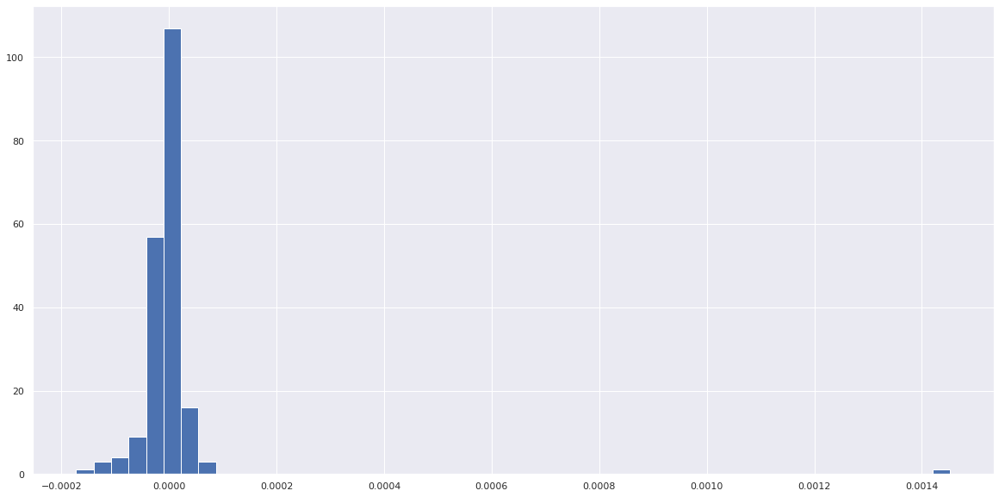

In [ ]:
plt.hist(residuo_grad,bins=50);

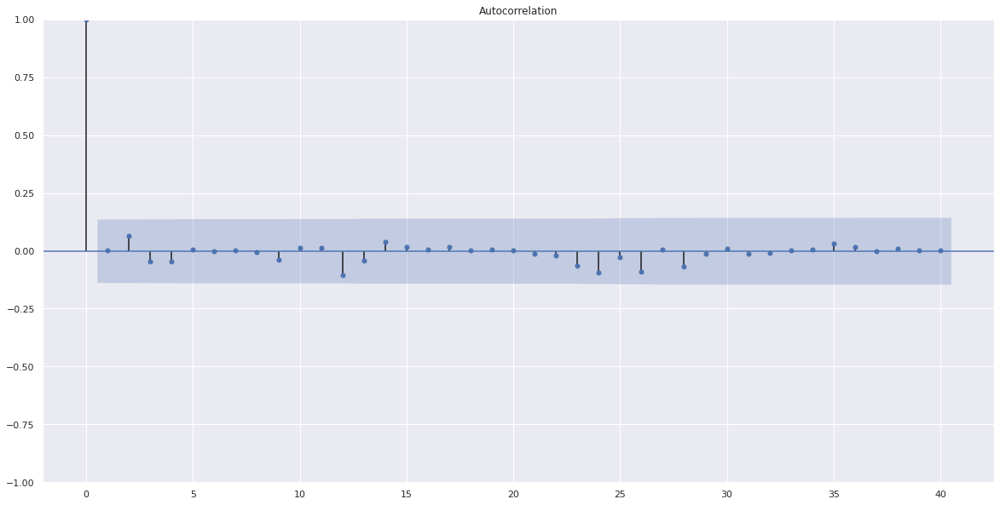

In [ ]:
sm.graphics.tsa.plot_acf(residuo_grad,lags=40)
plt.show()

##Previsao com dados de validacao

In [ ]:
y_val= dados_fin_val['ipca'].values
X_val=dados_fin_val.loc[:,dados_fin.columns != 'ipca'].values

In [ ]:
predict_lasso_vali = lasso.predict(X_val)
predict_random_vali = rfr.predict(X_val)
predict_gradiente_vali = grad_bost.predict(X_val)

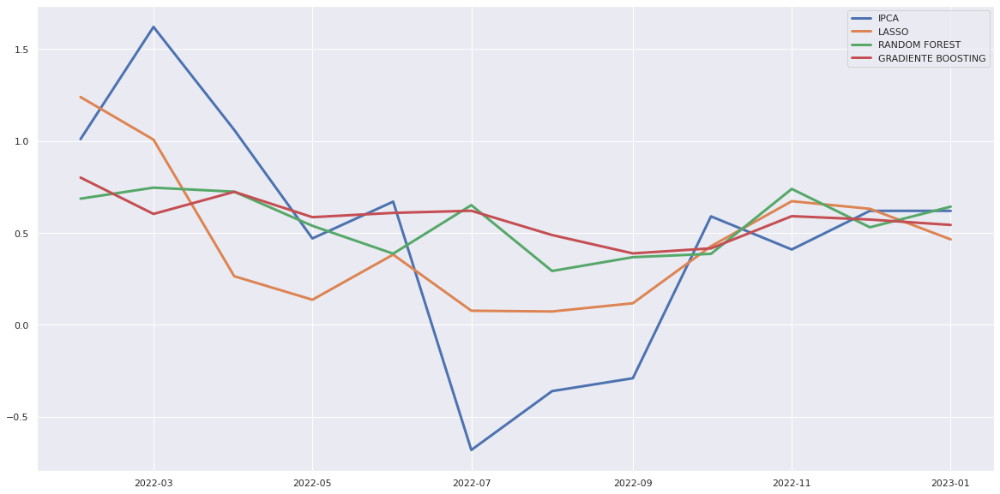

In [ ]:
plt.plot(dados_fin_val.index,y_val, label='IPCA',linewidth=3)
plt.plot(dados_fin_val.index,predict_lasso_vali, label='LASSO',linewidth=3)
plt.plot(dados_fin_val.index,predict_random_vali, label='RANDOM FOREST',linewidth=3)
plt.plot(dados_fin_val.index,predict_gradiente_vali, label='GRADIENTE BOOSTING',linewidth=3)
plt.legend();


##Cenarios com dados fora da amostra

In [ ]:
dados_defasados

,expectativa_ipca_h_1,expectativa_ipca_h_2,expectativa_ipca_h_3,expectativa_ipca_h_4,expectativa_ipca_h_5,expectativa_ipca_h_6,expectativa_ipca_h_7,expectativa_ipca_h_8,expectativa_ipca_h_9,expectativa_ipca_h_10,...,expectativa_ipca_h_7_lags_4,expectativa_ipca_h_8_lags_4,expectativa_ipca_h_9_lags_4,expectativa_ipca_h_10_lags_4,expectativa_ipca_h_11_lags_4,expectativa_ipca_h_12_lags_4,ipca_lags_4,const_civil_lags_4,pim_pf_lags_4,seguro_desemprego_lags_4
2004-05-01,0.709524,0.500000,0.432000,0.410000,0.440000,0.463810,0.493500,0.484000,0.381739,0.367500,...,0.405263,0.445000,0.450526,0.491500,0.498947,0.428824,0.76,2.62,76.79072,0.0
2004-06-01,0.545500,0.456000,0.432381,0.458500,0.490476,0.534762,0.502381,0.376667,0.385714,0.342857,...,0.418333,0.431765,0.450000,0.488235,0.455000,0.365714,0.61,3.07,74.03381,100.0
2004-07-01,0.495000,0.442273,0.486364,0.498182,0.551429,0.507143,0.383333,0.377619,0.349091,0.434286,...,0.411739,0.444783,0.489130,0.470455,0.375833,0.360500,0.47,2.95,86.92685,0.0
2004-08-01,0.452727,0.542381,0.500909,0.583333,0.510000,0.410417,0.369524,0.350455,0.438095,0.653636,...,0.453000,0.492105,0.476316,0.360909,0.359474,0.310500,0.37,3.10,82.19893,0.0
2004-09-01,0.545000,0.506667,0.590000,0.514286,0.413636,0.393500,0.380952,0.444286,0.664762,0.528095,...,0.493500,0.484000,0.381739,0.367500,0.316190,0.380000,0.51,4.43,86.33377,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-01,0.499270,0.720714,0.598429,0.621662,0.475486,0.447976,0.352829,0.321648,0.301905,0.246000,...,0.526967,0.515827,0.402913,0.368762,0.310000,0.261268,0.47,27.09,88.83537,0.0
2022-10-01,0.697265,0.548158,0.609584,0.453409,0.440000,0.345500,0.315216,0.292750,0.242368,0.293684,...,0.573620,0.444477,0.402452,0.322867,0.288350,0.288705,0.67,22.70,87.51774,0.0
2022-11-01,0.554250,0.622895,0.459476,0.436150,0.348250,0.324668,0.287095,0.241368,0.294000,0.383600,...,0.487004,0.428625,0.341871,0.308615,0.302905,0.253600,-0.68,18.87,91.95659,0.0
2022-12-01,0.658595,0.477609,0.462714,0.358877,0.334855,0.296609,0.244318,0.312143,0.401591,0.365810,...,0.449682,0.363583,0.322577,0.304130,0.255870,0.308700,-0.36,15.35,95.95352,0.0


In [ ]:
y_fora= dados_defasados['ipca']
X_fora=dados_defasados.loc[:,dados_defasados.columns != 'ipca']

In [ ]:
dates = pd.date_range(start=datetime.now() + timedelta(days=30), periods=12, freq='M').strftime("%Y-%m-%d")
arima_predict = pd.DataFrame(index=dates)
for k in X_fora.columns:
  model_arima = arima.auto_arima(X_fora[k].values, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)
  model_arima.fit(X_fora[k].values)
  arima_predict[k] = model_arima.predict(n_periods=12)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-381.617, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=258.976, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-381.669, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=26.795, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-381.721, Time=0.09 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=-379.778, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-379.742, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=-377.972, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-408.260, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-410.095, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=-238.870, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-408.215, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-349.731, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-406.099, Time=0.26 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-587.350, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=242.132, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-574.005, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-33.272, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-585.252, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-585.409, Time=0.18 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-230.458, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-587.213, Time=0.05 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-587.008, Time=0.87 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-615.985, Time=0.41 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-522.776, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-593.257, Time=0.23 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-629.246, Time=1.12 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-622.592, Time=0.56 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept  

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-599.395, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=238.856, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-584.955, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-34.414, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-598.658, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-597.631, Time=0.17 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-229.284, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-600.528, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=-598.650, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=-598.141, Time=0.31 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-636.147, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-603.532, Time=0.13 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=-642.825, Time=0.31 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=-645.373, Time=0.63 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept  

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-610.178, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=235.944, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-591.360, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-37.646, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-609.061, Time=0.10 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-608.313, Time=0.34 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=inf, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-611.052, Time=0.09 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=-609.072, Time=0.17 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=-609.280, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-647.844, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-609.150, Time=0.15 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=-653.174, Time=0.34 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=-655.397, Time=0.61 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AI

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-624.610, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=231.494, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-602.403, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-43.921, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-625.068, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-627.011, Time=0.07 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=-625.078, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=-624.674, Time=0.32 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-666.857, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-620.289, Time=0.07 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=-674.517, Time=0.21 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=-675.697, Time=0.71 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-676.389, Time=0.65 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-651.957, Time=0.29 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept  

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-647.226, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=225.315, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-616.209, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-53.348, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-645.533, Time=0.09 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-645.127, Time=0.13 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-646.923, Time=0.06 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-644.560, Time=0.59 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-676.428, Time=0.30 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-562.412, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-634.713, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-696.306, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-690.438, Time=0.09 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AI

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-672.210, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=220.226, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-635.165, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-61.481, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-670.579, Time=0.44 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-670.340, Time=0.53 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=inf, Time=0.67 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-668.955, Time=0.18 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-669.913, Time=0.82 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-701.330, Time=0.58 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-579.457, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-652.901, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-716.571, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-711.848, Time=0.33 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AI

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=86.270, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=390.966, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=91.497, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=234.807, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=64.978, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=88.554, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=inf, Time=0.45 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.38 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=77.622, Time=0.12 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=85.984, Time=0.09 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=0.55 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=59.894, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=57.894, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=76.534, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=55.896, Time=0.07 sec
 ARI

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=975.284, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=938.790, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=859.921, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=973.285, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=857.923, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=inf, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=inf, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=936.792, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 1.536 seconds


<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1456.805, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2679.867, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2403.003, Time=0.24 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.34 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1451.118, Time=0.12 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=inf, Time=0.16 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1450.998, Time=0.14 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=0.60 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=1422.752, Time=0.13 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=1433.774, Time=0.20 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=inf, Time=0.65 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1423.244, Time=0.28 sec

Best model:  ARIMA(2,0,3)(0,0,0)[0]          
Total fit time: 3.038 seconds
Performing stepwise search to minimize aic


<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1602.022, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1602.842, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1600.816, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1600.409, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=1602.188, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1583.497, Time=0.13 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1579.999, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1604.004, Time=0.10 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=1568.656, Time=0.38 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=1577.518, Time=0.17 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=inf, Time=0.65 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=1575.670, Time=0.25 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1569.573, Time=0.68 sec

Best model:  ARIMA(3,0,2)(0,0,0)[0]          
Total fit time: 2.844 seconds


<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-300.042, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-286.872, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-300.688, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-302.032, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-300.041, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-298.444, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-301.013, Time=0.07 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0]          
Total fit time: 0.593 seconds
Performing stepwise search to minimize aic


<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


 ARIMA(1,0,1)(0,0,0)[0]             : AIC=5029.835, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=5043.051, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=5038.525, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=5031.178, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=5020.318, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=5019.255, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=5019.614, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=5021.505, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=5001.021, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=5030.708, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=4994.988, Time=0.07 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=4996.898, Time=0.26 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=5000.821, Time=0.10 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0] intercept
Total fit time: 0.908 seconds
Performing stepwise search to minimize aic


<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


 ARIMA(1,0,1)(0,0,0)[0]             : AIC=448.096, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=650.314, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=455.528, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=540.775, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=447.277, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=450.584, Time=0.07 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=inf, Time=0.49 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=448.003, Time=0.07 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=449.185, Time=0.05 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=449.548, Time=0.45 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=440.661, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=438.886, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=476.191, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=439.805, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=462.939, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=650.904, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=474.982, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=540.003, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=463.027, Time=0.31 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=462.543, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=526.317, Time=0.05 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=458.329, Time=0.17 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=459.474, Time=0.17 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=460.167, Time=0.17 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=463.236, Time=0.17 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=457.549, Time=0.13 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=461.182, Time=0.08 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=467.832, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=448.8

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=7950.935, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=7946.934, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=7948.936, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=7948.968, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=7940.523, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=7942.211, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=7942.246, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=7944.168, Time=0.10 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.247 seconds
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8435.665, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=8515.766, Time=0.01 sec


<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8477.988, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8488.142, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8436.719, Time=0.16 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=8439.867, Time=0.14 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=8489.867, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8468.761, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=8435.910, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=8443.593, Time=0.10 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0]          
Total fit time: 0.910 seconds


<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8555.411, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=8700.128, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8638.892, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8663.115, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8555.765, Time=0.17 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=8557.024, Time=0.13 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=8660.498, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8617.173, Time=0.05 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=8556.390, Time=0.28 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=8577.224, Time=0.07 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0]          
Total fit time: 0.949 seconds
Performing stepwise search to minimize aic


<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8482.565, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=8697.589, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8574.019, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8624.843, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8483.258, Time=0.17 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=8492.459, Time=0.13 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=8627.036, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=8549.401, Time=0.04 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=8480.726, Time=0.17 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=8466.141, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=8476.008, Time=0.07 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=8441.356, Time=0.71 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=8474.692, Time=0.24 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=8444.398, Time=0.67 sec

Best model:  ARIMA(3,0,3)(0,0,0)[0]          
Total fit time: 2.743 seconds

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=6134.955, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=6199.175, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=6137.521, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=6153.012, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=6123.743, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=6137.373, Time=0.02 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=6125.427, Time=0.21 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=6125.373, Time=0.18 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=6123.599, Time=0.13 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=6147.959, Time=0.04 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=6125.274, Time=0.11 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=6143.288, Time=0.04 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=inf, Time=0.59 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=6127.601, Time=0.09 sec

Best model:  ARIMA(1,0,2)(0,0,0)[0]  

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=4034.056, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4288.540, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=4058.667, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=4180.004, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=4033.997, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=4032.538, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=4033.733, Time=0.07 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=4035.359, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=4015.353, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=4026.644, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=4017.299, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=4017.353, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=4020.110, Time=0.06 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=4019.254, Time=0.15 sec

Best model:  ARIMA(2,0,0)(0,0,0)

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


 ARIMA(1,0,1)(0,0,0)[0]             : AIC=5232.499, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=5274.414, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=5259.428, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=5241.550, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=5233.458, Time=0.12 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=5226.889, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=5229.444, Time=0.07 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=5227.442, Time=0.12 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=5228.249, Time=0.10 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=5230.081, Time=0.07 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=5227.615, Time=0.17 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=5228.904, Time=0.11 sec

Best model:  ARIMA(1,0,2)(0,0,0)[0]          
Total fit time: 1.045 seconds


<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=456.931, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=478.411, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=460.832, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=465.864, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=457.582, Time=0.19 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=459.211, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=459.846, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=457.377, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=460.930, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=458.917, Time=0.14 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0]          
Total fit time: 0.795 seconds


<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=253.238, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=312.654, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=259.958, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=269.171, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=254.467, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=253.705, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=270.017, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=258.759, Time=0.05 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=250.705, Time=0.16 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=248.589, Time=0.18 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=246.611, Time=0.14 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=246.488, Time=0.05 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=248.443, Time=0.12 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0]          
Total fit time: 1.205 seconds


<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=4630.094, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4748.802, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=4701.625, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=4632.846, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=4573.568, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=4576.266, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=4575.527, Time=0.17 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=4571.937, Time=0.09 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=4613.110, Time=0.07 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=4560.578, Time=0.18 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=4497.306, Time=0.63 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=4504.412, Time=0.47 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=4497.374, Time=0.83 sec

Best model:  ARIMA(3,0,3)(0,0,0)[0]          
Total fit time: 2.735 seconds


<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1493.955, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1494.398, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1492.689, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1492.259, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=1493.877, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1495.866, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1490.926, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1492.163, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1492.429, Time=0.09 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1492.157, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1491.366, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1492.928, Time=0.33 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 1.040 seconds
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=368

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)
<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


 ARIMA(0,0,1)(0,0,0)[0]             : AIC=3684.732, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=3683.438, Time=0.02 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0]          
Total fit time: 0.182 seconds
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1458.151, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1487.684, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1456.828, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1458.638, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1457.905, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1458.687, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 0.585 seconds
Performing stepwise search to minimize aic


<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-380.975, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=254.135, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-381.473, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=19.580, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-380.919, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-412.553, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=-248.176, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-411.145, Time=0.28 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-411.019, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-359.135, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-408.835, Time=0.55 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 1.974 seconds
Performing stepwise search to minimize aic


<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-452.762, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=252.785, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-454.705, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=10.501, Time=0.07 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-452.755, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-454.115, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-478.696, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=-277.611, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-480.503, Time=0.18 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=-483.717, Time=0.20 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=-487.072, Time=0.70 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-485.397, Time=0.56 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=-483.336, Time=0.79 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=-495.991, Time=0.79 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=-479.463, Time=0.31 sec
 ARIMA(2,0,3)

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-473.210, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=249.061, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-474.703, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-3.172, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-473.178, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-472.172, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-499.193, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=-292.103, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-503.612, Time=0.27 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=-504.495, Time=0.18 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=-507.815, Time=0.62 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-508.053, Time=0.62 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-502.520, Time=0.15 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=-502.865, Time=0.61 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-503.882, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=248.555, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-503.420, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-11.571, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-504.727, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-503.600, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=-502.948, Time=0.27 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-502.725, Time=0.38 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-503.202, Time=0.22 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=-502.047, Time=0.08 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=0.54 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-531.104, Time=0.41 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-532.800, Time=0.30 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-457.998, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AI

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-535.220, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=246.189, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-529.962, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-18.999, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-535.096, Time=0.21 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-533.650, Time=0.17 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-202.434, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-534.821, Time=0.10 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-533.234, Time=0.38 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-563.135, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-477.304, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-549.747, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-565.688, Time=0.55 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-566.300, Time=0.17 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept  

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-563.192, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=243.975, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-555.283, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-26.743, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-565.260, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-562.757, Time=0.08 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=-563.631, Time=0.25 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-563.492, Time=0.46 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-561.682, Time=0.17 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=-560.805, Time=0.21 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=-564.423, Time=0.52 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-601.133, Time=0.57 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-591.905, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-595.769, Time=0.20 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept  

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-587.335, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=242.512, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-574.238, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-34.680, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-585.243, Time=0.13 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-585.386, Time=0.20 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-227.173, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-587.210, Time=0.04 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-587.010, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-615.998, Time=0.31 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-522.852, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-593.733, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-629.204, Time=0.56 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-622.608, Time=0.26 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept  

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-599.385, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=239.525, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-585.011, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-33.518, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-598.532, Time=0.10 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-597.570, Time=0.15 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-229.466, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-600.419, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=-598.534, Time=0.13 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=-598.494, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-636.189, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-603.859, Time=0.14 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=-642.530, Time=0.24 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=-644.972, Time=0.65 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept  

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-610.722, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=236.813, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-592.112, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-37.182, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-609.593, Time=0.13 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-608.865, Time=0.15 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=inf, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-611.583, Time=0.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=-609.571, Time=0.08 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=-609.615, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-649.175, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-610.567, Time=0.15 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=-654.613, Time=0.45 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=-656.841, Time=0.61 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AI

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-625.913, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=232.449, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-603.035, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-42.886, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-626.534, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-628.470, Time=0.13 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=-626.521, Time=0.19 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=-625.909, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-667.328, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-620.367, Time=0.10 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=-674.907, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=-676.041, Time=0.77 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-639.667, Time=0.41 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=-674.320, Time=0.85 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept  

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-647.668, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=225.974, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-616.902, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-53.430, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-646.122, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-645.747, Time=0.17 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-647.621, Time=0.06 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-644.660, Time=0.35 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-676.381, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-561.373, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-634.767, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-696.350, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-690.480, Time=0.14 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AI

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-670.507, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=220.505, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-633.840, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-60.089, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-668.436, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-668.604, Time=0.13 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-265.671, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-667.868, Time=0.07 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-666.550, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-699.821, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-578.827, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-651.743, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-716.453, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-711.438, Time=0.21 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept  

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=77.855, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=391.660, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=83.778, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=230.283, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=72.999, Time=0.14 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=182.469, Time=0.06 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=63.532, Time=0.46 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=inf, Time=0.46 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=72.664, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=77.694, Time=0.14 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=inf, Time=0.58 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=56.431, Time=0.43 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=55.805, Time=0.18 sec
 ARIMA

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=969.945, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=937.287, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=967.989, Time=0.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=920.897, Time=0.08 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=913.658, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=911.663, Time=0.05 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=918.930, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=inf, Time=0.20 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=inf, Time=0.23 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 1.877 seconds
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,

<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2403.637, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1451.042, Time=0.11 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=inf, Time=0.16 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1450.901, Time=0.19 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=0.57 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=1422.534, Time=0.34 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=1434.332, Time=0.20 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=inf, Time=0.65 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=1423.416, Time=0.33 sec

Best model:  ARIMA(2,0,3)(0,0,0)[0]          
Total fit time: 3.143 seconds


<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1584.826, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1602.842, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1603.298, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1603.295, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1584.470, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1605.275, Time=0.06 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=1578.174, Time=0.22 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=1600.620, Time=0.11 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=1572.005, Time=0.39 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1586.934, Time=0.23 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=1574.288, Time=0.34 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=1575.707, Time=0.27 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1572.830, Time=0.69 sec

Best model:  ARIMA(3,0,2)(0,0,0)[0]          
Total fit time: 2.779 seconds


<ipython-input-240-73f992e6e912>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  arima_predict[k] = model_arima.predict(n_periods=12)


In [ ]:
arima_predict

,expectativa_ipca_h_1,expectativa_ipca_h_2,expectativa_ipca_h_3,expectativa_ipca_h_4,expectativa_ipca_h_5,expectativa_ipca_h_6,expectativa_ipca_h_7,expectativa_ipca_h_8,expectativa_ipca_h_9,expectativa_ipca_h_10,...,expectativa_ipca_h_7_lags_4,expectativa_ipca_h_8_lags_4,expectativa_ipca_h_9_lags_4,expectativa_ipca_h_10_lags_4,expectativa_ipca_h_11_lags_4,expectativa_ipca_h_12_lags_4,ipca_lags_4,const_civil_lags_4,pim_pf_lags_4,seguro_desemprego_lags_4
2023-02-28,0.479401,0.412092,0.313501,0.331848,0.314905,0.267264,0.336959,0.421282,0.408527,0.490398,...,0.319458,0.312922,0.298015,0.325032,0.419496,0.456633,0.009528,6.294829,91.283297,0.305749
2023-03-31,0.461143,0.371246,0.285700,0.339362,0.331732,0.311056,0.371411,0.444155,0.432583,0.494658,...,0.310260,0.320825,0.330316,0.418685,0.475861,0.492484,0.190248,6.348483,88.504113,0.243195
2023-04-30,0.447646,0.345795,0.289383,0.353240,0.353892,0.372871,0.427781,0.445837,0.421313,0.475626,...,0.318491,0.338774,0.346453,0.458526,0.492457,0.471673,0.299285,6.194191,87.765423,0.180406
2023-05-31,0.437669,0.338275,0.319398,0.368794,0.375577,0.435660,0.472020,0.425937,0.419817,0.442569,...,0.336738,0.360512,0.379976,0.477982,0.480063,0.426407,0.365072,5.497298,87.393194,0.133674
2023-06-30,0.430294,0.346810,0.364579,0.382877,0.393235,0.483091,0.493382,0.413790,0.403028,0.405554,...,0.358421,0.381088,0.396724,0.471689,0.442398,0.369324,0.404765,5.182424,87.204115,0.099603
2023-07-31,0.424842,0.366383,0.411250,0.393793,0.405174,0.504102,0.487838,0.406374,0.393856,0.373174,...,0.378635,0.397305,0.412780,0.441387,0.390016,0.316023,0.428713,5.242652,87.106570,0.074797
2023-08-31,0.420811,0.390552,0.447026,0.401011,0.411259,0.495346,0.458671,0.401847,0.381777,0.351103,...,0.394415,0.407725,0.415043,0.395435,0.337351,0.280807,0.443163,5.252265,87.054773,0.056731
2023-09-30,0.417832,0.413136,0.463841,0.404797,0.412410,0.461443,0.415118,0.399084,0.377184,0.341574,...,0.404579,0.412361,0.413849,0.346506,0.298744,0.272848,0.451881,5.169618,87.025840,0.043568
2023-10-31,0.415630,0.429513,0.459519,0.405869,0.410088,0.413160,0.369552,0.397397,0.374316,0.343709,...,0.409316,0.412225,0.406026,0.308092,0.284537,0.293804,0.457141,5.132739,87.008334,0.033969
2023-11-30,0.414002,0.437325,0.437639,0.405101,0.405862,0.364133,0.334029,0.396367,0.376611,0.354404,...,0.409680,0.408837,0.398290,0.290784,0.298309,0.337513,0.460314,5.145897,86.996539,0.026962


In [ ]:
dum_arima = pd.get_dummies(pd.to_datetime(arima_predict.index).month)
##Apagando a ultima coluna que todas os numeros zeros irao responder pr ela
dum_arima.drop(12,axis=1,inplace=True)

In [ ]:
dum_arima.columns = ['jan','fev','mar','abr','mai','jun','jul','ago','set','out','nov']
dum_arima.index = arima_predict.index

In [ ]:
dum_arima

,jan,fev,mar,abr,mai,jun,jul,ago,set,out,nov
2023-02-28,0,1,0,0,0,0,0,0,0,0,0
2023-03-31,0,0,1,0,0,0,0,0,0,0,0
2023-04-30,0,0,0,1,0,0,0,0,0,0,0
2023-05-31,0,0,0,0,1,0,0,0,0,0,0
2023-06-30,0,0,0,0,0,1,0,0,0,0,0
2023-07-31,0,0,0,0,0,0,1,0,0,0,0
2023-08-31,0,0,0,0,0,0,0,1,0,0,0
2023-09-30,0,0,0,0,0,0,0,0,1,0,0
2023-10-31,0,0,0,0,0,0,0,0,0,1,0
2023-11-30,0,0,0,0,0,0,0,0,0,0,1


In [ ]:
arima_dum_predict = arima_predict.join(dum_arima)
arima_dum_predict.head()

,expectativa_ipca_h_1,expectativa_ipca_h_2,expectativa_ipca_h_3,expectativa_ipca_h_4,expectativa_ipca_h_5,expectativa_ipca_h_6,expectativa_ipca_h_7,expectativa_ipca_h_8,expectativa_ipca_h_9,expectativa_ipca_h_10,...,fev,mar,abr,mai,jun,jul,ago,set,out,nov
2023-02-28,0.479401,0.412092,0.313501,0.331848,0.314905,0.267264,0.336959,0.421282,0.408527,0.490398,...,1,0,0,0,0,0,0,0,0,0
2023-03-31,0.461143,0.371246,0.285700,0.339362,0.331732,0.311056,0.371411,0.444155,0.432583,0.494658,...,0,1,0,0,0,0,0,0,0,0
2023-04-30,0.447646,0.345795,0.289383,0.353240,0.353892,0.372871,0.427781,0.445837,0.421313,0.475626,...,0,0,1,0,0,0,0,0,0,0
2023-05-31,0.437669,0.338275,0.319398,0.368794,0.375577,0.435660,0.472020,0.425937,0.419817,0.442569,...,0,0,0,1,0,0,0,0,0,0
2023-06-30,0.430294,0.346810,0.364579,0.382877,0.393235,0.483091,0.493382,0.413790,0.403028,0.405554,...,0,0,0,0,1,0,0,0,0,0


In [ ]:
arima_dum_predict.to_csv('arima_dum_predict.csv')

In [ ]:
arima_lasso = lasso.predict(arima_dum_predict.values)
arima_random = rfr.predict(arima_dum_predict.values)
arima_gradien = grad_bost.predict(arima_dum_predict.values)

In [ ]:
predicao = pd.DataFrame({'lassso':arima_lasso,
                         'Random Forest':arima_random,
                         'Gradiente Bosting':arima_gradien},
                        index=pd.to_datetime(arima_dum_predict.index).strftime("%Y-%m"))

In [ ]:
predicao

,lassso,Random Forest,Gradiente Bosting
2023-02,-0.099938,0.605700,0.491051
2023-03,0.109344,0.559157,0.624487
2023-04,0.236329,0.384504,0.542864
2023-05,-0.054508,0.461350,0.429285
2023-06,0.157624,0.446037,0.491799
2023-07,0.245473,0.314017,0.437508
2023-08,-0.077573,0.429429,0.398794
2023-09,0.172468,0.472634,0.436054
2023-10,0.263868,0.431690,0.395871
2023-11,-0.080520,0.522980,0.366327


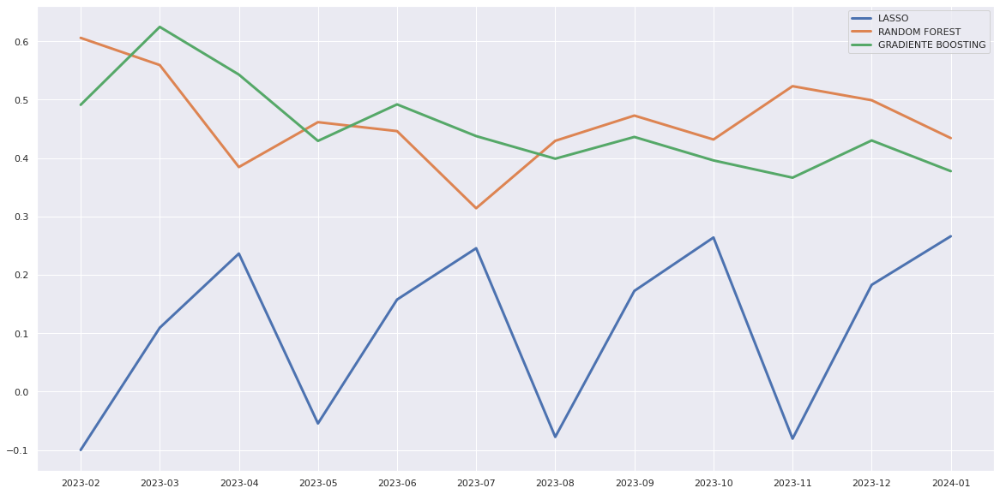

In [ ]:
plt.plot(pd.to_datetime(arima_dum_predict.index).strftime("%Y-%m"),arima_lasso, label='LASSO',linewidth=3)
plt.plot(pd.to_datetime(arima_dum_predict.index).strftime("%Y-%m"),arima_random, label='RANDOM FOREST',linewidth=3)
plt.plot(pd.to_datetime(arima_dum_predict.index).strftime("%Y-%m"),arima_gradien, label='GRADIENTE BOOSTING',linewidth=3)
plt.legend();